# Set environment

In [252]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [253]:
! rm -r '/Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/'
! mkdir '/Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/'

In [254]:
import os
os.chdir('/Users/ltran/Documents/TrueData29/CPC_ML_tutorial/')

import numpy as np
import pandas as pd
import pickle
from matplotlib import pyplot as plt
import seaborn as sns
import random

from pcntoolkit.normative import estimate, predict, evaluate
from pcntoolkit.util.utils import compute_MSLL, create_design_matrix
from nm_utils import calibration_descriptives, remove_bad_subjects, load_2d
from sklearn.model_selection import train_test_split

# Set data directory
data_dir = '/Users/ltran/Documents/Data/'

# Set working directory
root_dir = '/Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/'
out_dir = os.path.join(root_dir,'models','test')

# create the output directory if it does not already exist
os.makedirs(out_dir, exist_ok=True)

# LOAD DATA

## CONNECTIVITY

In [255]:
# Load correlation matrix
corr_matrix = pd.read_csv(os.path.join(data_dir, 'corr_matrix.csv'), sep = ';')

In [256]:
corr_matrix = corr_matrix.add_suffix('_connect')

In [257]:
# Format participant_id
participants = []
for i in corr_matrix['Unnamed: 0_connect']:
    participants.append(int(i.split('-')[1]))
    
corr_matrix['participant_id'] = participants


In [258]:
corr_matrix = corr_matrix.drop(columns = 'Unnamed: 0_connect')

## ANATOMY 

### RDB Data

In [356]:
# Load participants infos (age, sex, diagnosis, scores...)
new = pd.read_csv(os.path.join(data_dir, 'participants.tsv'), sep = "\t")
new = new.dropna(subset = ['age_at_first_scan']).drop(index = new.loc[new['ASD'] == '?'].index)

In [357]:
# Load cortical thickness of right and left hemisphere
lh_RDB = pd.read_csv(os.path.join(data_dir,'fs-6.0.0-tfe.lh.thickness.csv'), sep = '\t')
rh_RDB = pd.read_csv(os.path.join(data_dir,'fs-6.0.0-tfe.rh.thickness.csv'), sep = '\t')

In [358]:
# Convert BIDS ID to int format
l_part_id = []
for i in lh_RDB['lh.aparc.thickness']:
    
    l_part_id.append(int(i.split('-')[1].split('_')[0].lstrip('0')))
lh_RDB['participant_id'] = l_part_id

In [359]:
# Merge right and left hemisphere
df_RDB = lh_RDB.join(rh_RDB.drop(columns = ['BrainSegVolNotVent', 'eTIV'])).merge(new, on = 'participant_id', how = 'inner')


In [360]:
# Format 'sex' as boolean
df_RDB['sex'] = df_RDB['sex'].replace({'F' : -1, 'M' : 1})
#Drop duplicates
df_RDB = df_RDB.drop_duplicates(subset = ['participant_id'])

In [361]:
# Load clinical scores
clinic_rdb = pd.read_csv(os.path.join(data_dir, 'MRI_RDB_20190423_anonym_updated.tsv'), sep = '\t')

In [362]:
clinic_rdb['participant_id'] = clinic_rdb['subject_id']

In [363]:
# Match clinical scores names of RDB and EU-AIMS
clinic_rdb = clinic_rdb.rename( columns = {'ADI_R_SOCIAL_TOTAL_A': 't1_adi_social_total',
    'ADI_R_RRB_TOTAL_C' :'t1_adi_rrb_total',
    'RBS-R tot': 't1_rbs_total',
    'SRS': 't1_srs_tscore'})

In [364]:
df_RDB = clinic_rdb.merge(df_RDB, on = ['participant_id', 'ASD']).drop_duplicates(subset = ['participant_id'])

Removing failed QC from RDB data

In [365]:
QC_rdb = pd.read_csv(os.path.join(data_dir, 'QC_trio.csv'))

f_id = []
for i in QC_rdb.loc[QC_rdb.QC == 'F'].BIDS:
    f_id.append(int(i.split('-')[1].strip('0')))

In [366]:
df_RDB = df_RDB.loc[~df_RDB['subject_id'].isin(f_id)]

###  EU-AIMS Data

In [367]:
# Load EU-AIMS data
QC = pd.read_csv(os.path.join(data_dir,'QC_LEAP_freesurfer_preproc_info.csv'), sep = ';')

leap = pd.read_csv(os.path.join(data_dir,'LEAP_CorticalMeasuresENIGMA_ThickAvg.csv'), sep = ';')

cov = pd.read_csv(os.path.join(data_dir,'Core_variables_03_09_19_withvalues_internal.tsv'), sep = '\t')

In [368]:
# Merge autism scores with QC file, keep 'include' only
df_cov_aims = cov.merge(QC.loc[QC['final_decision_bin'] == "include"], on = "participant_id", how = "inner")

In [369]:
# ID to int format
l_id  = []
for i in leap['SubjID']:
    l_id.append(int(i.split('_')[1]))

leap['participant_id'] = l_id

In [370]:
# Merge thickness values with infos
df_aims = leap.merge(df_cov_aims, on = 'participant_id', how = 'inner')

### Pooling EU-AIMS et RDB

In [371]:
# Rename columns of EU-AIMS dataframe to merge with RDB
df_aims.columns = df_aims.columns.str.replace('L_','lh_')
df_aims.columns = df_aims.columns.str.replace('_thickavg','_thickness')
df_aims.columns = df_aims.columns.str.replace('R_','rh_')

df_aims = df_aims.rename(columns = {'t1_ageyrs' : 'age_at_first_scan', 't1_sex' : 'sex', 't1_fsiq' : 'Total_IQ'})
df_aims['ASD'] = df_aims['t1_diagnosis'].replace({1 : 'No', 2 : 'Yes'})

In [372]:
# All columns 'site' to RDB dataframe 
df_RDB['site'] = 'RDB'
df_RDB['t1_site'] = 9

In [373]:
# Extract name of the regions
cols_RDB = [col for col in df_RDB.columns if '_thick' in col]

cols_RDB.remove('rh_MeanThickness_thickness')
cols_RDB.remove('lh_MeanThickness_thickness')

In [374]:
# Merge EU-AIMS and RDB dataframes
df_all = df_aims.merge(df_RDB, on = cols_RDB.append(['age_at_first_scan', 
                                                     'sex', 'site', 
                                                     't1_site',
                                                    't1_adi_social_total',
                                                    't1_adi_rrb_total',
                                                    't1_rbs_total',
                                                    't1_srs_tscore']), how = 'outer')
df_all

,SubjID,lh_bankssts_thickness,lh_caudalanteriorcingulate_thickness,lh_caudalmiddlefrontal_thickness,lh_cuneus_thickness,lh_entorhinal_thickness,lh_fusiform_thickness,lh_inferiorparietal_thickness,lh_inferiortemporal_thickness,lh_isthmuscingulate_thickness,...,group,IQ_Instrument,cognitive_level,Max_IQ,Performance_IQ,Verbal_IQ,developmental_quotient,abide2_code,DNA_Fusion_code,MRI_code_old
0,PCS2_100693509718,2.650,2.386,2.736,1.870,3.599,3.067,2.410,3.077,2.633,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,PCS2_101129844643,2.966,3.473,2.703,2.066,3.766,3.198,2.881,3.143,2.705,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,PCS2_101414625982,3.051,3.020,3.120,2.411,3.189,3.232,2.804,3.417,2.692,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PCS2_101900205031,2.874,2.838,2.698,2.115,3.353,3.140,2.650,3.152,2.665,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,PCS2_104324981539,2.941,3.416,2.483,2.298,3.431,2.928,2.711,3.156,2.886,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1423,NaN,2.986,3.132,2.815,2.483,3.601,2.928,2.800,3.079,2.556,...,Patient,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1424,NaN,2.949,3.127,3.159,2.723,3.275,3.222,3.071,3.344,2.641,...,Patient,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1425,NaN,3.462,2.555,2.917,2.249,4.046,3.196,3.097,3.308,2.336,...,Patient,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1426,NaN,3.118,3.158,3.260,2.682,3.239,3.260,3.118,3.239,2.684,...,Patient,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## MERGE ANAT & CONNECT

In [375]:
df_connect = new.merge(corr_matrix, on = 'participant_id')

In [327]:
all_cols = [col for col in df_connect.columns if '_connect' in col]


# DEFINE ROIs

In [348]:
# Extract names for each region
all_cols = [col for col in df_all.columns if '_thick' in col]
all_cols.remove('lh_MeanThickness_thickness')
all_cols.remove('rh_MeanThickness_thickness')

In [349]:
print('ROIs count : ', len(all_cols))

ROIs count :  68


### // Sum on total, left or right hemisphere (optional)

In [351]:
Lcols = [col for col in all_cols if 'lh_' in col]
Rcols = [col for col in all_cols if 'rh_' in col]

df_all['L_sum'] = df_all[Lcols].sum(axis = 1)
df_all['R_sum'] = df_all[Rcols].sum(axis =1)
df_all['T_sum'] = df_all[all_cols].sum(axis = 1)

# PLOT RAW DATA

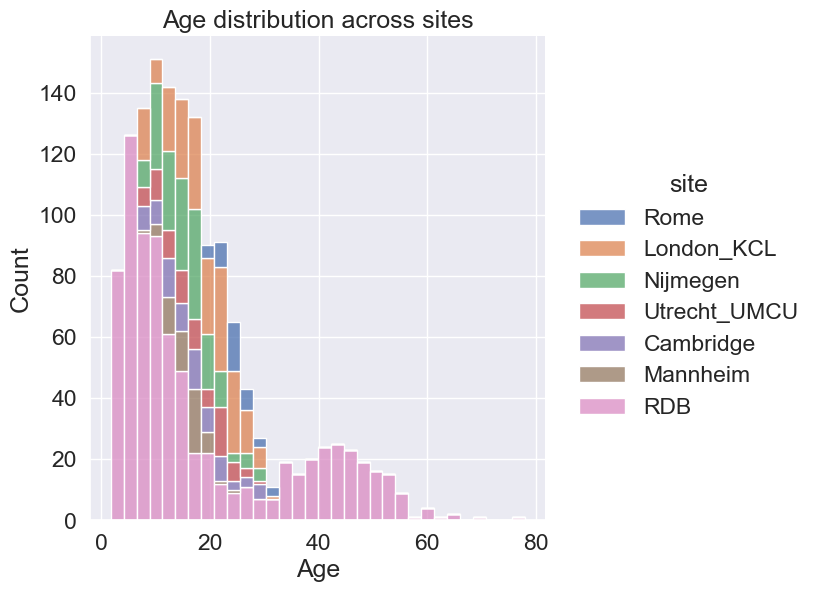

In [352]:
sns.set(font_scale=1.5, style='darkgrid')
sns.displot(df_all, x="age_at_first_scan", hue="site", multiple="stack", height=6).set(xlabel = 'Age', title = 'Age distribution across sites')

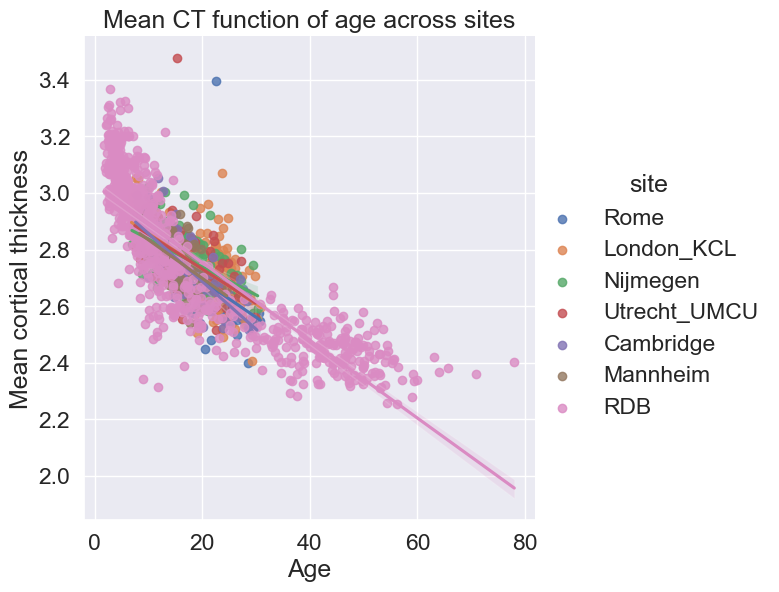

In [353]:
df_all_avg = df_all.copy()
df_all_avg['Avg'] = df_all_avg[all_cols].mean(axis = 1)

sns.set_theme(style="darkgrid",font_scale=1.5)
c = sns.lmplot(data=df_all_avg, x="age_at_first_scan", y='Avg', hue="site", height=6).set(xlabel = 'Age', ylabel = 'Mean cortical thickness', title = 'Mean CT function of age across sites')

plt.show()

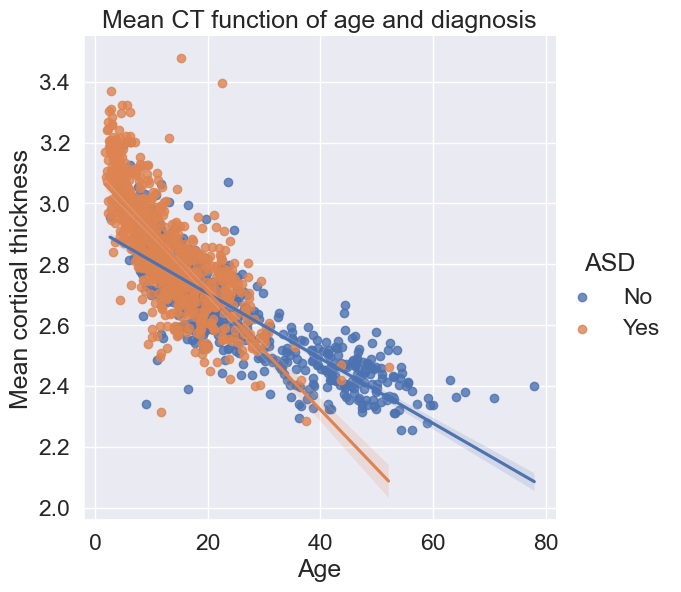

In [354]:
sns.set_theme(style="darkgrid",font_scale=1.5)
c = sns.lmplot(data=df_all_avg, x="age_at_first_scan", y='Avg', hue="ASD", height=6).set(xlabel = 'Age', ylabel = 'Mean cortical thickness').set(title = 'Mean CT function of age and diagnosis')

plt.show()

# SET COVARIABLES AND MODEL PARAMETERS

In [376]:
temp_bool = input('Using Total IQ as covariate for model fit ? (yes/no)\n')

Using Total IQ as covariate for model fit ? (yes/no)
no


In [377]:
# Clean NA for IQ (if used as covariate)
if (temp_bool == 'yes'):

    df_all = df_all.dropna(subset = ['Total_IQ'])
    df_control = df_all[df_all['ASD'] == 'No']
    df_asd = df_all[df_all['ASD'] == 'Yes']
else:
    df_control = df_all[df_all['ASD'] == 'No']
    df_asd = df_all[df_all['ASD'] == 'Yes']

In [378]:
# Choosing covariates
if (temp_bool == 'no'):
    cols_cov = ['age_at_first_scan','sex']
elif (temp_bool == 'yes'):
    cols_cov = ['age_at_first_scan','sex', 'Total_IQ']
fixed_effect = 'site'

# Choosign IDP (response variable)
idp_ids = all_cols

# Type of Warping 
warp =  'WarpSinArcsinh'


# B-Spline limits
xmin = -3 # ~ age min - 5 
xmax = 83 # ~ age max + 5

force_refit = True 

# Threshold for outliers
outlier_thresh = 5


In [379]:
print('Count of NA in covariates')
df_all[cols_cov].isna().sum()

Count of NA in covariates


age_at_first_scan    0
sex                  0
dtype: int64

# RUN BLR

You can predict Z-scores either on TD+ASD (e.g. plot, case-control analysis) or on ASD only (e.g. clustering, correlations)

In [380]:
pred_bool = input("Prediction on TD + ASD : 1 \nPrédiction on ASD only : 2\n")

Prediction on TD + ASD : 1 
Prédiction on ASD only : 2
2


In [381]:
n_boot = int(input('Boostrap iterations\n'))

Boostrap iterations
1


In [382]:
# Metric DataFrame
metric_analysis = pd.DataFrame(columns = ['ROIs', 'EV mean', 'EV max', 'MSLL mean', 'MSLL min', 'Covs', 'Fixed effect', 'xmin', 'xmax', 'Outlier Thresh'])
for i in range(n_boot):
    
    if (pred_bool == '1'):
        
        df_control = df_all[df_all['ASD'] == 'No']

        shuffled = df_control.sample(frac=1)
        result = np.array_split(shuffled, 3)
        df_tr = result[0]
        df_te1 = result[1]
        df_te2 = pd.concat([df_asd, result[2]]).reset_index()
    
    elif (pred_bool == '2'):
        
        shuffled = df_control.sample(frac=1)
        result = np.array_split(shuffled, 2)
        df_tr = result[0]
        df_te1 = result[1]
        df_te2 = df_asd


    site_ids = set(df_all['site'])
    site_ids_tr = set(df_tr['site'])
    site_ids_te = set(df_te1['site'])
    
    
    for idp_num, idp in enumerate(idp_ids): 
        print('Running IDP', idp_num, idp, ':')

        # set output dir 
        idp_dir = os.path.join(out_dir, idp)
        os.makedirs(os.path.join(idp_dir), exist_ok=True)
        os.chdir(idp_dir)

        # extract the response variables for training and test set
        y_tr = df_tr[idp].to_numpy() 
        y_te = df_te1[idp].to_numpy()

        # remove gross outliers and implausible values
        yz_tr = (y_tr - np.mean(y_tr)) / np.std(y_tr)
        yz_te = (y_te - np.mean(y_te)) / np.std(y_te)
        nz_tr = np.bitwise_and(np.abs(yz_tr) < outlier_thresh, y_tr > 0)
        nz_te = np.bitwise_and(np.abs(yz_te) < outlier_thresh, y_te > 0)
        y_tr = y_tr[nz_tr]
        y_te = y_te[nz_te]

        # write out the response variables for training and test
        resp_file_tr = os.path.join(idp_dir, 'resp_tr.txt')
        resp_file_te = os.path.join(idp_dir, 'resp_te.txt') 
        np.savetxt(resp_file_tr, y_tr)
        np.savetxt(resp_file_te, y_te)

        # configure the design matrix
        X_tr = create_design_matrix(df_tr[cols_cov].loc[nz_tr], 
                                    site_ids = df_tr['site'].loc[nz_tr],
                                    basis = 'bspline', 
                                    xmin = xmin, 
                                    xmax = xmax)
        X_te = create_design_matrix(df_te1[cols_cov].loc[nz_te], 
                                    site_ids = df_te1['site'].loc[nz_te], 
                                    all_sites=site_ids,
                                    basis = 'bspline', 
                                    xmin = xmin, 
                                    xmax = xmax)

        # configure and save the covariates
        cov_file_tr = os.path.join(idp_dir, 'cov_bspline_tr.txt')
        cov_file_te = os.path.join(idp_dir, 'cov_bspline_te.txt')
        np.savetxt(cov_file_tr, X_tr)
        np.savetxt(cov_file_te, X_te)

        if not force_refit and os.path.exists(os.path.join(idp_dir, 'Models', 'NM_0_0_estimate.pkl')):
            print('Making predictions using a pre-existing model...')
            suffix = 'predict'

            # Make prdictsion with test data
            predict(cov_file_te, 
                    alg='blr', 
                    respfile=resp_file_te, 
                    model_path=os.path.join(idp_dir,'Models'),
                    outputsuffix=suffix)
        else:
            print('Estimating the normative model...')
            estimate(cov_file_tr, resp_file_tr, testresp=resp_file_te, 
                     testcov=cov_file_te, alg='blr', optimizer = 'l-bfgs-b', 
                     savemodel=True, warp=warp, warp_reparam=True)
            suffix = 'estimate'
    blr_metrics = pd.DataFrame(columns = ['eid', 'NLL', 'EV', 'MSLL', 'BIC','Skew','Kurtosis'])

    for idp_num, idp in enumerate(idp_ids): 
        idp_dir = os.path.join(out_dir, idp)

        # load the predictions and true data. We use a custom function that ensures 2d arrays
        # equivalent to: y = np.loadtxt(filename); y = y[:, np.newaxis]
        yhat_te = load_2d(os.path.join(idp_dir, 'yhat_' + suffix + '.txt'))
        s2_te = load_2d(os.path.join(idp_dir, 'ys2_' + suffix + '.txt'))
        y_te = load_2d(os.path.join(idp_dir, 'resp_te.txt'))

        with open(os.path.join(idp_dir,'Models', 'NM_0_0_estimate.pkl'), 'rb') as handle:
            nm = pickle.load(handle) 

        # compute error metrics
        if warp is None:
            metrics = evaluate(y_te, yhat_te)  

            # compute MSLL manually as a sanity check
            y_tr_mean = np.array( [[np.mean(y_tr)]] )
            y_tr_var = np.array( [[np.var(y_tr)]] )
            MSLL = compute_MSLL(y_te, yhat_te, s2_te, y_tr_mean, y_tr_var)         
        else:
            warp_param = nm.blr.hyp[1:nm.blr.warp.get_n_params()+1] 
            W = nm.blr.warp

            # warp predictions
            med_te = W.warp_predictions(np.squeeze(yhat_te), np.squeeze(s2_te), warp_param)[0]
            med_te = med_te[:, np.newaxis]

            # evaluation metrics
            metrics = evaluate(y_te, med_te)

            # compute MSLL manually
            y_te_w = W.f(y_te, warp_param)
            y_tr_w = W.f(y_tr, warp_param)
            y_tr_mean = np.array( [[np.mean(y_tr_w)]] )
            y_tr_var = np.array( [[np.var(y_tr_w)]] )
            MSLL = compute_MSLL(y_te_w, yhat_te, s2_te, y_tr_mean, y_tr_var)     

        Z = np.loadtxt(os.path.join(idp_dir, 'Z_' + suffix + '.txt'))
        [skew, sdskew, kurtosis, sdkurtfddfosis, semean, sesd] = calibration_descriptives(Z)

        BIC = len(nm.blr.hyp) * np.log(y_tr.shape[0]) + 2 * nm.neg_log_lik

        blr_metrics.loc[len(blr_metrics)] = [idp, nm.neg_log_lik, metrics['EXPV'][0], 
                                             MSLL[0], BIC, skew, kurtosis]

    display(blr_metrics)

    blr_metrics.to_csv(os.path.join(out_dir,'blr_metrics.csv'))
    new_row = {'ROIs' : len(idp_ids) , 'EV mean': blr_metrics['EV'].mean(), 'EV max' : blr_metrics['EV'].max() , 'MSLL mean': blr_metrics['MSLL'].mean(), 'MSLL min' : blr_metrics['MSLL'].min(), 'Covs' : cols_cov, 'Fixed effect' : fixed_effect , 'xmin' : xmin, 'xmax' : xmax, 'Outlier Thresh' : outlier_thresh}
    metric_analysis = metric_analysis.append(new_row, ignore_index=True)

Running IDP 0 lh_bankssts_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_bankssts_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 1 lh_caudalanteriorcingulate_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_caudalanteriorcingulate_thickness/resp_tr.txt


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.80041e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.76339e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.32719e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 2 lh_caudalmiddlefrontal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_caudalmiddlefrontal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 3 lh_cuneus_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_cuneus_thickness/resp_tr.txt


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.62645e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.0113e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.67659e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 4 lh_entorhinal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_entorhinal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 5 lh_fusiform_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_fusiform_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 6 lh_inferiorparietal_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.55224e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.55615e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.57883e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.30414e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_inferiorparietal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 7 lh_inferiortemporal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_inferiortemporal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.85451e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.13524e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.8347e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.48812e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mod

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 8 lh_isthmuscingulate_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_isthmuscingulate_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 9 lh_lateraloccipital_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_lateraloccipital_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 10 lh_lateralorbitofrontal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_lateralorbitofrontal_thickness/resp_tr.t

/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.06547e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.10823e-20): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.83639e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_medialorbitofrontal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 13 lh_middletemporal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_middletemporal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.67431e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.32776e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.70759e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.04171e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 14 lh_parahippocampal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_parahippocampal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.14388e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.67806e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.16606e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=8.48594e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 15 lh_paracentral_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_paracentral_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 16 lh_parsopercularis_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_parsopercularis_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 17 lh_parsorbitalis_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_parsorbitalis_thickness/resp_tr.txt
Estimating model  1 o

/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.79508e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.57406e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.83169e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Evaluating the model ...
Writing outputs ...
Running IDP 18 lh_parstriangularis_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_parstriangularis_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 19 lh_pericalcarine_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.53142e-17): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.27829e-17): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.07915e-17): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.7973e-17): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mod

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_pericalcarine_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 20 lh_postcentral_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_postcentral_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 21 lh_posteriorcingulate_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_posteriorcingulate_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model 

/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.36811e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.06936e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.60761e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.45358e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_precentral_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 23 lh_precuneus_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.44244e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.62217e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.47136e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.24082e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_precuneus_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 24 lh_rostralanteriorcingulate_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_rostralanteriorcingulate_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.34062e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.3117e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.30552e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.6724e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mode

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 25 lh_rostralmiddlefrontal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_rostralmiddlefrontal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.75914e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.38493e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=9.45656e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.71335e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 26 lh_superiorfrontal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_superiorfrontal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 27 lh_superiorparietal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_superiorparietal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 28 lh_superiortemporal_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.03165e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.26143e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.86234e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_superiortemporal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 29 lh_supramarginal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_supramarginal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.27029e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.41181e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.42765e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 30 lh_frontalpole_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_frontalpole_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 31 lh_temporalpole_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.70942e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.87437e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.4675e-20): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.13059e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mod

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_temporalpole_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 32 lh_transversetemporal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_transversetemporal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 33 lh_insula_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.69638e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.21362e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.33579e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=8.0038e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mod

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/lh_insula_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 34 rh_bankssts_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_bankssts_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 35 rh_caudalanteriorcingulate_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_caudalanteriorcingulate_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...

/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=8.21263e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.82234e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.61826e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.29627e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Evaluating the model ...
Writing outputs ...
Running IDP 38 rh_entorhinal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_entorhinal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.67181e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.92233e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.0752e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.26871e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mod

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 39 rh_fusiform_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_fusiform_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 40 rh_inferiorparietal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_inferiorparietal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.61012e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.18466e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.62778e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=8.70197e-18): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 41 rh_inferiortemporal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_inferiortemporal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 42 rh_isthmuscingulate_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_isthmuscingulate_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 43 rh_lateraloccipital_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_lateraloccipital_thickness/resp_tr.txt
Est

/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.03843e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.58448e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.08249e-20): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 44 rh_lateralorbitofrontal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_lateralorbitofrontal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.94831e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.5142e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.49726e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.94834e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mod

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 45 rh_lingual_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_lingual_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 46 rh_medialorbitofrontal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_medialorbitofrontal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 47 rh_middletemporal_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.90079e-18): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.16901e-18): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.26638e-18): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.55026e-18): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_middletemporal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 48 rh_parahippocampal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_parahippocampal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.28718e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.46122e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.15715e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.50445e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 49 rh_paracentral_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_paracentral_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 50 rh_parsopercularis_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.77551e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=8.64748e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.23673e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.4188e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mod

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_parsopercularis_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 51 rh_parsorbitalis_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.51369e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.52337e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.3294e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_parsorbitalis_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 52 rh_parstriangularis_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_parstriangularis_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.33272e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.67466e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.30549e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.07935e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 53 rh_pericalcarine_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_pericalcarine_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 54 rh_postcentral_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_postcentral_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 55 rh_posteriorcingulate_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_posteriorcingulate_thickness/resp_tr.txt
Estimating mode

/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.73083e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.44548e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=9.52937e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.16587e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_precuneus_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 58 rh_rostralanteriorcingulate_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_rostralanteriorcingulate_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.33946e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.12907e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.61359e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.42903e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 59 rh_rostralmiddlefrontal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_rostralmiddlefrontal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 60 rh_superiorfrontal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_superiorfrontal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 61 rh_superiorparietal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_superiorparietal_thickness/resp_tr.t

/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.27054e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.70563e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.21657e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_superiortemporal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 63 rh_supramarginal_thickness :


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.49363e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.39965e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.50375e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.55004e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_supramarginal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 64 rh_frontalpole_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_frontalpole_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.30516e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=6.25985e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.06315e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=3.17522e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 65 rh_temporalpole_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_temporalpole_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.37701e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.34791e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=4.97375e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=5.64983e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/mo

Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 66 rh_transversetemporal_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_transversetemporal_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...
Running IDP 67 rh_insula_thickness :
Estimating the normative model...
Processing data in /Users/ltran/Documents/TrueData0104/CPC_ML_tutorial/models/test/rh_insula_thickness/resp_tr.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Saving model meta-data...
Evaluating the model ...
Writing outputs ...


/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=7.41382e-22): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.97359e-23): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)
/Users/ltran/opt/anaconda3/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.39367e-21): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


,eid,NLL,EV,MSLL,BIC,Skew,Kurtosis
0,lh_bankssts_thickness,-28.607963,0.489000,-2.233230,-34.282561,0.621668,1.220882
1,lh_caudalanteriorcingulate_thickness,48.343236,0.465715,-2.533149,119.619838,-0.312441,0.259433
2,lh_caudalmiddlefrontal_thickness,-40.567811,0.504410,-2.574856,-58.202258,0.353864,0.379843
3,lh_cuneus_thickness,-49.631406,0.376950,-8.804301,-76.329448,0.581189,0.899878
4,lh_entorhinal_thickness,111.621784,-0.029079,-0.734774,246.176933,-0.008381,-0.152937
...,...,...,...,...,...,...,...
63,rh_supramarginal_thickness,-39.554620,0.651160,-2.432633,-56.175874,0.290104,0.480149
64,rh_frontalpole_thickness,81.061874,0.354372,-1.141384,185.057112,-0.029122,0.762610
65,rh_temporalpole_thickness,120.140953,-0.019605,-3.484215,263.215271,-0.192996,-0.127785
66,rh_transversetemporal_thickness,34.664174,0.366976,-2.435543,92.261712,0.478318,0.729301


/var/folders/p5/qymxnxk12156bhtw2jlf3sb40000gr/T/ipykernel_22970/754352374.py:142: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metric_analysis = metric_analysis.append(new_row, ignore_index=True)


## Output : metrics for model evaluation

In [383]:
# Metrics for each boostrap iteration
metric_analysis

,ROIs,EV mean,EV max,MSLL mean,MSLL min,Covs,Fixed effect,xmin,xmax,Outlier Thresh
0,68,0.461766,0.73869,-3.208352,-11.622931,"[age_at_first_scan, sex]",site,-3,83,5


In [384]:
# Metrics mean computed after bootstraping 
metric_analysis.describe()

,ROIs,EV mean,EV max,MSLL mean,MSLL min,Covs,Fixed effect,xmin,xmax,Outlier Thresh
count,1,1.000000,1.00000,1.000000,1.000000,1,1,1,1,1
unique,1,1.000000,1.00000,1.000000,1.000000,1,1,1,1,1
top,68,0.461766,0.73869,-3.208352,-11.622931,"[age_at_first_scan, sex]",site,-3,83,5
freq,1,1.000000,1.00000,1.000000,1.000000,1,1,1,1,1


# MAKE PREDICTIONS

Compute Z-Scores 

In [385]:
for idp_num, idp in enumerate(idp_ids): 
    print('Running IDP', idp_num, idp, ':')
    idp_dir = os.path.join(out_dir, idp)
    os.chdir(idp_dir)
    
    # extract and save the response variables for the test set
    y_te = df_te2[idp].to_numpy()
    
    # save the variables
    resp_file_te = os.path.join(idp_dir, 'resp_te.txt') 
    np.savetxt(resp_file_te, y_te)

    # configure and save the design matrix
    cov_file_te = os.path.join(idp_dir, 'cov_bspline_te.txt')
    X_te = create_design_matrix(df_te2[cols_cov], 
                                site_ids = df_te2['site'],
                                all_sites = site_ids_tr,
                                basis = 'bspline', 
                                xmin = xmin, 
                                xmax = xmax)
    np.savetxt(cov_file_te, X_te)
    
    # check whether all sites in the test set are represented in the training set
    if all(elem in site_ids_tr for elem in site_ids_te):
        print('All sites are present in the training data')
        
        # just make predictions
        yhat_te, s2_te, Z = predict(cov_file_te, 
                                    alg='blr', 
                                    respfile=resp_file_te, 
                                    model_path=os.path.join(idp_dir,'Models'))
    else:
        print('Some sites missing from the training data. Adapting model')
        
        # save the covariates for the adaptation data
        X_ad = create_design_matrix(df_ad[cols_cov], 
                                    site_ids = df_ad['site'],
                                    all_sites = site_ids_tr,
                                    basis = 'bspline', 
                                    xmin = xmin, 
                                    xmax = xmax)
        cov_file_ad = os.path.join(idp_dir, 'cov_bspline_ad.txt')          
        np.savetxt(cov_file_ad, X_ad)
        
        # save the responses for the adaptation data
        resp_file_ad = os.path.join(idp_dir, 'resp_ad.txt') 
        y_ad = df_ad[idp].to_numpy()
        np.savetxt(resp_file_ad, y_ad)
       
        # save the site ids for the adaptation data
        sitenum_file_ad = os.path.join(idp_dir, 'sitenum_ad.txt') 
        site_num_ad = df_ad['sitenum'].to_numpy(dtype=int)
        np.savetxt(sitenum_file_ad, site_num_ad)
        
        # save the site ids for the test data 
        sitenum_file_te = os.path.join(idp_dir, 'sitenum_te.txt')
        site_num_te = df_te2['sitenum'].to_numpy(dtype=int)
        np.savetxt(sitenum_file_te, site_num_te)
         
        yhat_te, s2_te, Z = predict(cov_file_te, 
                                    alg = 'blr', 
                                    respfile = resp_file_te, 
                                    model_path = os.path.join(idp_dir,'Models'),
                                    adaptrespfile = resp_file_ad,
                                    adaptcovfile = cov_file_ad,
                                    adaptvargroupfile = sitenum_file_ad,
                                    testvargroupfile = sitenum_file_te)

Running IDP 0 lh_bankssts_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 1 lh_caudalanteriorcingulate_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 2 lh_caudalmiddlefrontal_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 3 lh_cuneus_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 4 lh_entorhinal_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations

Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 41 rh_inferiortemporal_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 42 rh_isthmuscingulate_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 43 rh_lateraloccipital_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 44 rh_lateralorbitofrontal_thickness :
All sites are present in the training data
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 45 rh_lingual_thickness :
All s

# PLOT

In [182]:
sex = int(input('Which sex do you want to plot ? (1 = male, -1 = female)\n'))

Which sex do you want to plot ? (1 = male, -1 = female)
1


In [183]:
if sex == 1: 
    clr = 'blue';
else:
    clr = 'red'

# create dummy data for visualisation
print('configuring dummy data ...')
xx = np.arange(xmin, xmax, 0.5)
X0_dummy = np.zeros((len(xx), 2))
X0_dummy[:,0] = xx
X0_dummy[:,1] = sex

# create the design matrix
X_dummy = create_design_matrix(X0_dummy, xmin=xmin, xmax=xmax, 
                               site_ids=None, 
                               all_sites=site_ids_tr
                              )

# save the dummy covariates
cov_file_dummy = os.path.join(out_dir,'cov_bspline_dummy_mean.txt')
np.savetxt(cov_file_dummy, X_dummy)

configuring dummy data ...


Running IDP 0 lh_bankssts_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20838878]), 'Rho': array([0.59187837]), 'pRho': array([2.83676068e-83]), 'SMSE': array([0.66541861]), 'EXPV': array([0.34032897])}


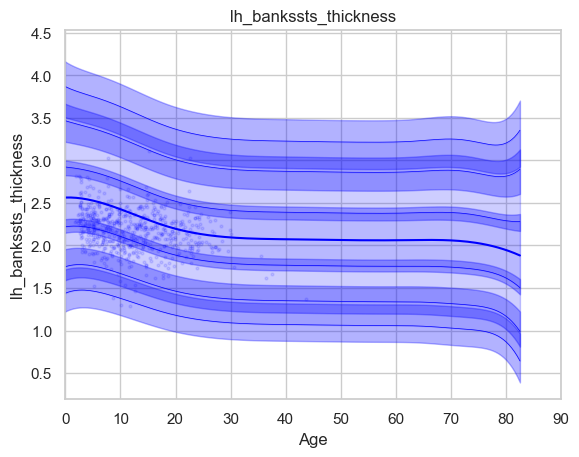

Running IDP 1 lh_caudalanteriorcingulate_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.30460115]), 'Rho': array([0.27646164]), 'pRho': array([7.41721424e-16]), 'SMSE': array([0.93547374]), 'EXPV': array([0.06519865])}


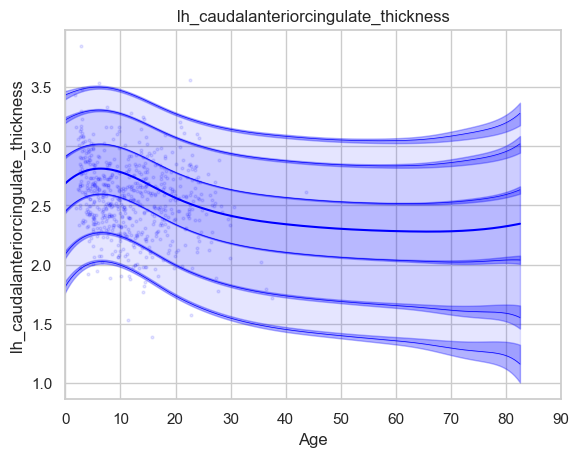

Running IDP 2 lh_caudalmiddlefrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21992984]), 'Rho': array([0.14797734]), 'pRho': array([2.28759939e-05]), 'SMSE': array([1.14939296]), 'EXPV': array([-0.02093669])}


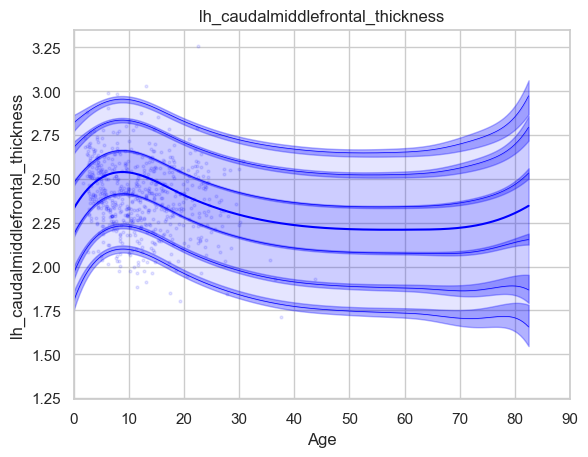

Running IDP 3 lh_cuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.25727883]), 'Rho': array([0.4739741]), 'pRho': array([1.67476265e-48]), 'SMSE': array([1.04521476]), 'EXPV': array([0.20201805])}


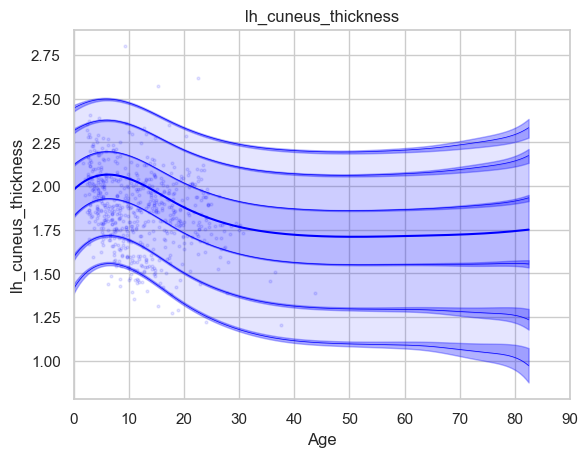

Running IDP 4 lh_entorhinal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.47958627]), 'Rho': array([-0.26330605]), 'pRho': array([1.85412761e-14]), 'SMSE': array([1.55358297]), 'EXPV': array([-0.23070673])}


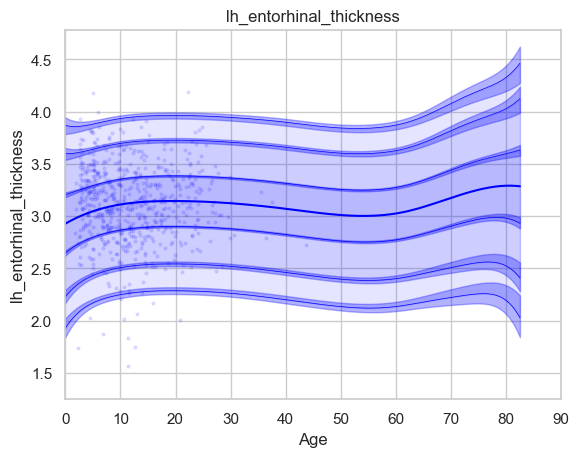

Running IDP 5 lh_fusiform_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16815903]), 'Rho': array([0.60295569]), 'pRho': array([1.9113641e-87]), 'SMSE': array([0.71257284]), 'EXPV': array([0.30288284])}


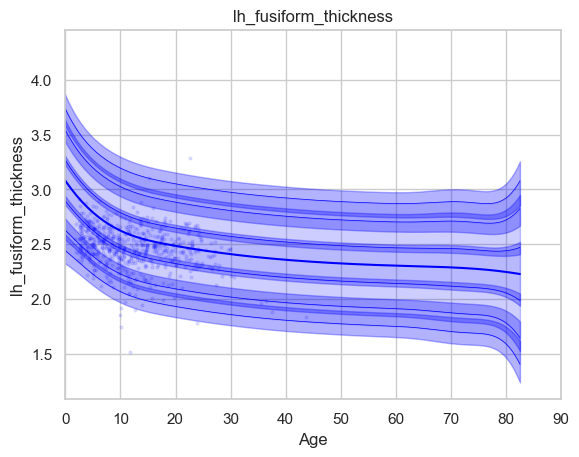

Running IDP 6 lh_inferiorparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16263468]), 'Rho': array([0.7485351]), 'pRho': array([5.13915212e-167]), 'SMSE': array([0.45184294]), 'EXPV': array([0.56010453])}


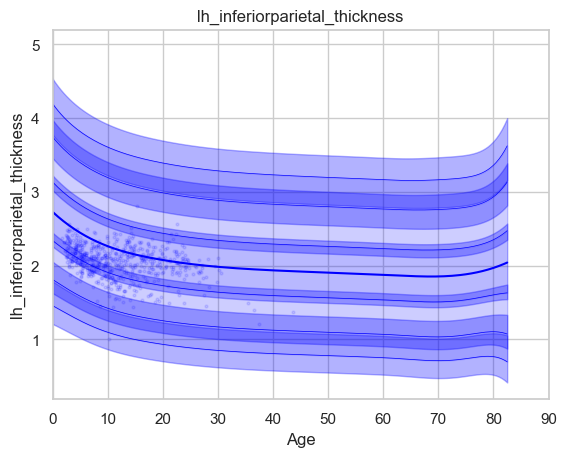

Running IDP 7 lh_inferiortemporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18652704]), 'Rho': array([0.5958082]), 'pRho': array([9.8757443e-85]), 'SMSE': array([0.68479138]), 'EXPV': array([0.32095882])}


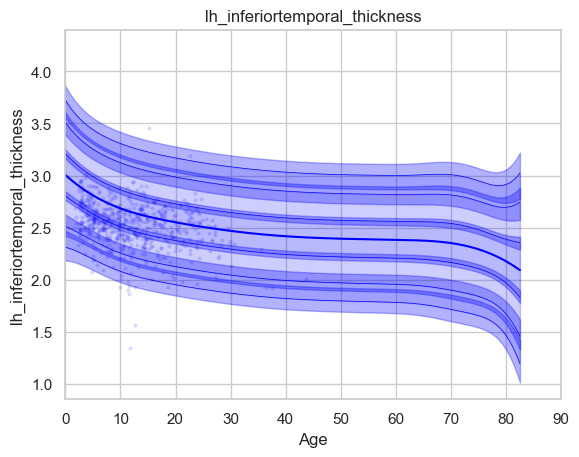

Running IDP 8 lh_isthmuscingulate_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.26409548]), 'Rho': array([-0.05877467]), 'pRho': array([0.09460671]), 'SMSE': array([1.26846906]), 'EXPV': array([-0.22648988])}


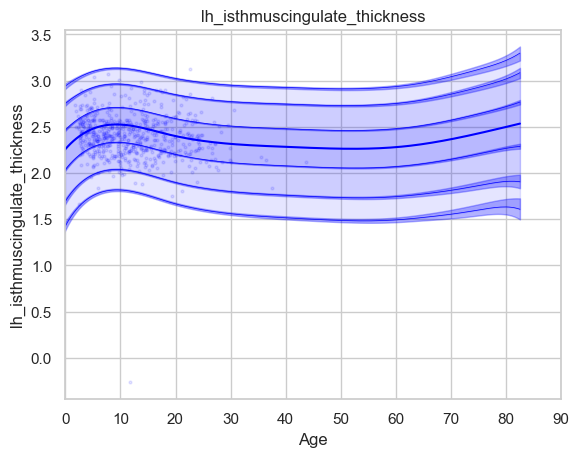

Running IDP 9 lh_lateraloccipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19884457]), 'Rho': array([0.55257505]), 'pRho': array([6.9020727e-70]), 'SMSE': array([0.87798259]), 'EXPV': array([0.2909668])}


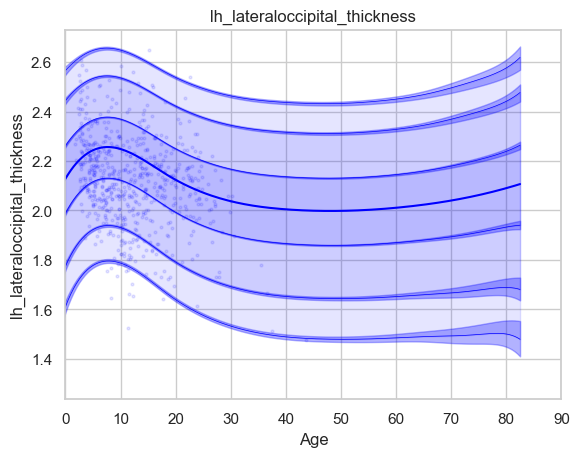

Running IDP 10 lh_lateralorbitofrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19235673]), 'Rho': array([0.77029589]), 'pRho': array([5.54842634e-185]), 'SMSE': array([0.41157592]), 'EXPV': array([0.59331834])}


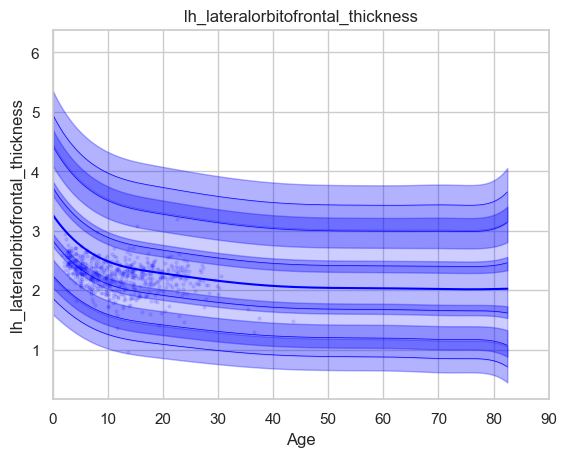

Running IDP 11 lh_lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21341335]), 'Rho': array([0.51076512]), 'pRho': array([9.99630593e-58]), 'SMSE': array([1.0566849]), 'EXPV': array([0.23969163])}


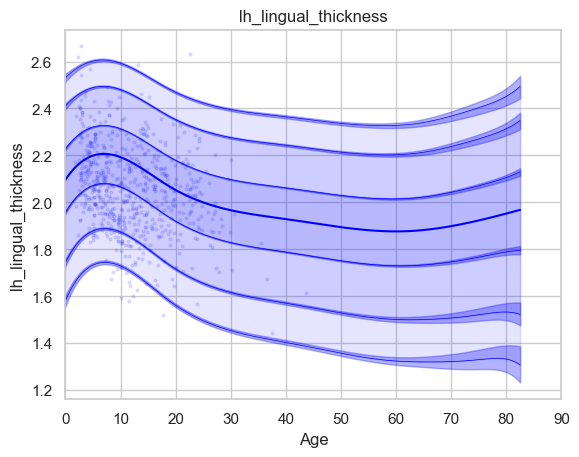

Running IDP 12 lh_medialorbitofrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20312193]), 'Rho': array([0.78859527]), 'pRho': array([4.45919821e-202]), 'SMSE': array([0.38319971]), 'EXPV': array([0.61732725])}


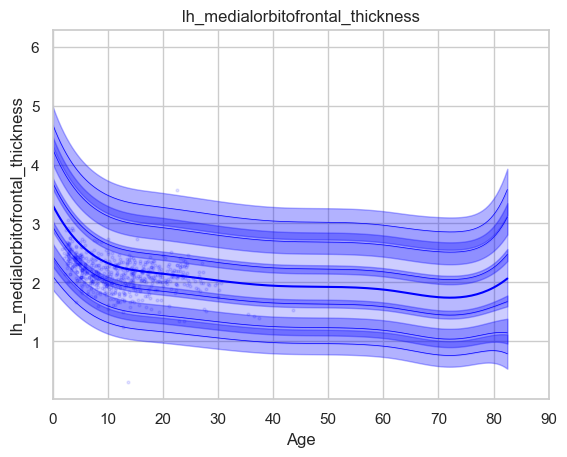

Running IDP 13 lh_middletemporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19973372]), 'Rho': array([0.55068601]), 'pRho': array([2.70131482e-69]), 'SMSE': array([0.74813808]), 'EXPV': array([0.26645192])}


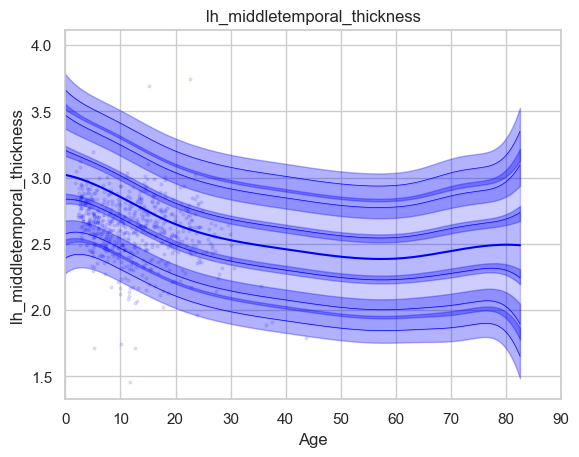

Running IDP 14 lh_parahippocampal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.40574993]), 'Rho': array([-0.05568731]), 'pRho': array([0.11328725]), 'SMSE': array([1.36344043]), 'EXPV': array([-0.17742304])}


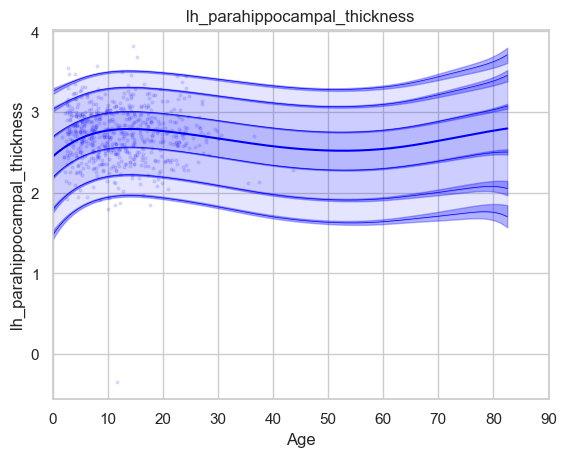

Running IDP 15 lh_paracentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.2602154]), 'Rho': array([0.22967656]), 'pRho': array([3.07165322e-11]), 'SMSE': array([1.19157169]), 'EXPV': array([0.02357794])}


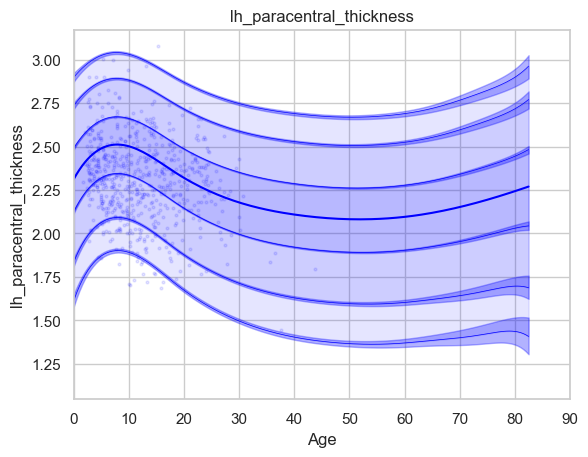

Running IDP 16 lh_parsopercularis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21685008]), 'Rho': array([0.21603784]), 'pRho': array([4.50646857e-10]), 'SMSE': array([1.09118536]), 'EXPV': array([0.03397945])}


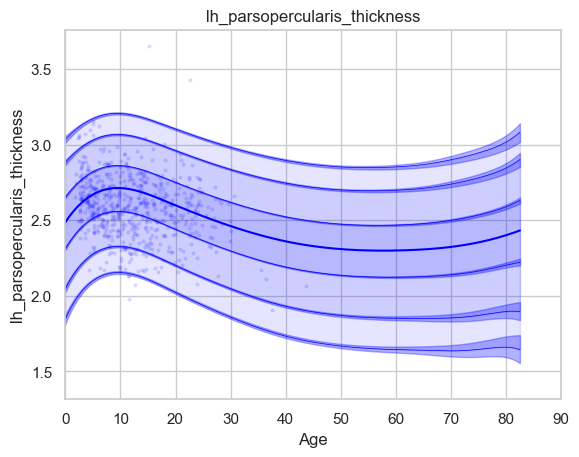

Running IDP 17 lh_parsorbitalis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.25121098]), 'Rho': array([0.63957291]), 'pRho': array([1.06843586e-102]), 'SMSE': array([0.59508814]), 'EXPV': array([0.40897038])}


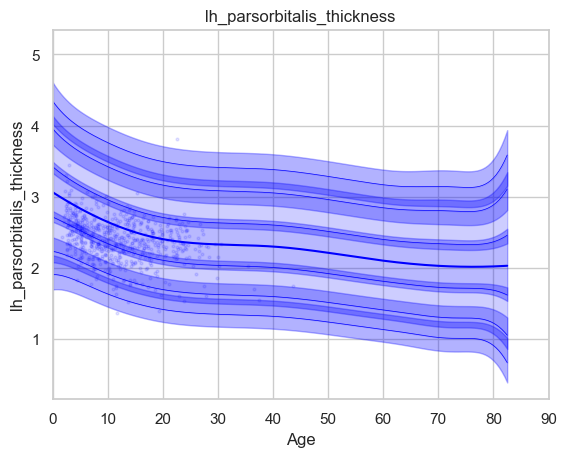

Running IDP 18 lh_parstriangularis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19033454]), 'Rho': array([0.60079059]), 'pRho': array([1.29322184e-86]), 'SMSE': array([0.64840494]), 'EXPV': array([0.35185152])}


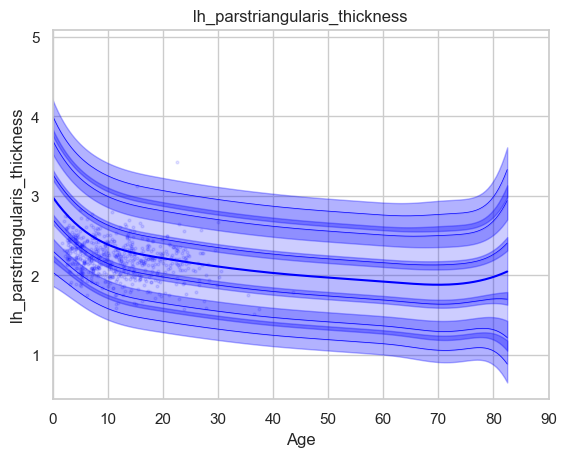

Running IDP 19 lh_pericalcarine_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23907491]), 'Rho': array([0.42079665]), 'pRho': array([3.30646924e-37]), 'SMSE': array([1.03833566]), 'EXPV': array([0.1749272])}


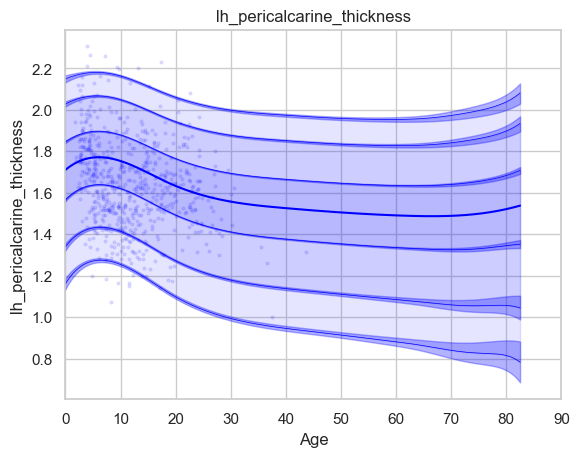

Running IDP 20 lh_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21060976]), 'Rho': array([0.25439767]), 'pRho': array([1.47808306e-13]), 'SMSE': array([1.1418303]), 'EXPV': array([0.06227413])}


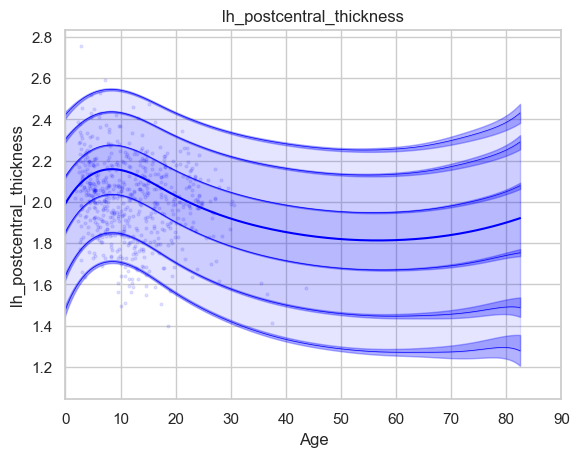

Running IDP 21 lh_posteriorcingulate_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20885292]), 'Rho': array([0.43569066]), 'pRho': array([3.76593726e-40]), 'SMSE': array([1.04213124]), 'EXPV': array([0.04443891])}


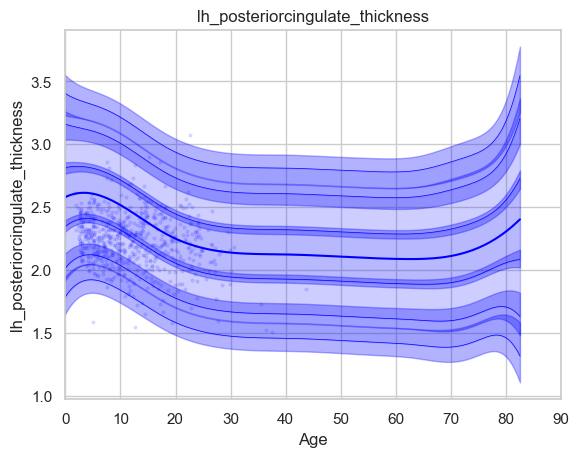

Running IDP 22 lh_precentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17613573]), 'Rho': array([0.15089178]), 'pRho': array([1.56397855e-05]), 'SMSE': array([1.10052215]), 'EXPV': array([-0.01380968])}


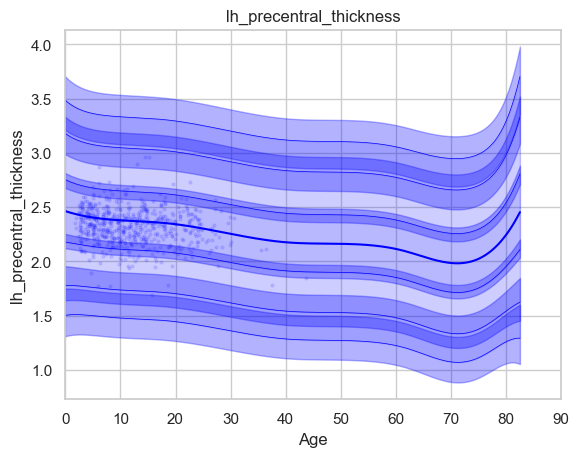

Running IDP 23 lh_precuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15417558]), 'Rho': array([0.71384651]), 'pRho': array([1.35297234e-142]), 'SMSE': array([0.49486801]), 'EXPV': array([0.50770886])}


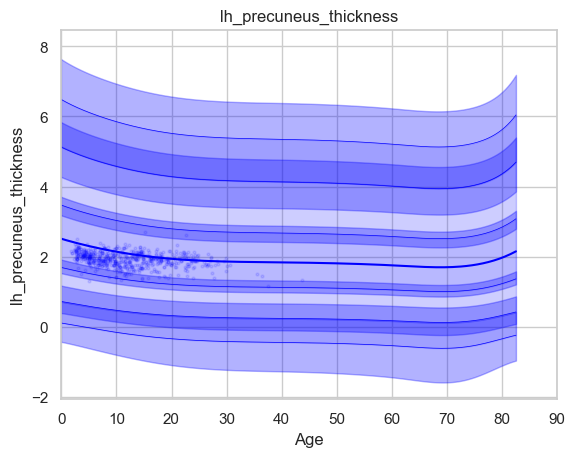

Running IDP 24 lh_rostralanteriorcingulate_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.27344609]), 'Rho': array([0.65391888]), 'pRho': array([2.2948438e-109]), 'SMSE': array([0.63790523]), 'EXPV': array([0.36769247])}


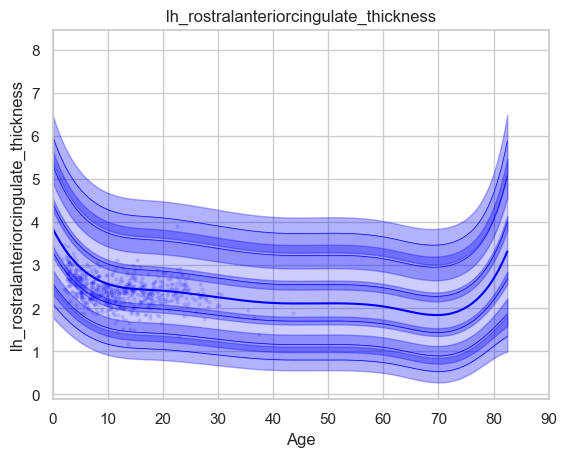

Running IDP 25 lh_rostralmiddlefrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17508725]), 'Rho': array([0.68978529]), 'pRho': array([4.36773802e-128]), 'SMSE': array([0.54118535]), 'EXPV': array([0.47472407])}


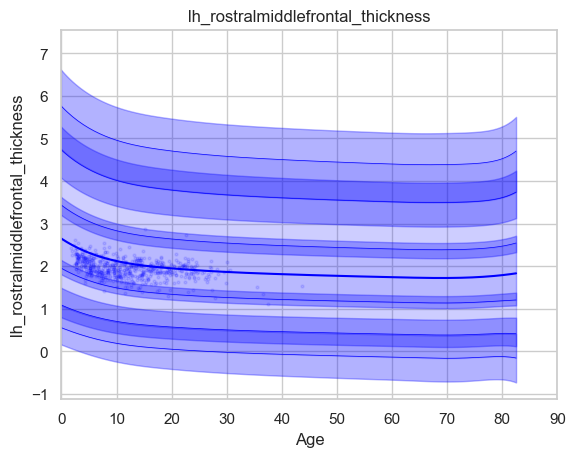

Running IDP 26 lh_superiorfrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19402289]), 'Rho': array([0.64181092]), 'pRho': array([1.03811187e-103]), 'SMSE': array([0.60830679]), 'EXPV': array([0.4035563])}


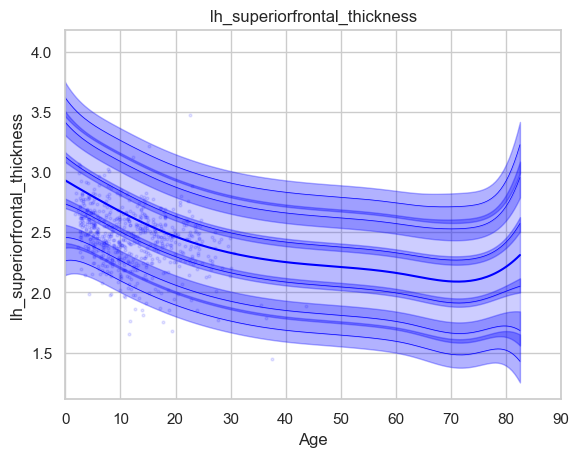

Running IDP 27 lh_superiorparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22786197]), 'Rho': array([0.33448328]), 'pRho': array([4.97581727e-23]), 'SMSE': array([1.14508478]), 'EXPV': array([0.11187134])}


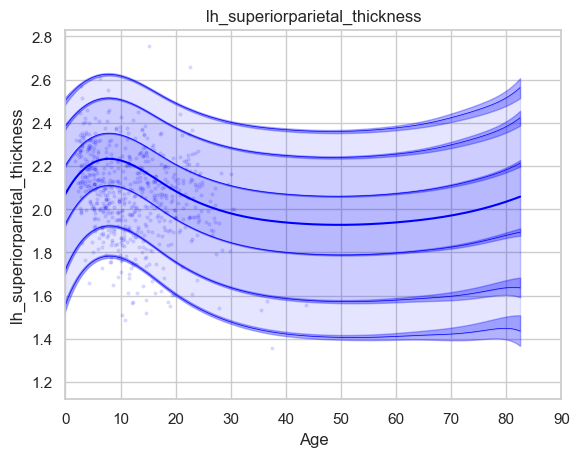

Running IDP 28 lh_superiortemporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21173753]), 'Rho': array([0.36795008]), 'pRho': array([5.51831037e-28]), 'SMSE': array([0.95868581]), 'EXPV': array([0.04609162])}


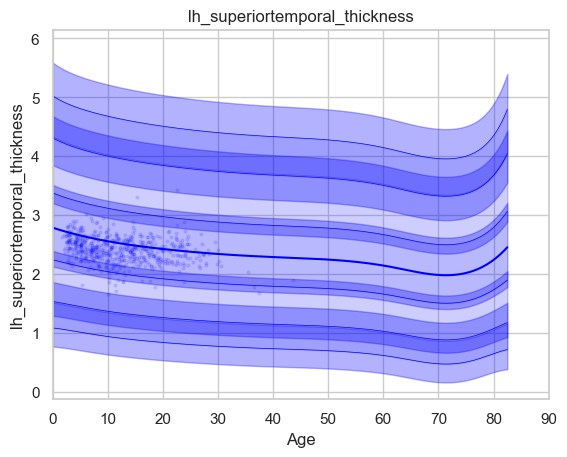

Running IDP 29 lh_supramarginal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20688928]), 'Rho': array([0.56155551]), 'pRho': array([9.14752816e-73]), 'SMSE': array([0.80841623]), 'EXPV': array([0.2974472])}


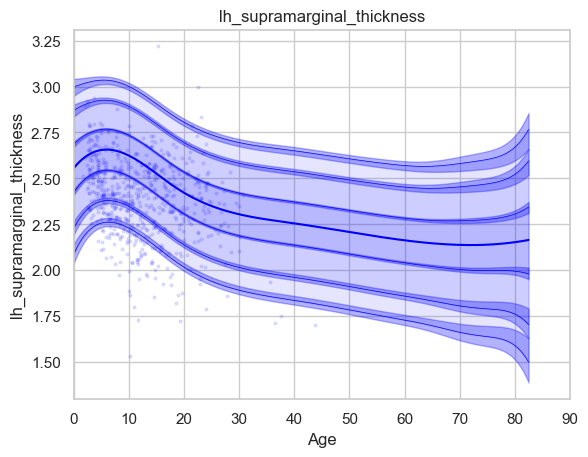

Running IDP 30 lh_frontalpole_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.38074487]), 'Rho': array([0.54441647]), 'pRho': array([2.33087795e-67]), 'SMSE': array([0.7374781]), 'EXPV': array([0.26358215])}


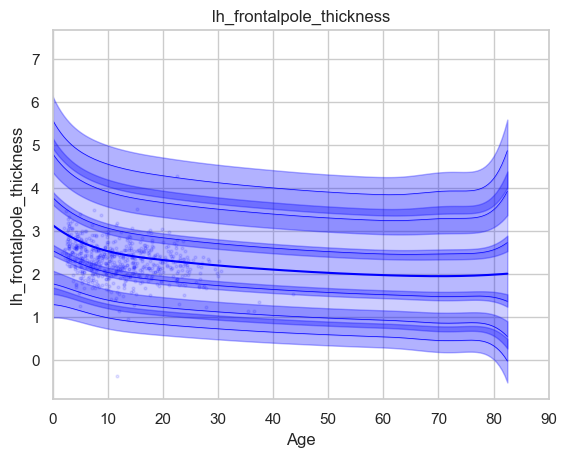

Running IDP 31 lh_temporalpole_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.51280979]), 'Rho': array([-0.35258255]), 'pRho': array([1.24910628e-25]), 'SMSE': array([1.88689572]), 'EXPV': array([-0.48053265])}


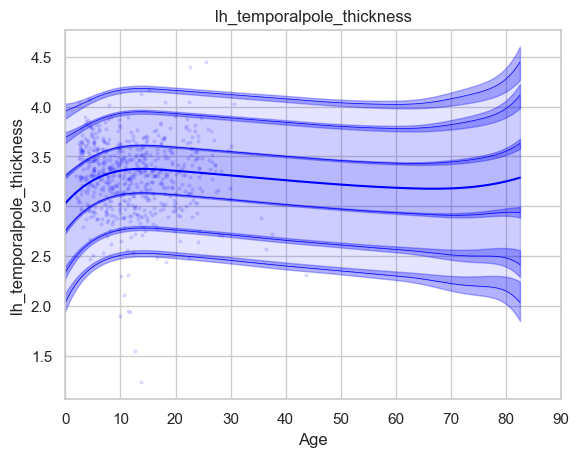

Running IDP 32 lh_transversetemporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.33354399]), 'Rho': array([0.32483891]), 'pRho': array([1.02096934e-21]), 'SMSE': array([1.11249308]), 'EXPV': array([0.10398957])}


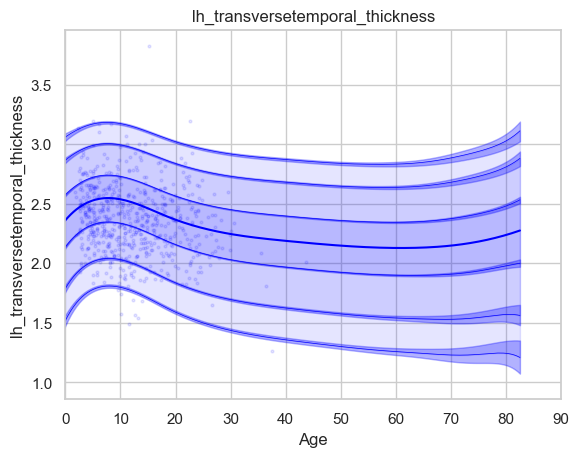

Running IDP 33 lh_insula_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.27329401]), 'Rho': array([0.34712872]), 'pRho': array([7.93329223e-25]), 'SMSE': array([1.21828688]), 'EXPV': array([0.11618017])}


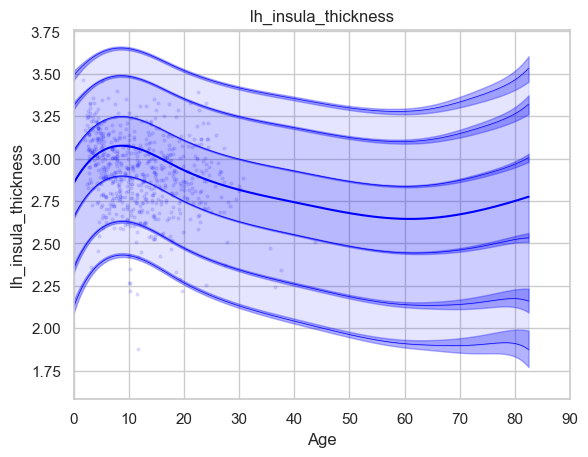

Running IDP 34 rh_bankssts_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22300738]), 'Rho': array([0.52687934]), 'pRho': array([3.47635699e-62]), 'SMSE': array([0.74010149]), 'EXPV': array([0.27679619])}


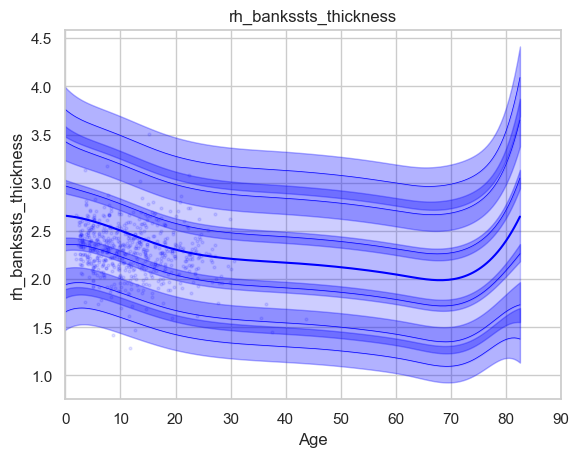

Running IDP 35 rh_caudalanteriorcingulate_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.3168308]), 'Rho': array([0.14231526]), 'pRho': array([4.6915084e-05]), 'SMSE': array([1.0383561]), 'EXPV': array([0.00302456])}


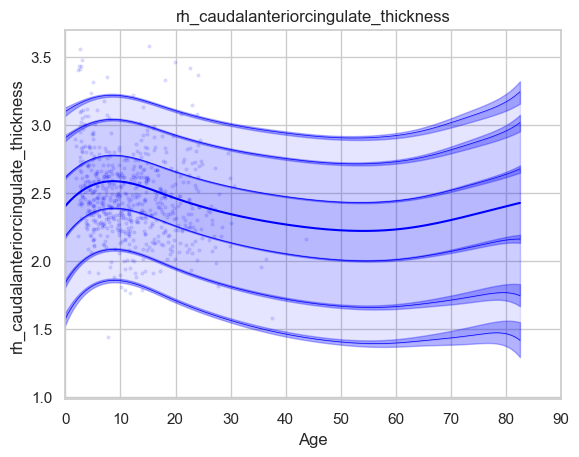

Running IDP 36 rh_caudalmiddlefrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.27521464]), 'Rho': array([0.01696814]), 'pRho': array([0.62975415]), 'SMSE': array([1.48498606]), 'EXPV': array([-0.1117448])}


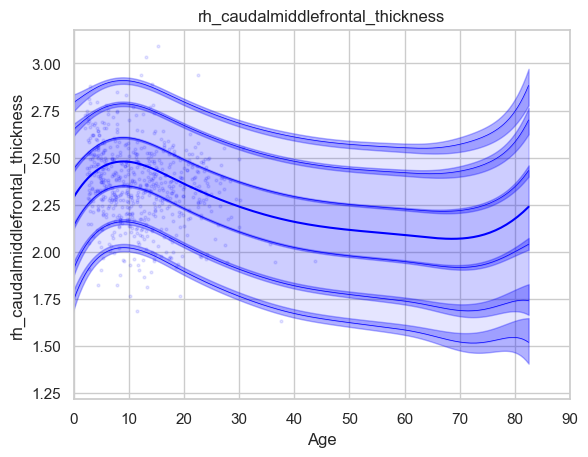

Running IDP 37 rh_cuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23385082]), 'Rho': array([0.52416304]), 'pRho': array([2.05073197e-61]), 'SMSE': array([0.94264236]), 'EXPV': array([0.24425872])}


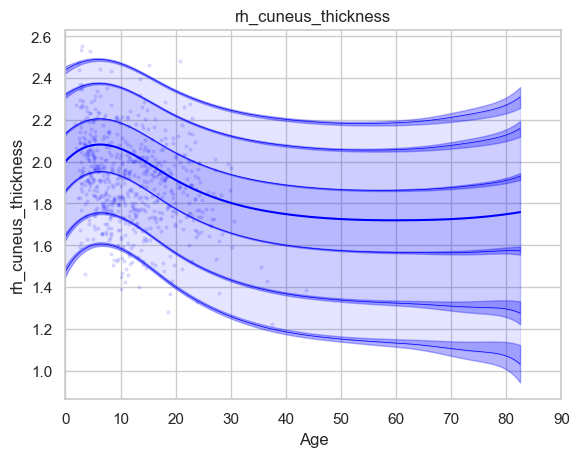

Running IDP 38 rh_entorhinal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.55023453]), 'Rho': array([-0.21996379]), 'pRho': array([2.1186438e-10]), 'SMSE': array([1.77375532]), 'EXPV': array([-0.42158939])}


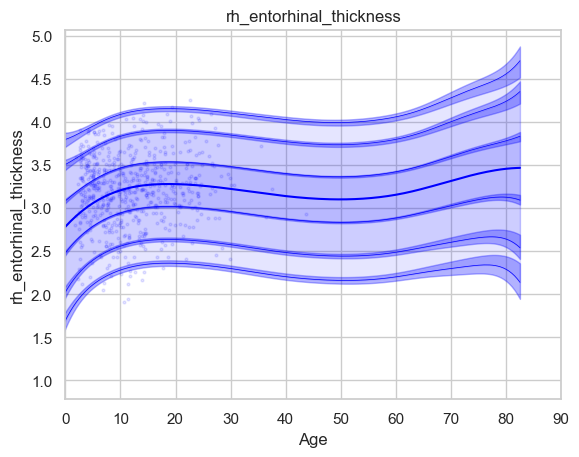

Running IDP 39 rh_fusiform_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17457641]), 'Rho': array([0.46058621]), 'pRho': array([1.90452029e-45]), 'SMSE': array([0.89121904]), 'EXPV': array([0.11172674])}


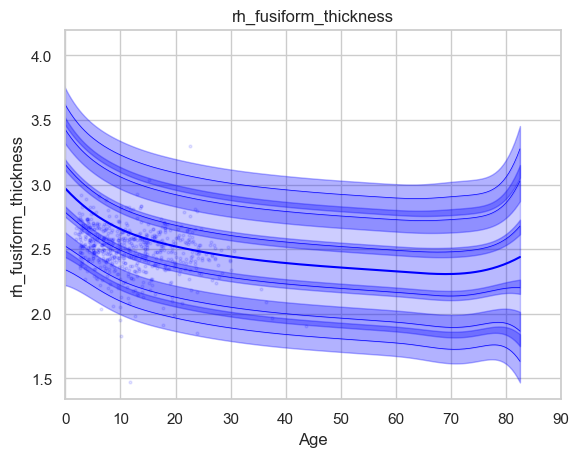

Running IDP 40 rh_inferiorparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17555835]), 'Rho': array([0.66170511]), 'pRho': array([3.61206364e-113]), 'SMSE': array([0.58318045]), 'EXPV': array([0.43158022])}


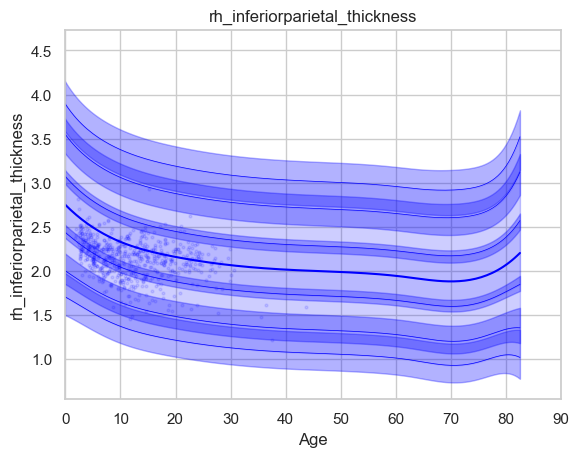

Running IDP 41 rh_inferiortemporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17008106]), 'Rho': array([0.6575716]), 'pRho': array([3.92119746e-111]), 'SMSE': array([0.56830428]), 'EXPV': array([0.43180367])}


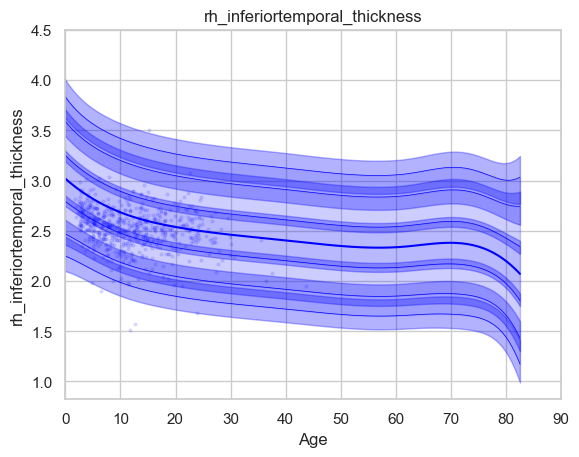

Running IDP 42 rh_isthmuscingulate_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.24784023]), 'Rho': array([-0.04739145]), 'pRho': array([0.17788568]), 'SMSE': array([1.23436401]), 'EXPV': array([-0.22052407])}


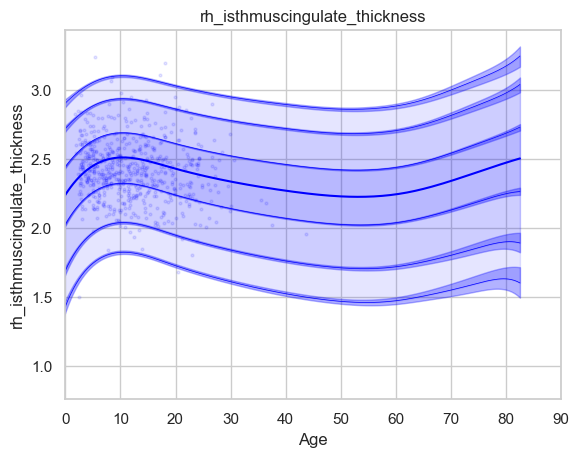

Running IDP 43 rh_lateraloccipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21108616]), 'Rho': array([0.39630497]), 'pRho': array([1.04765335e-32]), 'SMSE': array([1.02294946]), 'EXPV': array([0.13999097])}


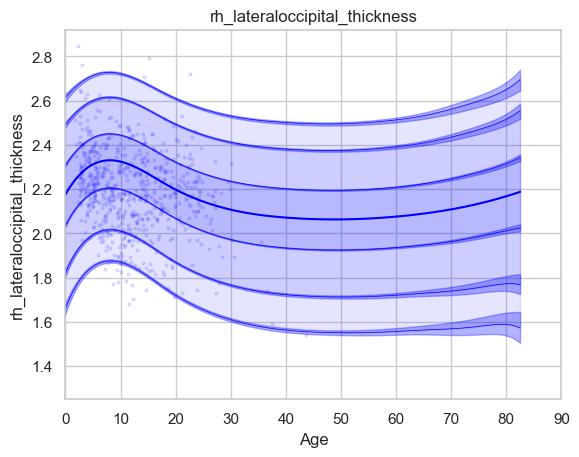

Running IDP 44 rh_lateralorbitofrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18362857]), 'Rho': array([0.81560664]), 'pRho': array([1.69608098e-231]), 'SMSE': array([0.36015115]), 'EXPV': array([0.66085943])}


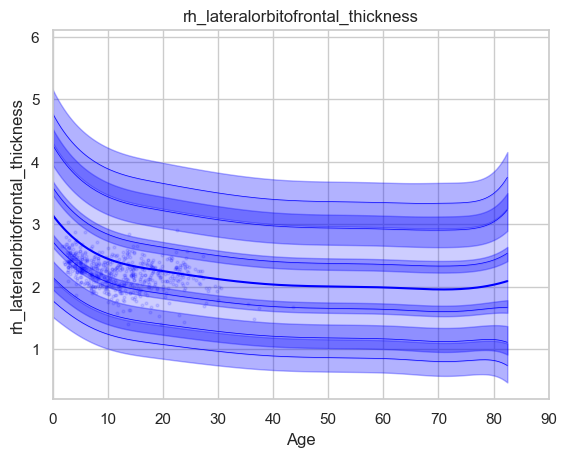

Running IDP 45 rh_lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22847138]), 'Rho': array([0.47413705]), 'pRho': array([1.53398193e-48]), 'SMSE': array([1.15291339]), 'EXPV': array([0.20659652])}


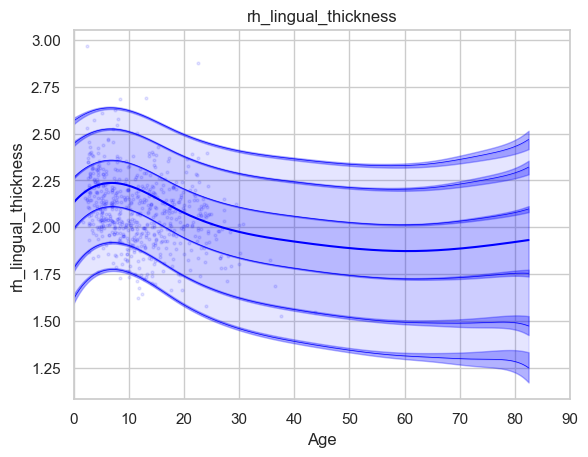

Running IDP 46 rh_medialorbitofrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22536674]), 'Rho': array([0.7912242]), 'pRho': array([1.0513754e-204]), 'SMSE': array([0.42535931]), 'EXPV': array([0.60869447])}


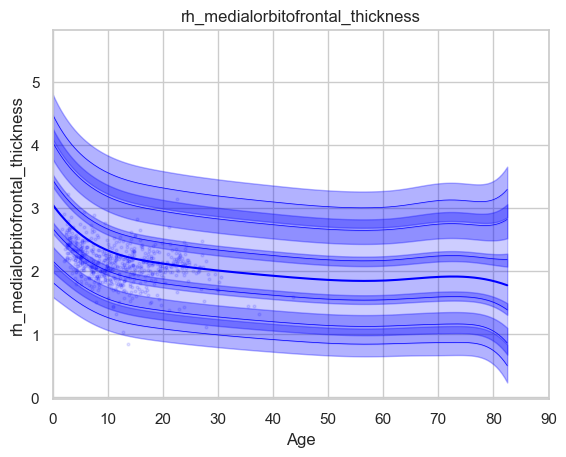

Running IDP 47 rh_middletemporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17397371]), 'Rho': array([0.6939158]), 'pRho': array([1.86967436e-130]), 'SMSE': array([0.519819]), 'EXPV': array([0.48112703])}


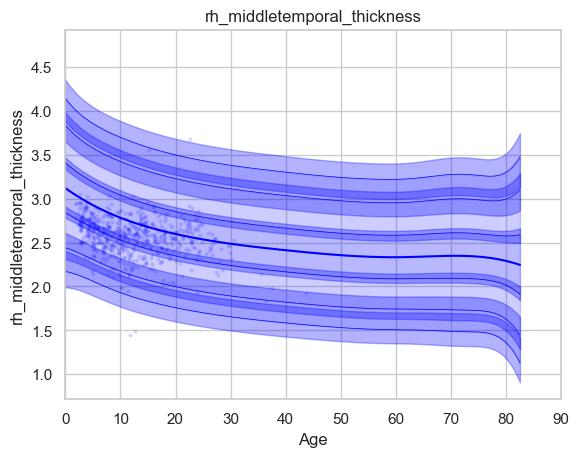

Running IDP 48 rh_parahippocampal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.30421958]), 'Rho': array([0.07547501]), 'pRho': array([0.03170105]), 'SMSE': array([1.16541602]), 'EXPV': array([-0.098814])}


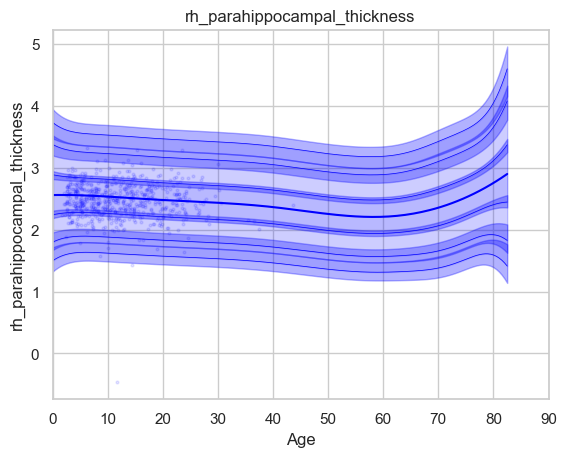

Running IDP 49 rh_paracentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23868877]), 'Rho': array([0.20314663]), 'pRho': array([4.84677473e-09]), 'SMSE': array([1.19790554]), 'EXPV': array([0.00660164])}


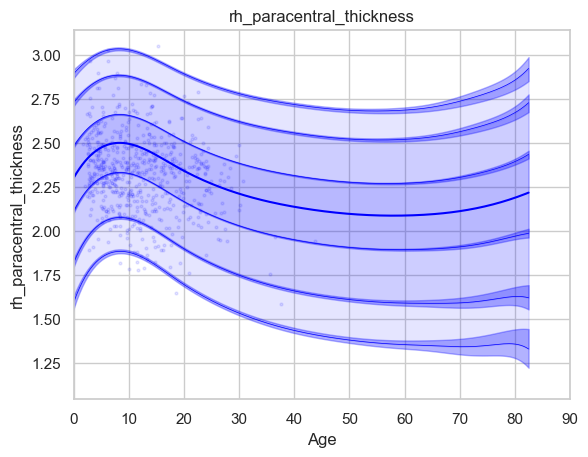

Running IDP 50 rh_parsopercularis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1928525]), 'Rho': array([0.56249356]), 'pRho': array([4.51691682e-73]), 'SMSE': array([0.70567302]), 'EXPV': array([0.31578537])}


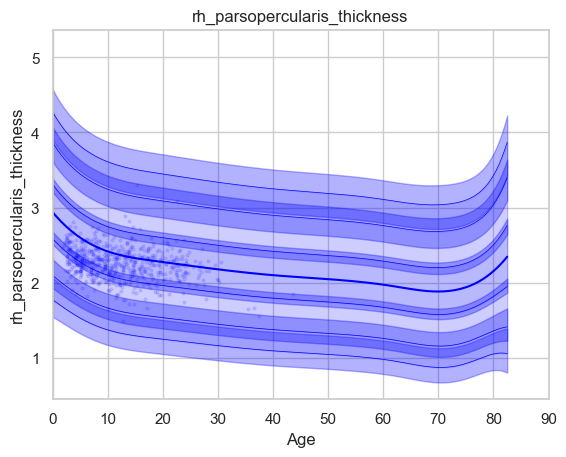

Running IDP 51 rh_parsorbitalis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.37303976]), 'Rho': array([0.25113299]), 'pRho': array([3.09853777e-13]), 'SMSE': array([1.23003033]), 'EXPV': array([0.06210527])}


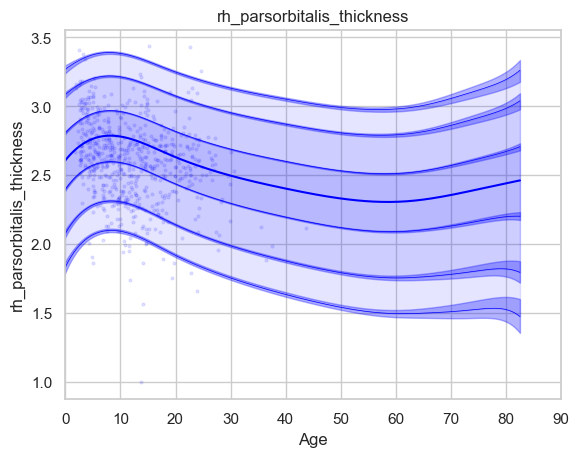

Running IDP 52 rh_parstriangularis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23081071]), 'Rho': array([0.59305921]), 'pRho': array([1.0401617e-83]), 'SMSE': array([0.75781411]), 'EXPV': array([0.35154506])}


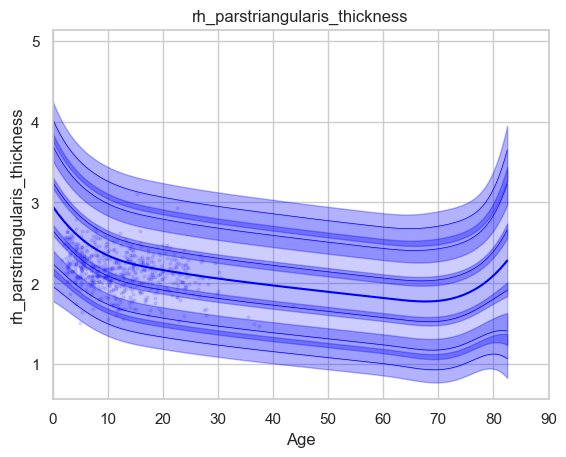

Running IDP 53 rh_pericalcarine_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.29582315]), 'Rho': array([-0.1181921]), 'pRho': array([0.00074263]), 'SMSE': array([1.57787324]), 'EXPV': array([-0.09574635])}


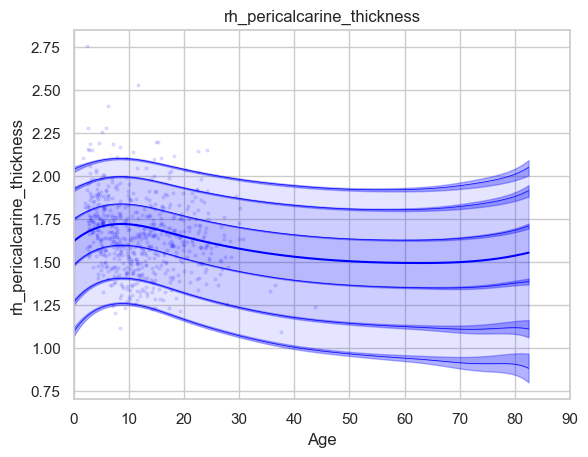

Running IDP 54 rh_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22280452]), 'Rho': array([0.25825895]), 'pRho': array([6.07196611e-14]), 'SMSE': array([1.14809663]), 'EXPV': array([0.06651612])}


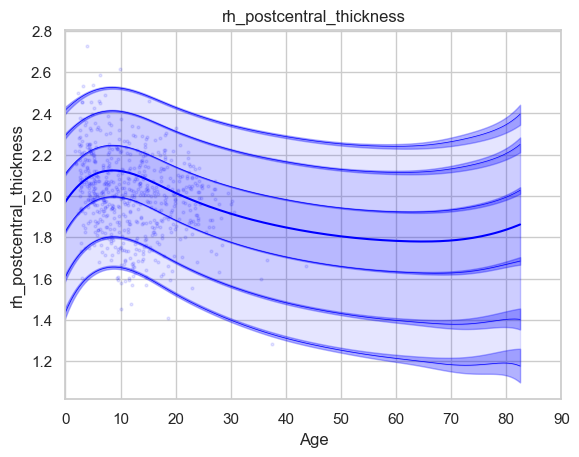

Running IDP 55 rh_posteriorcingulate_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20273486]), 'Rho': array([0.25692626]), 'pRho': array([8.26875971e-14]), 'SMSE': array([0.98010557]), 'EXPV': array([0.03848439])}


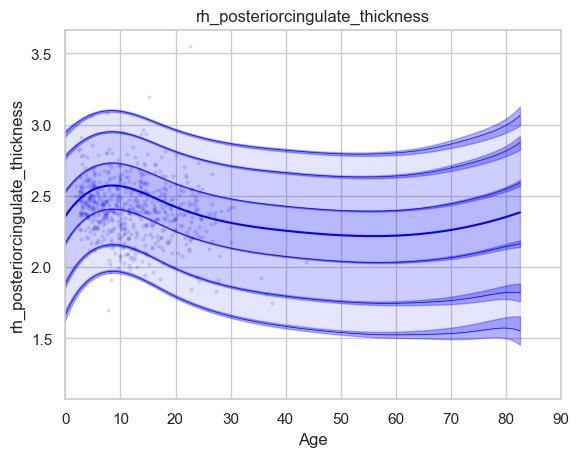

Running IDP 56 rh_precentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18141788]), 'Rho': array([0.22229708]), 'pRho': array([1.34339775e-10]), 'SMSE': array([1.03364175]), 'EXPV': array([0.04095641])}


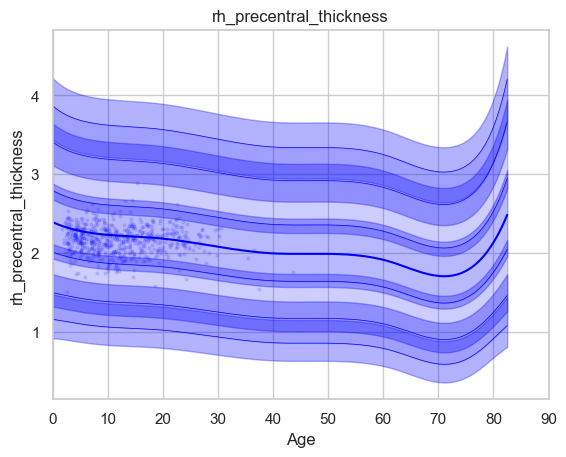

Running IDP 57 rh_precuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16780951]), 'Rho': array([0.64227514]), 'pRho': array([6.38226868e-104]), 'SMSE': array([0.68921294]), 'EXPV': array([0.34294895])}


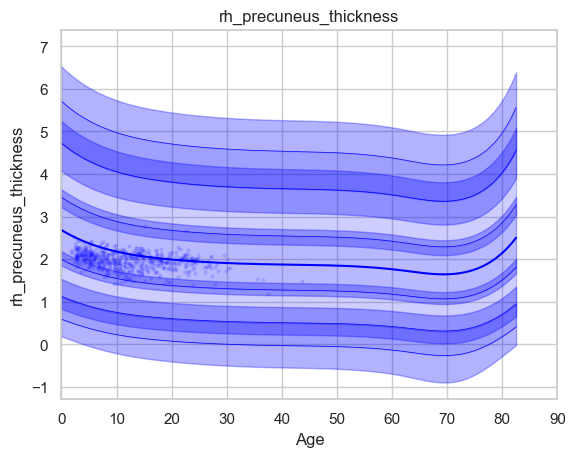

Running IDP 58 rh_rostralanteriorcingulate_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.35235587]), 'Rho': array([0.48604277]), 'pRho': array([2.16938032e-51]), 'SMSE': array([0.93446472]), 'EXPV': array([0.21040476])}


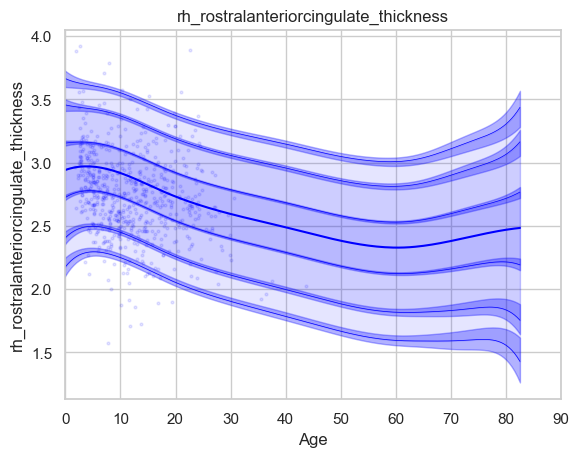

Running IDP 59 rh_rostralmiddlefrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.25258782]), 'Rho': array([0.64936525]), 'pRho': array([3.33906013e-107]), 'SMSE': array([0.79704203]), 'EXPV': array([0.41584154])}


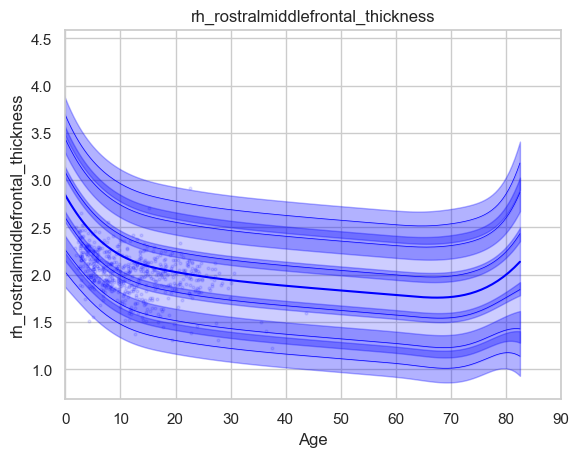

Running IDP 60 rh_superiorfrontal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22552612]), 'Rho': array([0.61266292]), 'pRho': array([2.92044448e-91]), 'SMSE': array([0.74360923]), 'EXPV': array([0.37064281])}


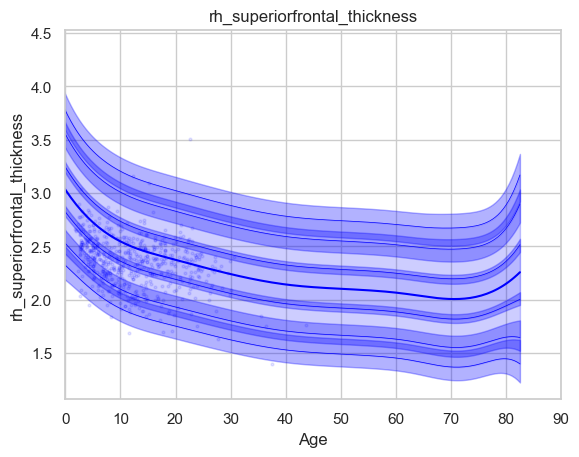

Running IDP 61 rh_superiorparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22277693]), 'Rho': array([0.32753511]), 'pRho': array([4.43822896e-22]), 'SMSE': array([1.15074699]), 'EXPV': array([0.10726541])}


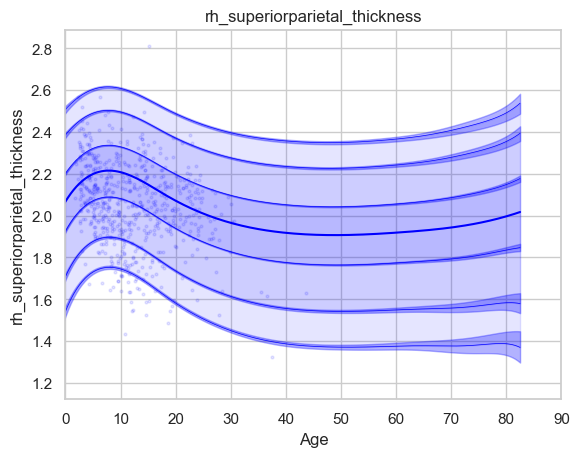

Running IDP 62 rh_superiortemporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20211652]), 'Rho': array([0.46797772]), 'pRho': array([4.08665843e-47]), 'SMSE': array([0.81162643]), 'EXPV': array([0.21711772])}


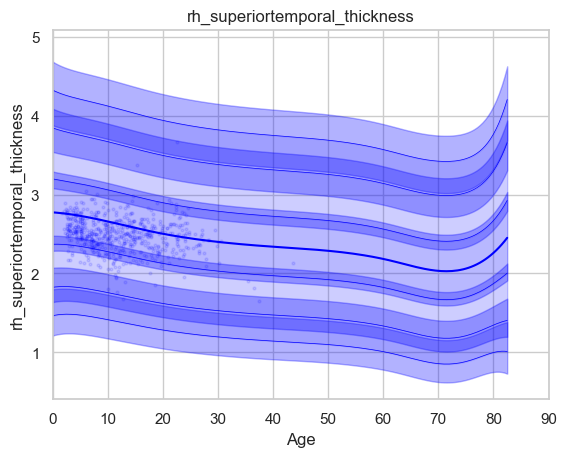

Running IDP 63 rh_supramarginal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.24045123]), 'Rho': array([0.43671937]), 'pRho': array([2.32558678e-40]), 'SMSE': array([1.09525334]), 'EXPV': array([0.18472314])}


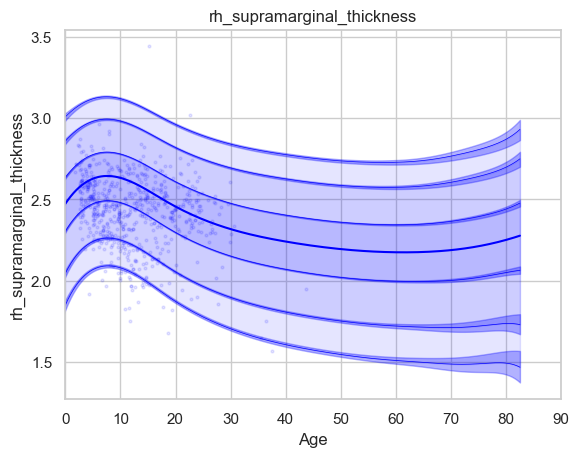

Running IDP 64 rh_frontalpole_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.40711083]), 'Rho': array([0.48441118]), 'pRho': array([5.42404753e-51]), 'SMSE': array([0.91091688]), 'EXPV': array([0.2108839])}


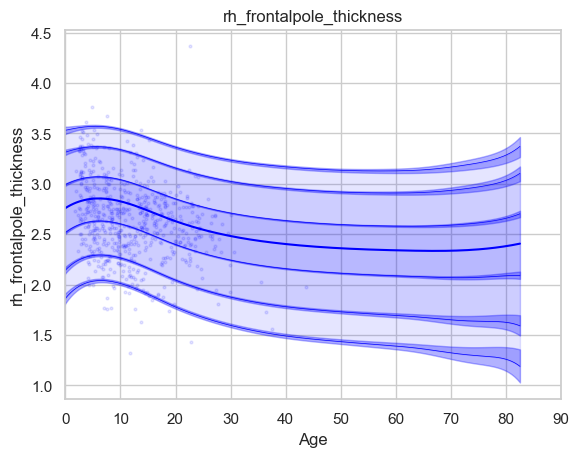

Running IDP 65 rh_temporalpole_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.49050158]), 'Rho': array([-0.33954864]), 'pRho': array([9.71639018e-24]), 'SMSE': array([1.67971856]), 'EXPV': array([-0.34147558])}


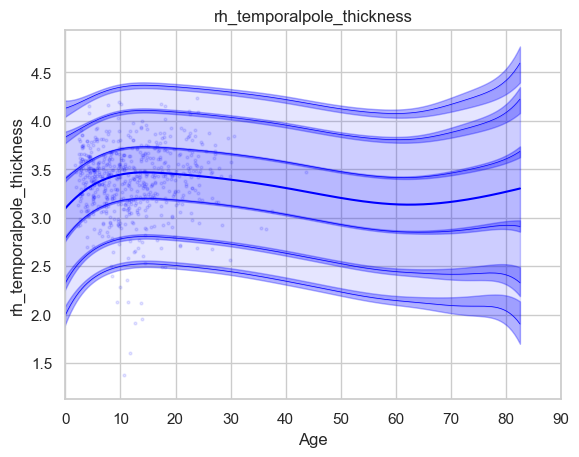

Running IDP 66 rh_transversetemporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.36024562]), 'Rho': array([0.24268401]), 'pRho': array([2.00058148e-12]), 'SMSE': array([1.27438166]), 'EXPV': array([0.0586483])}


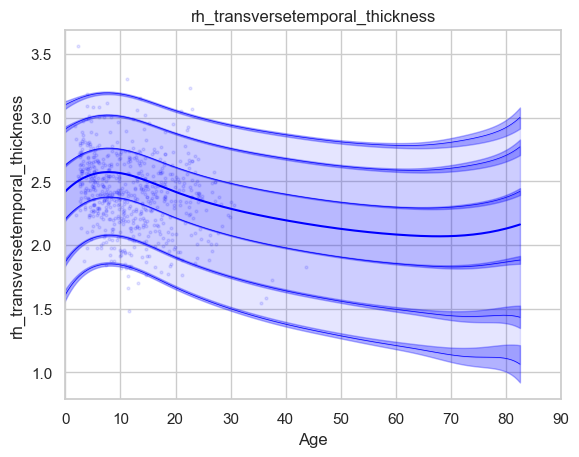

Running IDP 67 rh_insula_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18797485]), 'Rho': array([0.66321223]), 'pRho': array([6.39603125e-114]), 'SMSE': array([0.63886201]), 'EXPV': array([0.42288713])}


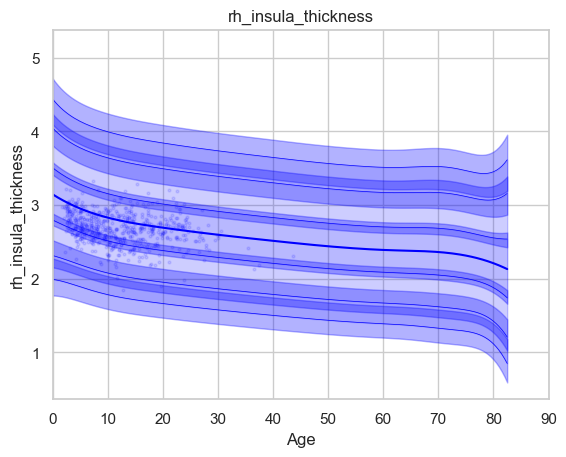

In [184]:
sns.set(style='whitegrid')

for idp_num, idp in enumerate(idp_ids): 
    print('Running IDP', idp_num, idp, ':')
    idp_dir = os.path.join(out_dir, idp)
    os.chdir(idp_dir)
    
    # load the true data points
    yhat_te = load_2d(os.path.join(idp_dir, 'yhat_predict.txt'))
    s2_te = load_2d(os.path.join(idp_dir, 'ys2_predict.txt'))
    y_te = load_2d(os.path.join(idp_dir, 'resp_te.txt'))
            
    # set up the covariates for the dummy data
    print('Making predictions with dummy covariates (for visualisation)')
    yhat, s2 = predict(cov_file_dummy, 
                       alg = 'blr', 
                       respfile = None, 
                       model_path = os.path.join(idp_dir,'Models'), 
                       outputsuffix = '_dummy')
    
    # load the normative model
    with open(os.path.join(idp_dir,'Models', 'NM_0_0_estimate.pkl'), 'rb') as handle:
        nm = pickle.load(handle) 
    
    # get the warp and warp parameters
    W = nm.blr.warp
    warp_param = nm.blr.hyp[1:nm.blr.warp.get_n_params()+1] 
        
    # first, we warp predictions for the true data and compute evaluation metrics
    med_te = W.warp_predictions(np.squeeze(yhat_te), np.squeeze(s2_te), warp_param)[0]
    med_te = med_te[:, np.newaxis]
    print('metrics:', evaluate(y_te, med_te))
    
    # then, we warp dummy predictions to create the plots
    med, pr_int = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param)
    
    # extract the different variance components to visualise
    beta, junk1, junk2 = nm.blr._parse_hyps(nm.blr.hyp, X_dummy)
    s2n = 1/beta # variation (aleatoric uncertainty)
    s2s = s2-s2n # modelling uncertainty (epistemic uncertainty)
    
    # plot the data points
    y_te_rescaled_all = np.zeros_like(y_te)
    for sid, site in enumerate(site_ids_te):
        # plot the true test data points 
        if all(elem in site_ids_tr for elem in site_ids_te):
            # all data in the test set are present in the training set
            
            # first, we select the data points belonging to this particular site
            idx = np.where(np.bitwise_and(X_te[:,2] == sex, X_te[:,sid+len(cols_cov)+1] !=0))[0]
            if len(idx) == 0:
                print('No data for site', sid, site, 'skipping...')
                continue
            
            # then directly adjust the data
            idx_dummy = np.bitwise_and(X_dummy[:,1] > X_te[idx,1].min(), X_dummy[:,1] < X_te[idx,1].max())
            y_te_rescaled = y_te[idx] - np.median(y_te[idx]) + np.median(med[idx_dummy])
        else:
            # we need to adjust the data based on the adaptation dataset 
            
            # first, select the data point belonging to this particular site
            idx = np.where(np.bitwise_and(X_te[:,2] == sex, (df_te['site'] == site).to_numpy()))[0]
            
            # load the adaptation data
            y_ad = load_2d(os.path.join(idp_dir, 'resp_ad.txt'))
            X_ad = load_2d(os.path.join(idp_dir, 'cov_bspline_ad.txt'))
            idx_a = np.where(np.bitwise_and(X_ad[:,2] == sex, (df_ad['site'] == site).to_numpy()))[0]
            if len(idx) < 2 or len(idx_a) < 2:
                print('Insufficent data for site', sid, site, 'skipping...')
                continue
            
            # adjust and rescale the data
            y_te_rescaled, s2_rescaled = nm.blr.predict_and_adjust(nm.blr.hyp, 
                                                                   X_ad[idx_a,:], 
                                                                   np.squeeze(y_ad[idx_a]), 
                                                                   Xs=None, 
                                                                   ys=np.squeeze(y_te[idx]))
        # plot the (adjusted) data points
        plt.scatter(X_te[idx,1], y_te_rescaled, s=4, color=clr, alpha = 0.1)
       
    # plot the median of the dummy data
    plt.plot(xx, med, clr)
    
    # fill the gaps in between the centiles
    junk, pr_int25 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.01,0.99])
    plt.fill_between(xx, pr_int25[:,0], pr_int25[:,1], alpha = 0.1,color=clr)
    plt.fill_between(xx, pr_int95[:,0], pr_int95[:,1], alpha = 0.1,color=clr)
    plt.fill_between(xx, pr_int99[:,0], pr_int99[:,1], alpha = 0.1,color=clr)
            
    # make the width of each centile proportional to the epistemic uncertainty
    junk, pr_int25l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.01,0.99])
    junk, pr_int25u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.01,0.99])    
    plt.fill_between(xx, pr_int25l[:,0], pr_int25u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int95l[:,0], pr_int95u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int99l[:,0], pr_int99u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int25l[:,1], pr_int25u[:,1], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int95l[:,1], pr_int95u[:,1], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int99l[:,1], pr_int99u[:,1], alpha = 0.3,color=clr)

    # plot actual centile lines
    plt.plot(xx, pr_int25[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int25[:,1],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int95[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int95[:,1],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int99[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int99[:,1],color=clr, linewidth=0.5)
    
    plt.xlabel('Age')
    plt.ylabel(idp) 
    plt.title(idp)
    plt.xlim((0,90))
    plt.savefig(os.path.join(idp_dir, 'centiles_' + str(sex)),  bbox_inches='tight')
    plt.show()

os.chdir(out_dir)

# CLUSTERING 

### Imports packages, functions

In [386]:
from matplotlib import pyplot
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from yellowbrick.cluster import SilhouetteVisualizer

from enigmatoolbox.utils.parcellation import parcel_to_surface
from enigmatoolbox.plotting import plot_cortical

In [387]:
# Load PGS data
pgs_file = pd.read_csv(os.path.join(data_dir, 'Fam_LEAP_FreezeV3_Final.tsv'), sep = '\t')

In [388]:
# Function returning a summary for each cluster
def comp_cluster(clustered_data):
    mean_age = {}
       
    
    for i in list(set(clustered_data['Cluster'])):
        n = clustered_data.loc[clustered_data['Cluster'] == i].shape[0]
        mean_age.update({i : [clustered_data.loc[clustered_data['Cluster'] == i]['age_at_first_scan'].mean(),
                              int(n), 
                              (n/clustered_data.shape[0])*100,
                                clustered_data.loc[clustered_data['Cluster'] == i]['mean_Z'].mean()]})
    
    rownames = ['Age mean', 'N', '% N', 'Mean CT']

    return pd.DataFrame(mean_age, index = rownames )

In [389]:
def find_K(Z_df_pred):
    kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 1000,
    "random_state": 42,
    }
    # A list holds the SSE values for each k
    sse = []
    for k in range(2, 10):
        kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
        kmeans.fit(Z_df_pred[cols_df])
        sse.append(kmeans.inertia_)
    plt.style.use("fivethirtyeight")
    plt.plot(range(2, 10), sse)
    plt.xticks(range(2, 10))
    plt.xlabel("Number of Clusters")
    plt.ylabel("SSE")
    plt.show()
    

 




In [390]:
def find_k_silhouette(X):
    fig, ax = plt.subplots(2, 2, figsize=(15,8))
    for i in [2, 3, 4, 5, 6 ,7]:
       
        km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
        q, mod = divmod(i, 2)
   
        visualizer = SilhouetteVisualizer(km, colors='yellowbrick',
                                         ax=ax[q-1][mod])
        visualizer.fit(X) 

In [391]:
def boot_clustering(boot_clus, Z_df_pred):
    super_clus = []
    all_clus = []
    for i in range(boot_clus):
        model = AgglomerativeClustering(n_clusters=n_clusters).fit(Z_df_pred[cols_df])
        #model_labels = model.predict(Z_df_pred[cols_df])
        model_df = Z_df_pred.assign(Cluster = model.labels_)
        df_cluster = comp_cluster(model_df)
        
        super_clus.append(df_cluster.T.sort_values(by = ['N']).reset_index())
        all_clus.append(model_df)

    sns.set_theme(style="darkgrid",font_scale=1.5)
    c = sns.relplot(data=Z_df_pred, x="age_at_first_scan", y='mean_Z', hue=model.labels_, height=6).set(xlabel = 'Age', ylabel = "Mean Z-score", title = 'Agglomerative Clustering')
    plt.show()

    show_temp = input('Show plot for each region ? [yes/no]\n')
    if (show_temp == 'yes'):

        for i in model_df[cols_df]:
            sns.set_theme(style="darkgrid",font_scale=1.5)
            c = sns.relplot(data=model_df, x="age_at_first_scan", y=i, hue=model.labels_, height=6).set(xlabel = 'Age', ylabel = "Z-score", title = i)
            plt.show()
    return all_clus, model_df, super_clus

In [392]:
def filter_clusters(n_min, super_clus):
    filtered_clus = []
    l_pop = []
    for c in range(len(super_clus)):
        for i in super_clus[c]['N']:
            if (i < n_min): 
                l_pop.append(c)

    print(len(l_pop), 'clusters removed')

    for idx, i in enumerate(super_clus):
        if (idx not in l_pop):

            filtered_clus.append(i)

    dfs = pd.concat(filtered_clus, axis =1)
    return pd.DataFrame({'Age mean' : dfs['Age mean'].mean(axis = 1), 
                  'N' : dfs['N'].mean(axis = 1), 
                  '% N' : dfs['% N'].mean(axis = 1),
                     'Mean Z-Score' : dfs['Mean CT'].mean(axis =1)}), filtered_clus[1]

In [393]:
# Function to read Z-scores stored in files

def fetch_raw_Z():
    # Read outputs files 
    Z_pred = {}

    for idp_num, idp in enumerate(idp_ids): 
        idp_dir = os.path.join(out_dir, idp)
        os.chdir(idp_dir)
        f = open("Z_predict.txt", "r")
        Z_pred.update({f'{idp}_Z_predict' : f.readlines()})

    Z_df_pred = pd.DataFrame(Z_pred).astype(float)
    
    return Z_df_pred

### Extract Z-scores

In [394]:
Z_df_pred = fetch_raw_Z()

In [395]:


# Remove Z-scores of TD participants (if newdata containing TD + ASD)
if (pred_bool == '1'):
    Z_df_pred = Z_df_pred.loc[df_te2['ASD'] == 'Yes']


# Compute mean of absolute Z-Scores of each participant
cols_df = [col for col in Z_df_pred.columns if 'predict' in col]
Z_df_pred = Z_df_pred.assign(mean_Z = list(Z_df_pred[cols_df].mean(axis =1)))
Z_df_pred = Z_df_pred.assign(abs_mean_Z = list(abs(Z_df_pred[cols_df]).mean(axis =1)))

# Remove outlier Z-Scores
Z_df_pred = Z_df_pred.drop(Z_df_pred.loc[Z_df_pred[cols_df].mean(axis = 1) > 3].index)

# Merge Z-scores with participants infos
Z_df_pred = Z_df_pred.join(df_te2.reset_index())

### Find optimal K (number of clusters)

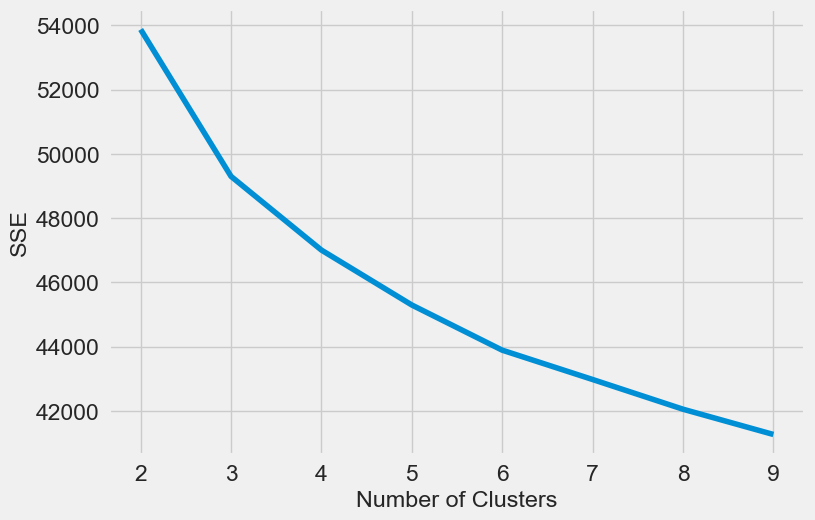

In [401]:
find_K(Z_df_pred[cols_df])

In [402]:
n_clusters = int(input('Number of clusters : '))

Number of clusters : 4


## Agglomerative clustering

In [403]:
from sklearn.cluster import AgglomerativeClustering

In [404]:
AC = AgglomerativeClustering(n_clusters = n_clusters).fit(Z_df_pred[cols_df])

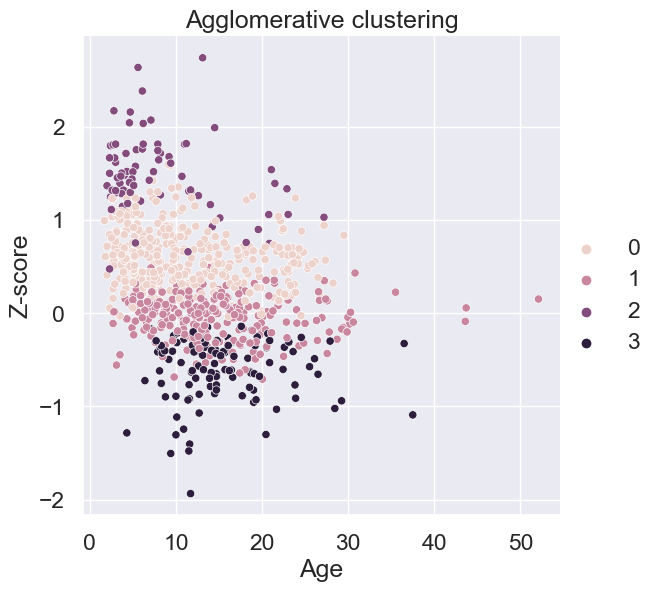

In [405]:
sns.set_theme(style="darkgrid",font_scale=1.5)
c = sns.relplot(data=Z_df_pred, x="age_at_first_scan", y=Z_df_pred[cols_df].mean(axis =1), hue=AC.labels_, height=6).set(xlabel = 'Age', ylabel = "Z-score", title = 'Agglomerative clustering')
plt.show()

## Stability analysis : Leave-one-site-out visualisation (optional)

### Bubble plot
Show site distribution (in percentage) for each cluster when leave one site out

Size = Nci / Nc  

*for j-th site, c-th cluster*


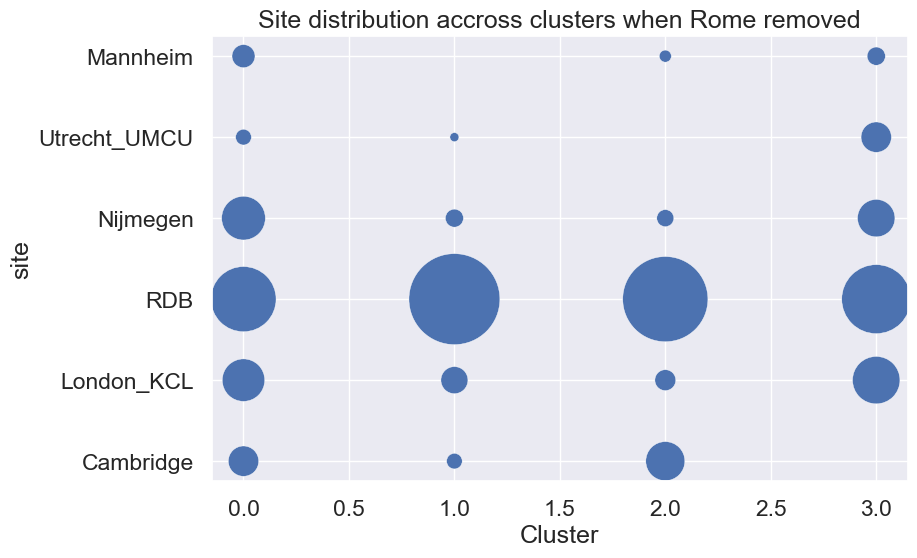

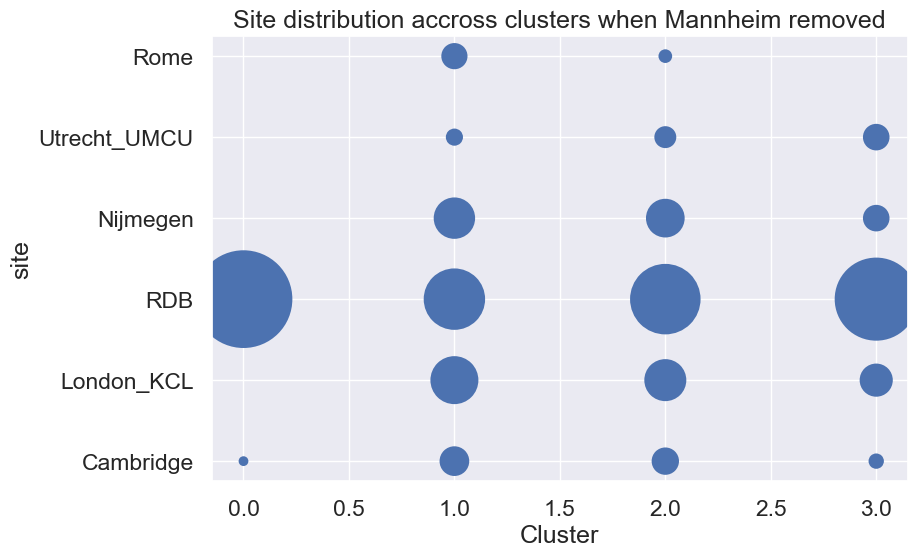

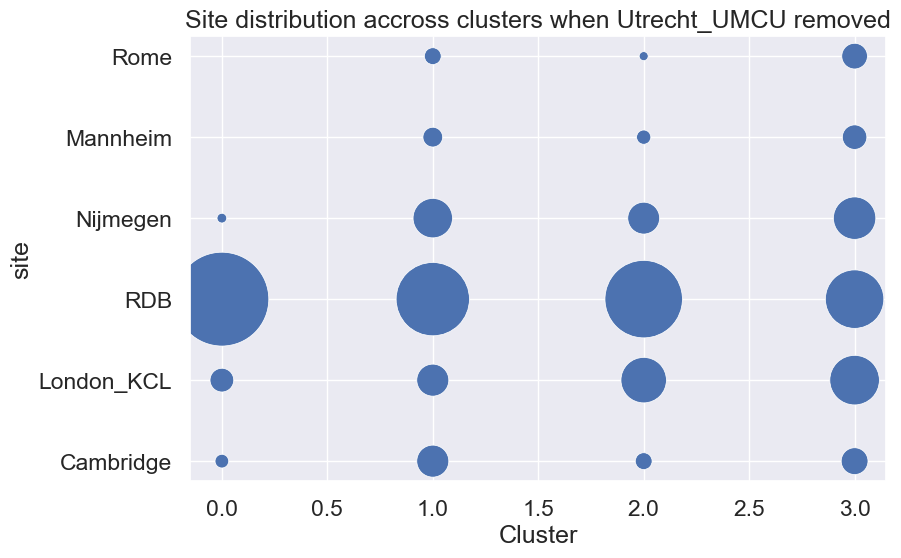

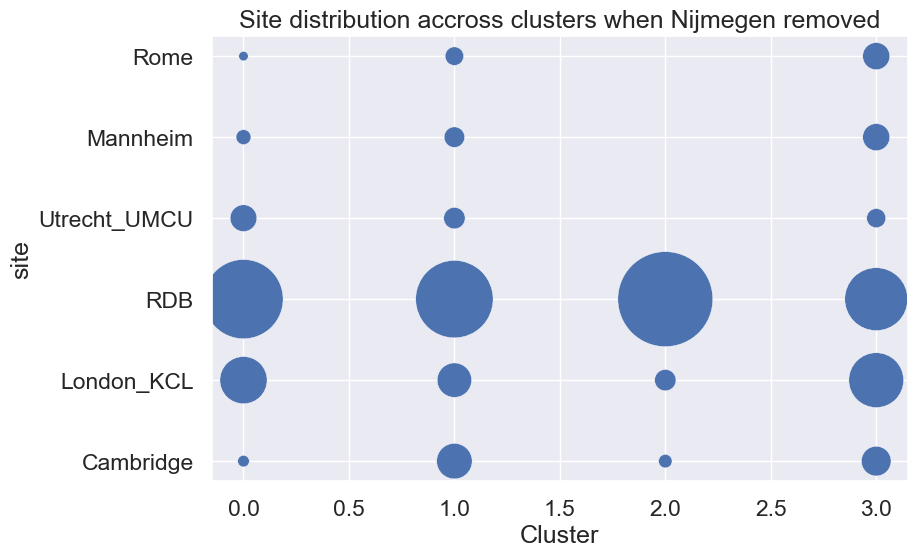

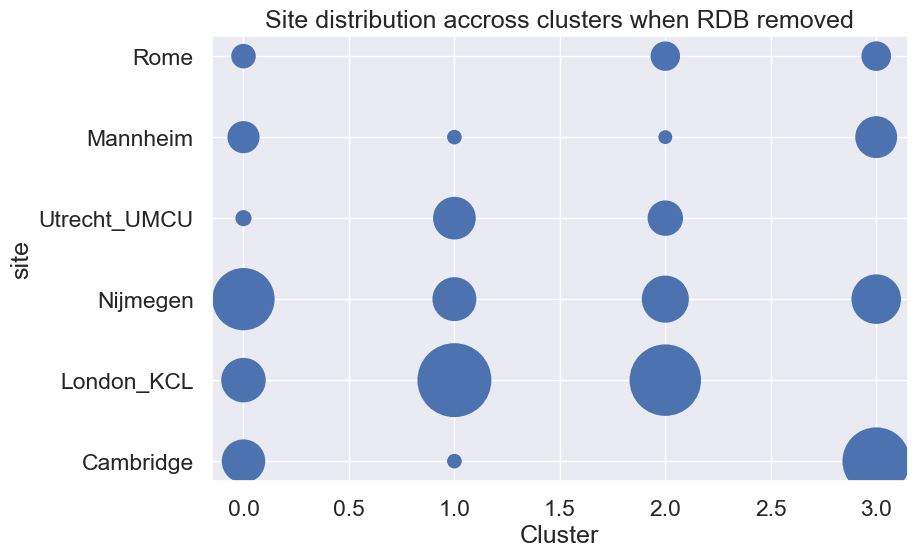

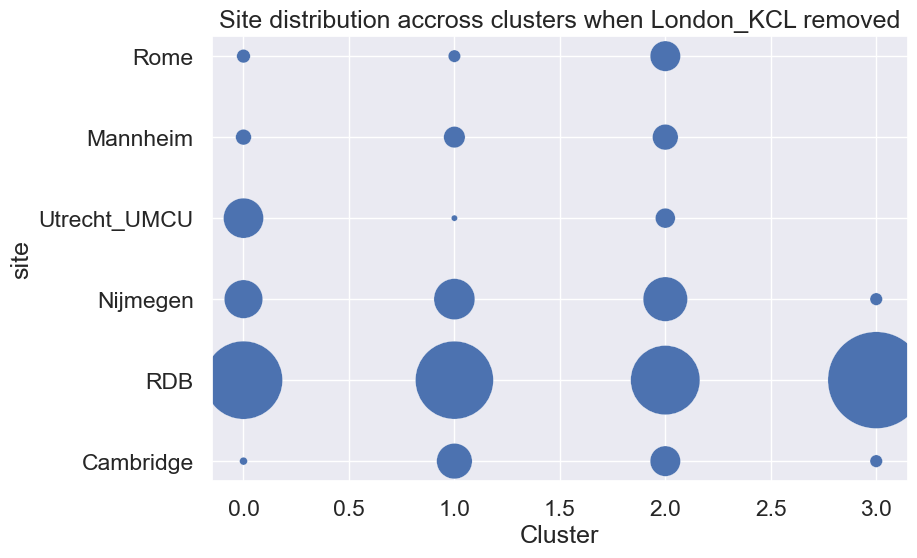

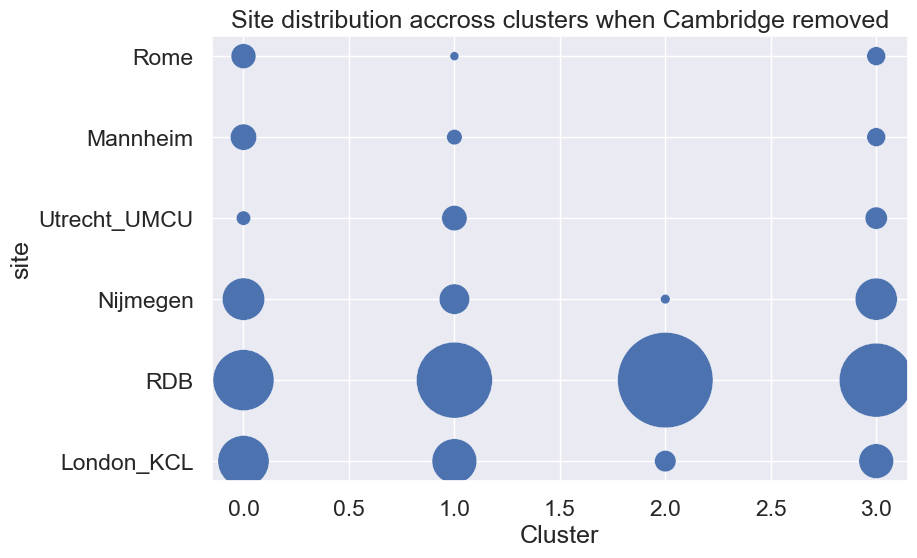

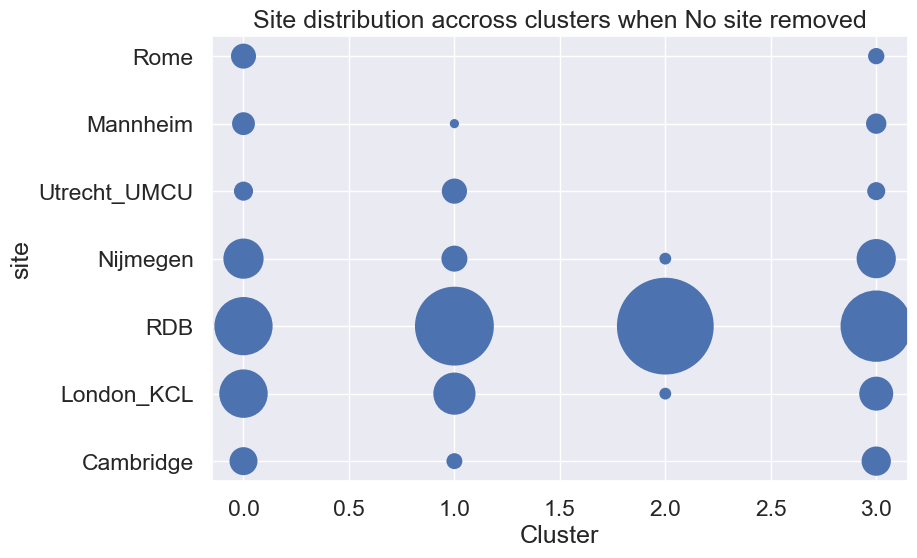

In [406]:
l_site = list(set(Z_df_pred['site']))
l_site.append('No site')

for s in l_site:
    temp_Z_df = Z_df_pred.loc[Z_df_pred['site'] != s]


    model = GaussianMixture(n_components=n_clusters).fit(temp_Z_df[cols_df])
    gm_labels = model.predict(temp_Z_df[cols_df])
    GMM_df = temp_Z_df.assign(Cluster = gm_labels)

    d = []
    for c in range(n_clusters):
        N_c = GMM_df.loc[GMM_df['Cluster'] == c].shape[0]
        for i in list(set(GMM_df.site)):
            d.append([c, i, GMM_df[(GMM_df.site == i) & (GMM_df.Cluster == c)].shape[0]/N_c])

    df_size = pd.DataFrame(d, columns = ['Cluster', 'site', 'size'])

    sns.set_theme(style="darkgrid",font_scale=1.5)
    c = sns.scatterplot(x = df_size['Cluster'], y = df_size['site'], s = df_size['size']*5000).set_title(f'Site distribution accross clusters when {s} removed')

    plt.show()

# CORRELATION 

In [407]:
from scipy import stats

In [412]:
# Compute Spearman's correlation between Z-Scores and autism scores for each cluster
# Red = significant correlation
def compute_spearman(GMM_df):
    ''' Returns 3 DataFrame : 
    1. With Spearman r
    2. With Pvalue 
    3. With Spearman r and Pvalue '''

    spearman_df = {}
    pval_df = {}
    double_df = {}

    for cluster in set(GMM_df['Cluster']):
        l = []
        pval = []
        d = []
        for score in Scores:
            temp_s = stats.spearmanr(GMM_df[score].loc[GMM_df['Cluster'] == cluster], 
                            GMM_df[cols_df].loc[GMM_df['Cluster'] == cluster].mean(axis =1 )).correlation
            temp_p = stats.spearmanr(GMM_df[score].loc[GMM_df['Cluster'] == cluster], 
                            GMM_df[cols_df].loc[GMM_df['Cluster'] == cluster].mean(axis =1 )).pvalue
            l.append(temp_s)
            pval.append(temp_p)
            d.append([temp_s, temp_p])
            double_df.update({cluster : d})
            spearman_df.update({cluster : l})
            pval_df.update({cluster : pval})

    #DataFrame with Spearman's r
    spearman_df = pd.DataFrame.from_dict(spearman_df)
    spearman_df.index = Scores
    
    #DataFrame with Pvalues
    pval_df = pd.DataFrame.from_dict(pval_df)
    pval_df.index = Scores
    
    #DataFrame with r and pval
    double_df = pd.DataFrame.from_dict(double_df)
    double_df.index = Scores

    
    # Bar plot
    for c in range(n_clusters):
        l_sig = []
        n=GMM_df.loc[GMM_df['Cluster'] == c].shape[0]
        if (n != 0):
            for idx,i in enumerate(double_df[c]):

                if i[1] < 0.05:

                    l_sig.append(idx)

            l_col = []
            for k in range(len(Scores)):
                if k in l_sig:
                    l_col.append('red')
                else:
                    l_col.append('blue')


            fig = plt.figure(figsize = (10, 5))

            # creating the bar plot
            y_pos = range(len(double_df.index))
            barlist = plt.bar(y_pos,spearman_df[c], color = l_col,
                width = 0.4)


            plt.ylim(-0.8, 0.8)
            plt.xticks(y_pos, Scores, rotation = 90)
            if (mode == 'clinic'):
                plt.title("Correlation Mean Z w/ clinical scores")
            elif (mode == 'genetic'):
                plt.title("Correlation Mean Z w/ genetic scores")
            print('N = ', n)
            plt.show()

    return spearman_df, pval_df, double_df



### Correlation on raw clusters

In [457]:
mode = input("Correlation with clincal or genetic scores ? (clinic/genetic/IQ)\n")

Correlation with clincal or genetic scores ? (clinic/genetic/IQ)
clinic


In [458]:
# Returns a DataFrame without NA according the criteria above

temp_df = GMM_df.copy()
if (mode == 'clinic'):

    Scores = ['t1_adi_social_total', 't1_adi_rrb_total', 't1_srs_tscore',
    't1_rbs_total']
    
    
    for i in GMM_df[Scores]:
        temp_df[i] = temp_df[i].replace({999 : np.nan,777: np.nan})

    clean_df = temp_df.dropna(subset = Scores)
#     .join(temp_df['Cluster']).join(temp_df[cols_df])
elif (mode == 'genetic'):
    Scores = ['PGS_ASD_ipsych_Z',
             'PGS_ADHD_Z',
             'PGS_BMI_Z',
             'PGS_Chronotype_Z',
             'PGS_EduYears_Z',
             'PGS_Epilepsy_Z',
             'PGS_EQ_Z',
             'PGS_Insomnia_Z',
             'PGS_Intelligence_Z',
             'PGS_MDD_Z',
             'PGS_Neuroticism_Z',
             'PGS_SCZ2_Z',
             'PGS_SQ_Z',
             'PGS_SWB_Z',
             'PGS_xDx_ipsych_Z']
    clean_df = GMM_df.merge(pgs_file.dropna(subset = Scores), on  = 'participant_id', how = 'inner')
    

elif (mode == 'IQ'):
    Scores = ['Total_IQ']
    
    clean_df = GMM_df.dropna(subset = Scores)

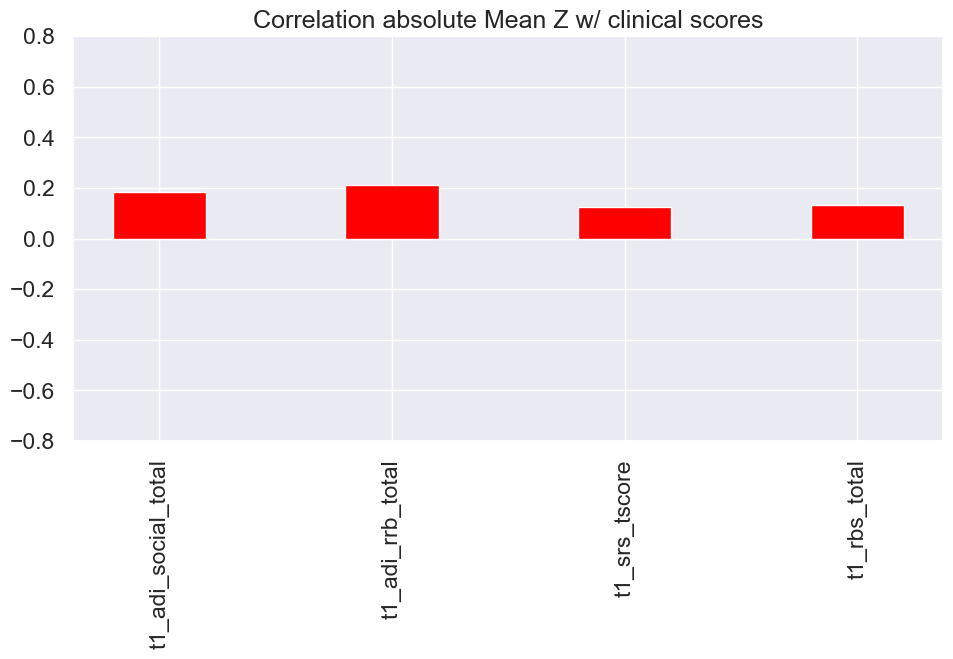

In [459]:
# Compute correlations on whole ASD cohort

clean_df = clean_df.loc[clean_df['ASD'] == 'Yes']
                                                            
l = []
pval = []
d = []
for score in Scores:
    temp_s = stats.spearmanr(clean_df[score], 
                            abs(clean_df[cols_df]).mean(axis =1)).correlation
    temp_p = stats.spearmanr(clean_df[score], 
                            abs(clean_df[cols_df]).mean(axis =1)).pvalue


    d.append([score, temp_s, temp_p])
    cohort_df = pd.DataFrame(d, columns = ['Var', 'R','Pval'])

l_sig = []
for i in cohort_df.index:
    if cohort_df.iloc[i]['Pval'] > 0.05:
        l_sig.append('blue')
    else:
        l_sig.append('red')
        
fig = plt.figure(figsize = (10, 5))

    # creating the bar plot
y_pos = range(len(cohort_df.index))
barlist = plt.bar(y_pos, cohort_df['R'], color = l_sig,
    width = 0.4)


plt.ylim(-0.8, 0.8)
plt.xticks(y_pos, Scores, rotation = 90)
if (mode == 'clinic'):
    plt.title("Correlation absolute Mean Z w/ clinical scores")
elif (mode == 'genetic'):
    plt.title('ASD Correlation absolute Mean Z w/ genetic scores')

plt.show()

### Bootstraping clusters for correlation with autism score
*NA in scores removed before clustering*

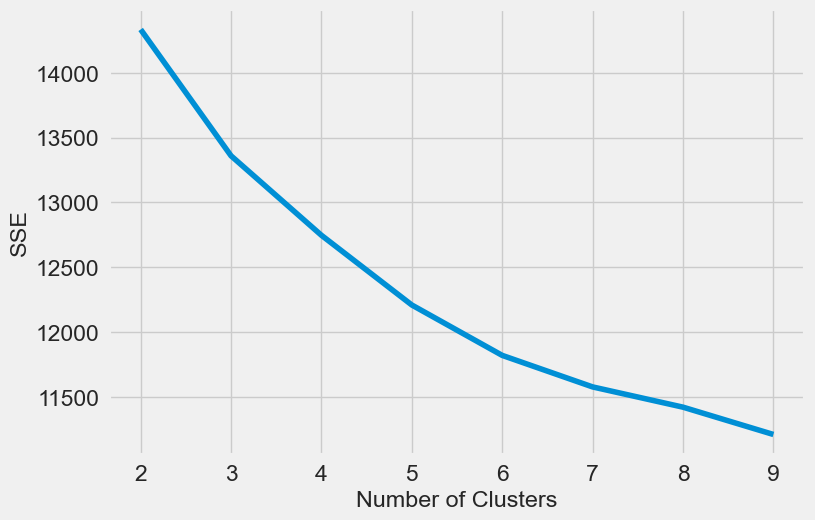

How many clusters ? : 4
How many bootstrap iterations for clustering ?  : 5


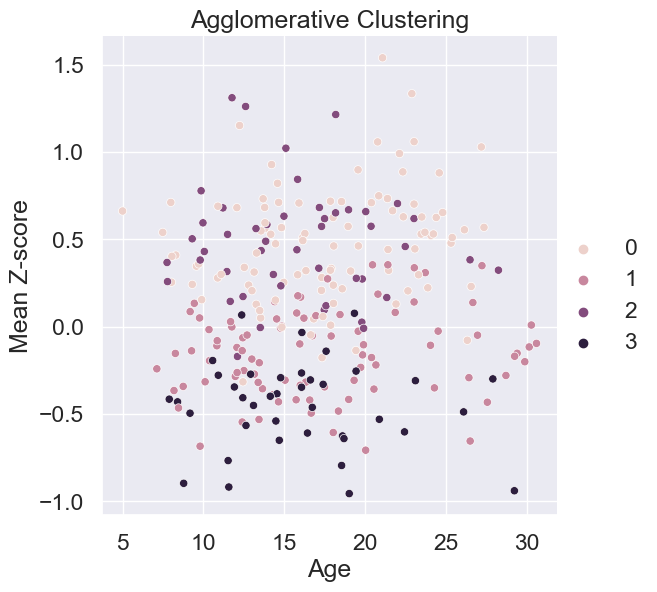

Show plot for each region ? [yes/no]
no
____________________________________________ Iteration :  0 

N =  100


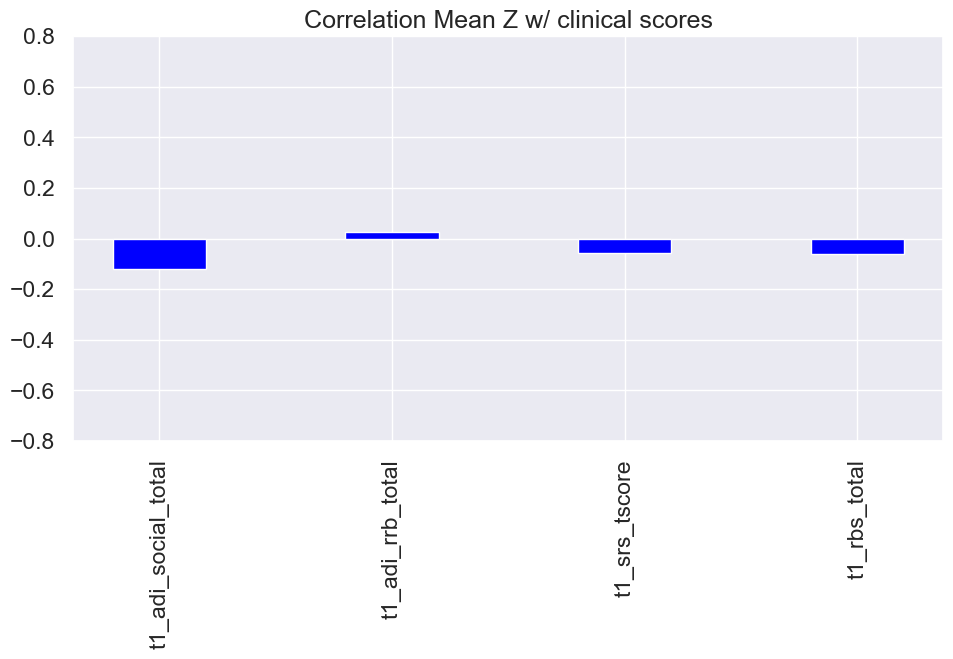

N =  89


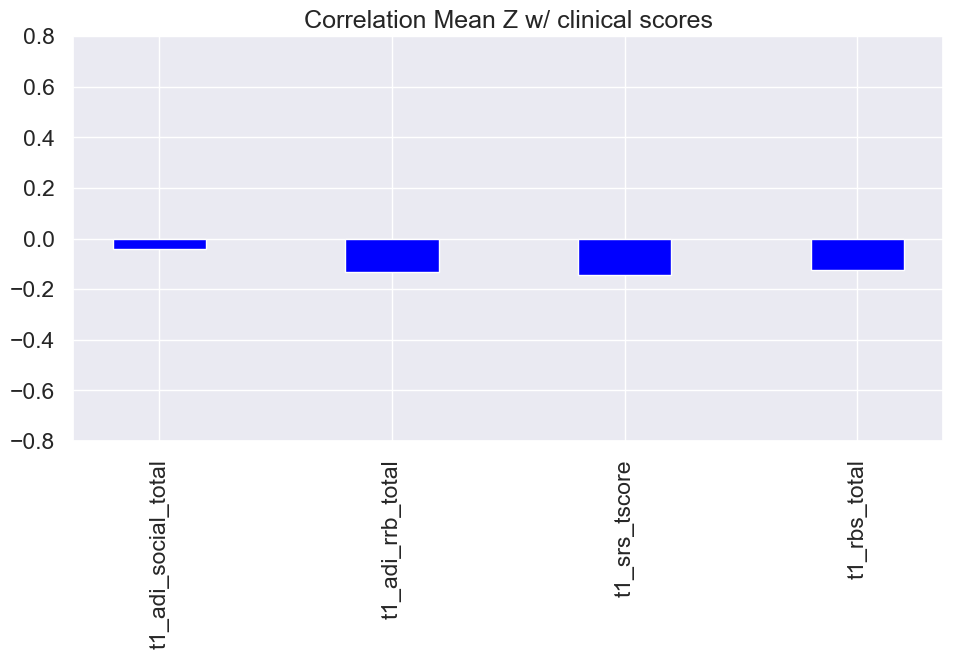

N =  47


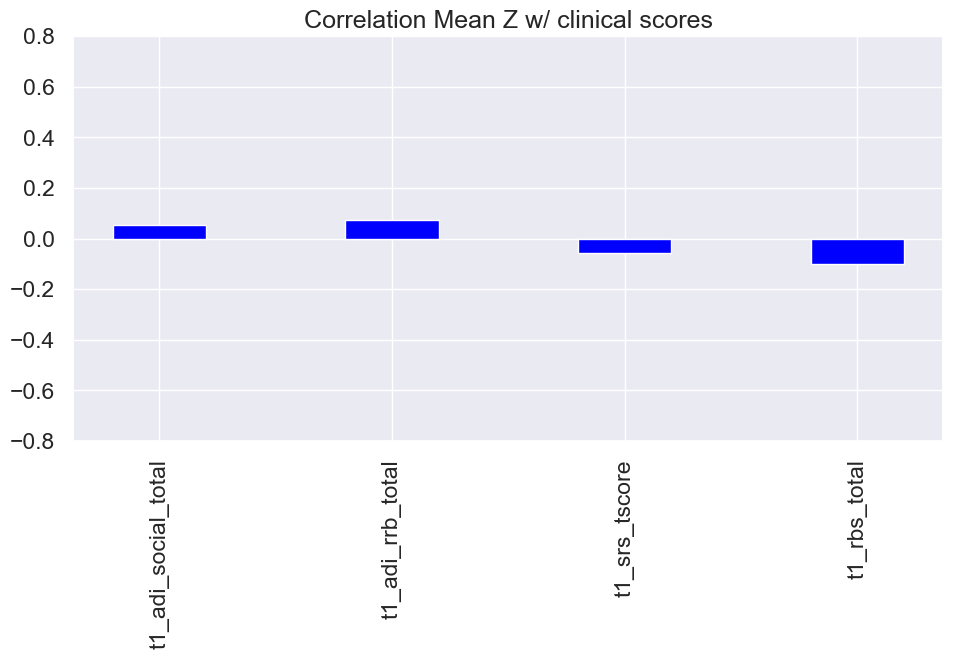

N =  39


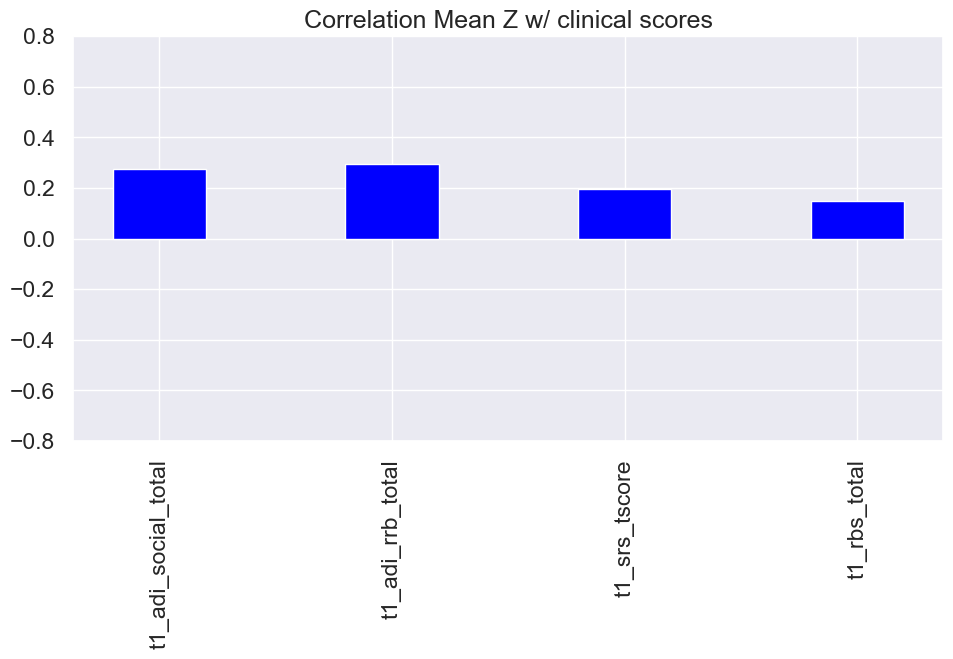

____________________________________________ Iteration :  1 

N =  100


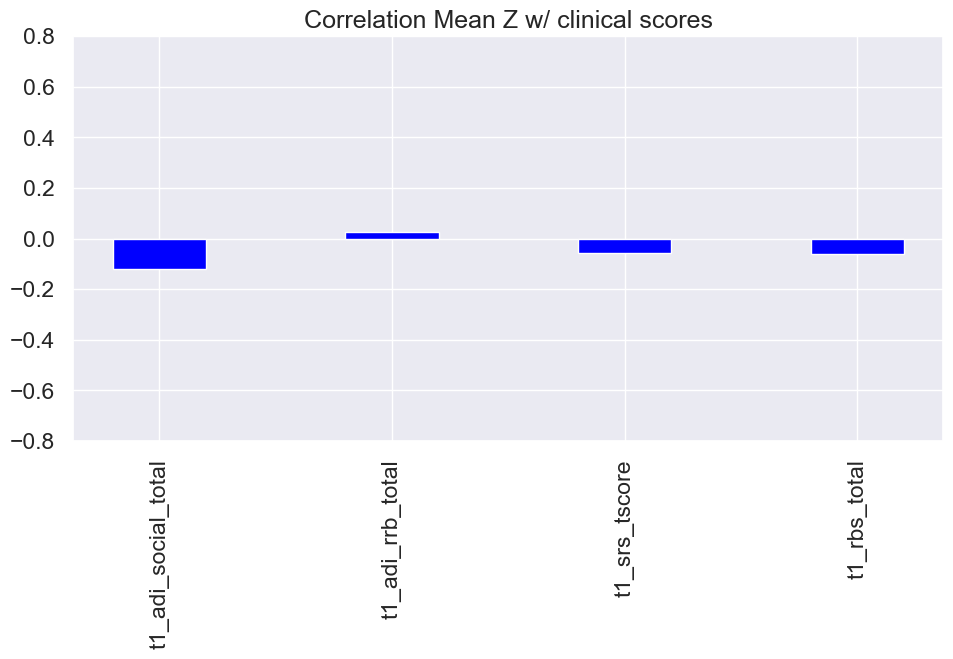

N =  89


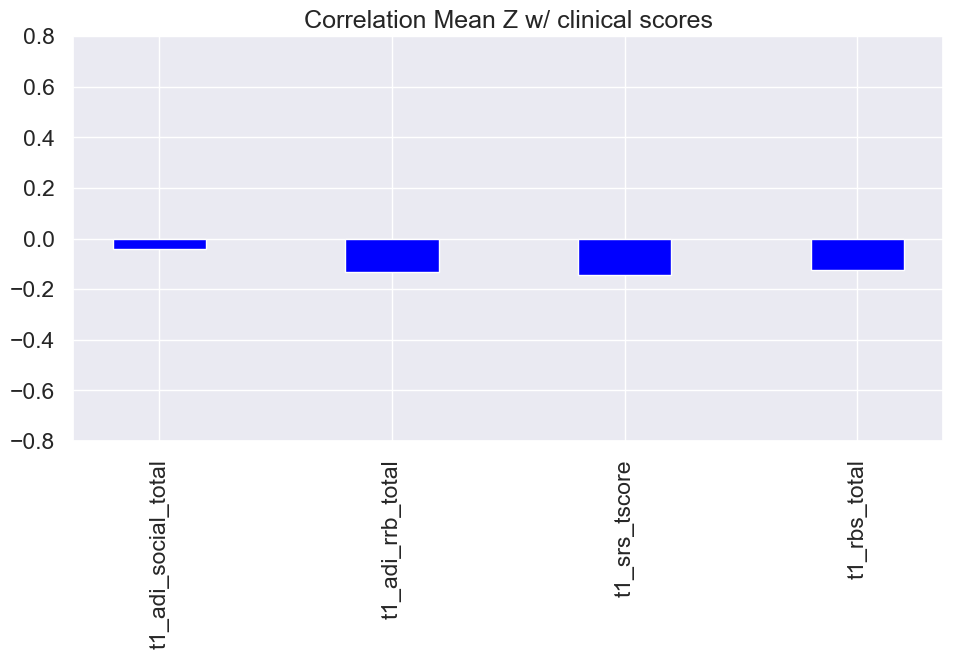

N =  47


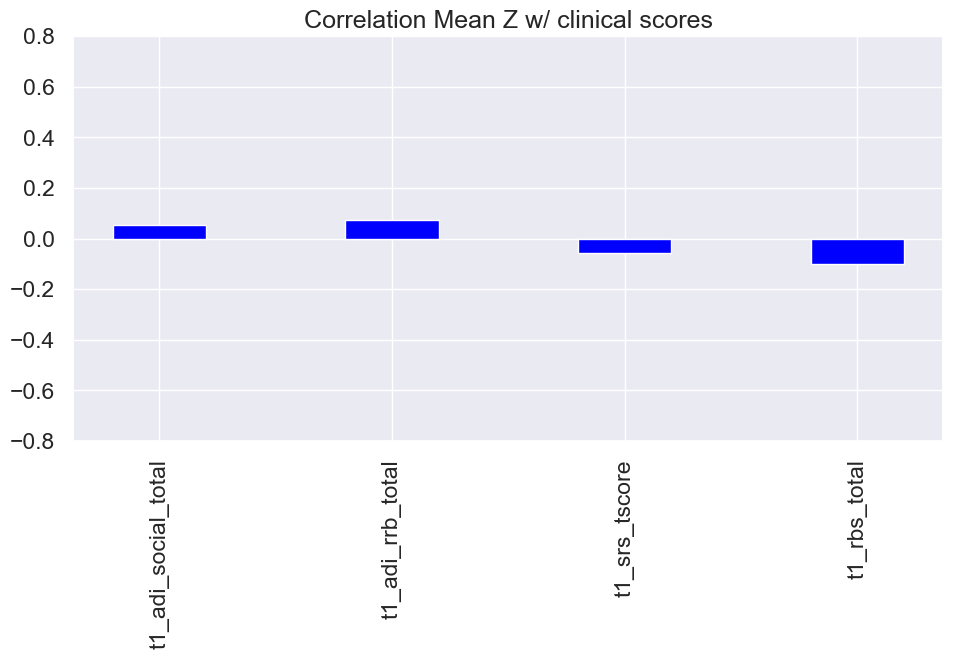

N =  39


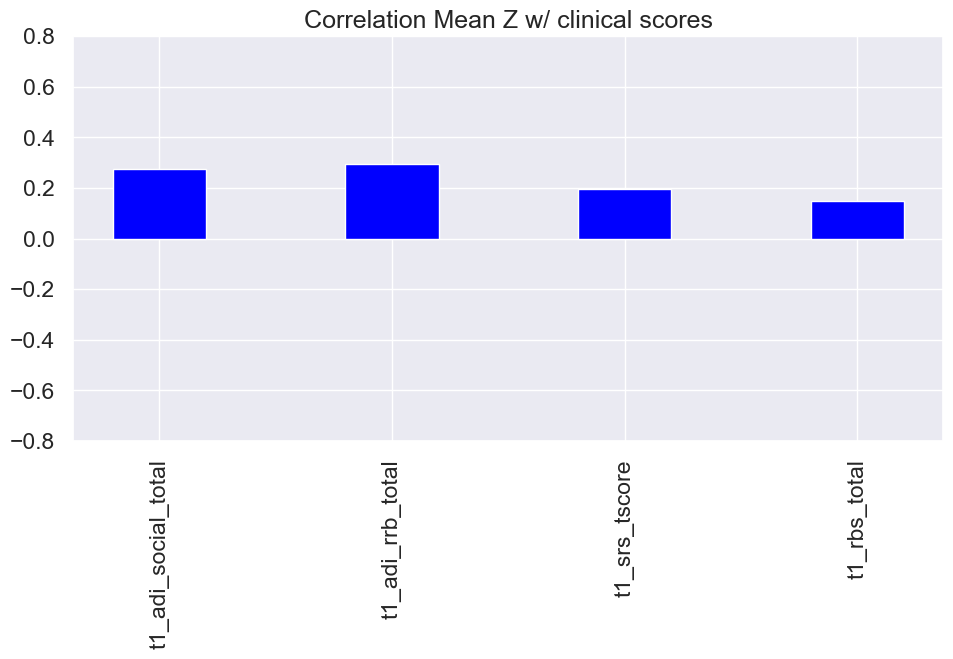

____________________________________________ Iteration :  2 

N =  100


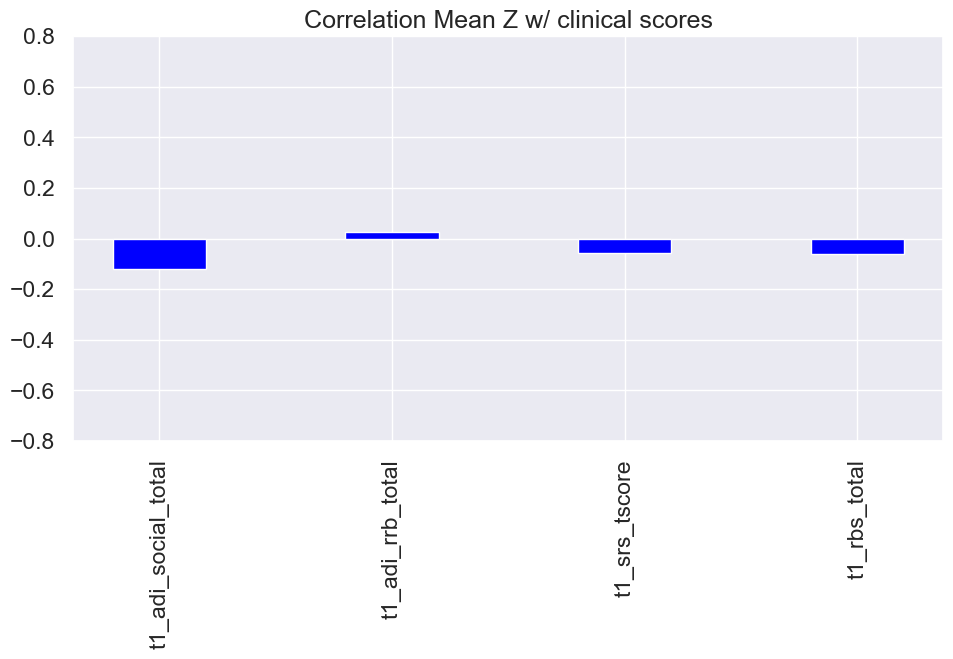

N =  89


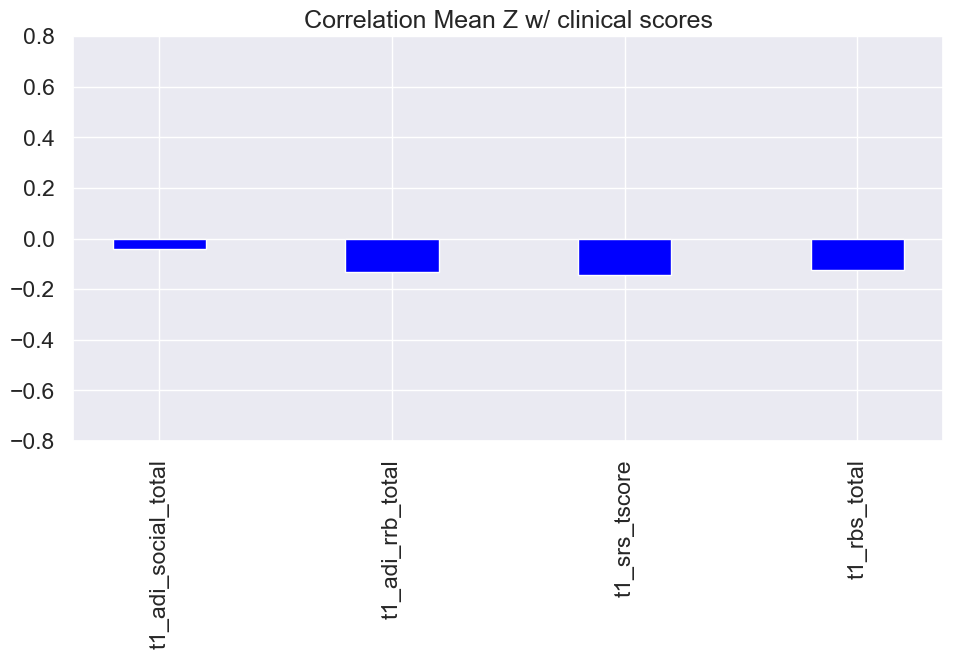

N =  47


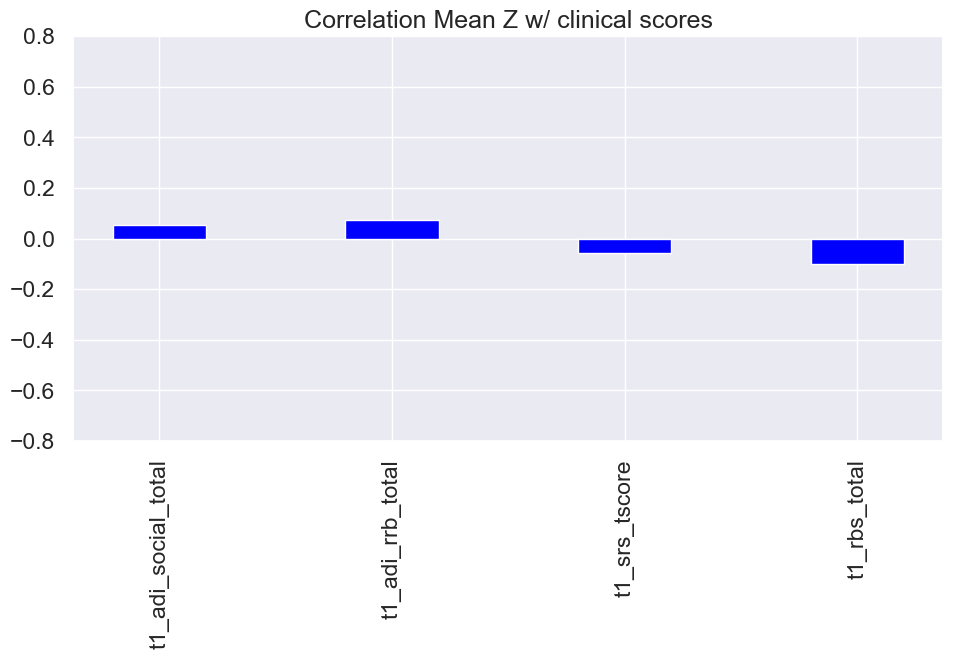

N =  39


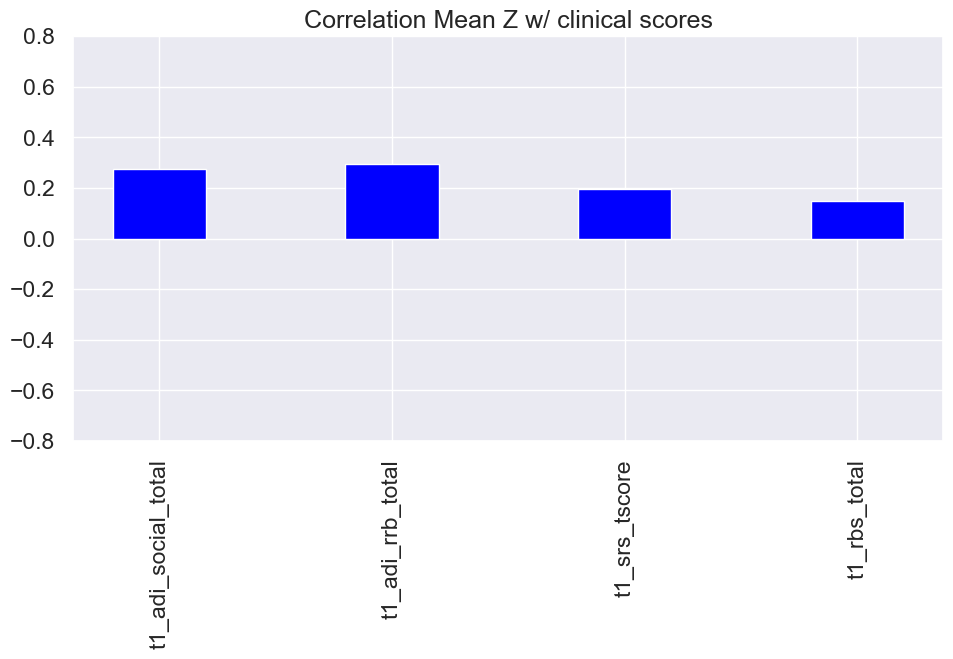

____________________________________________ Iteration :  3 

N =  100


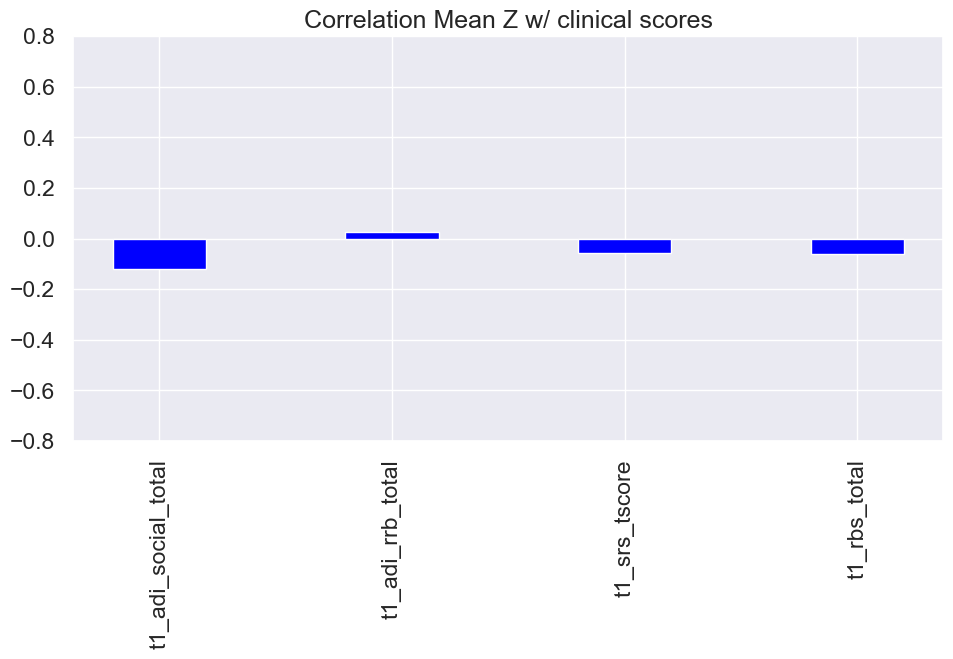

N =  89


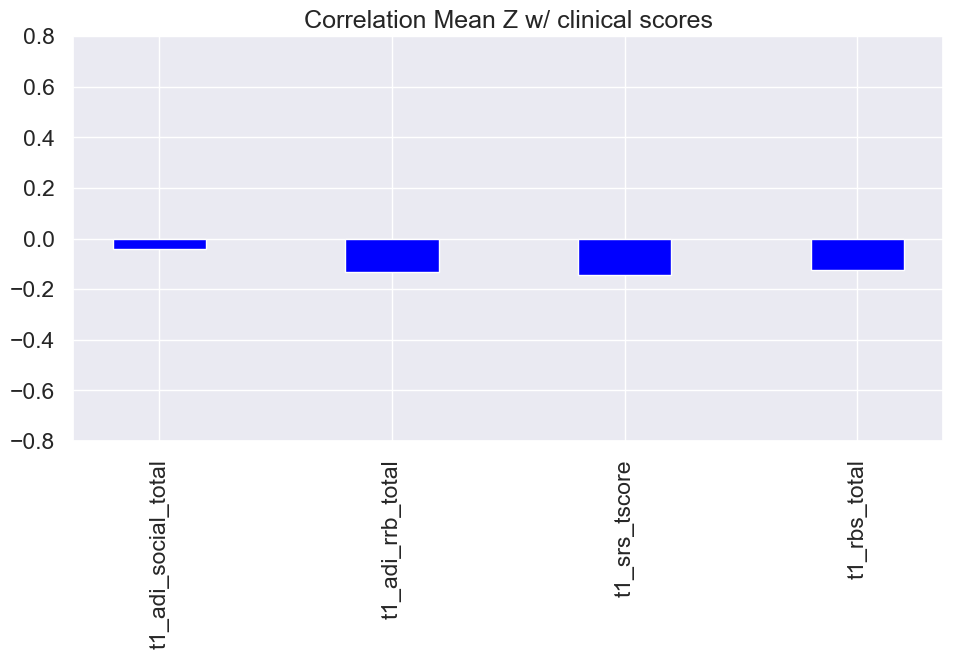

N =  47


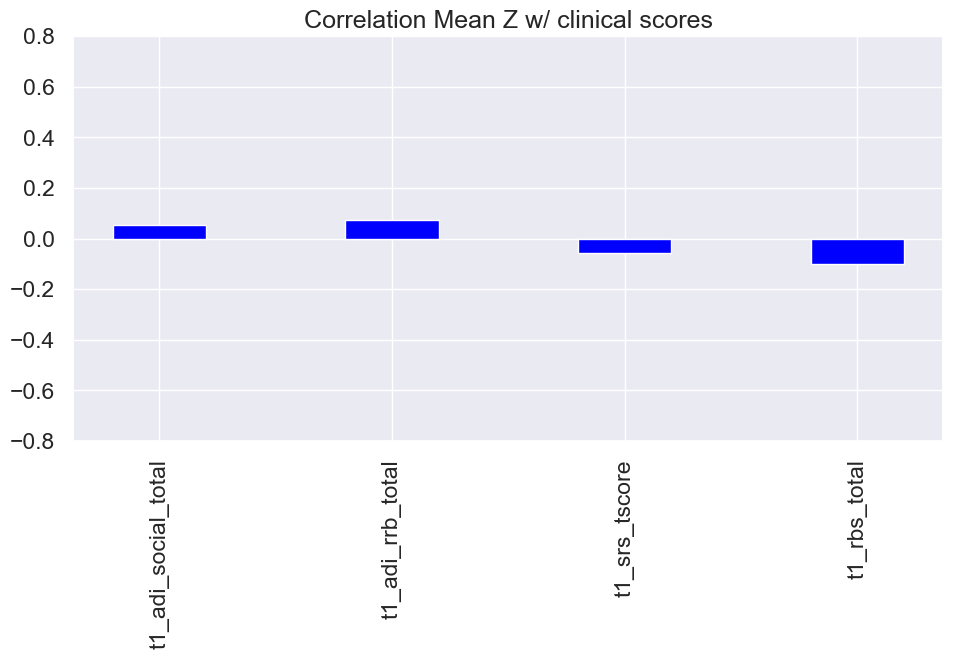

N =  39


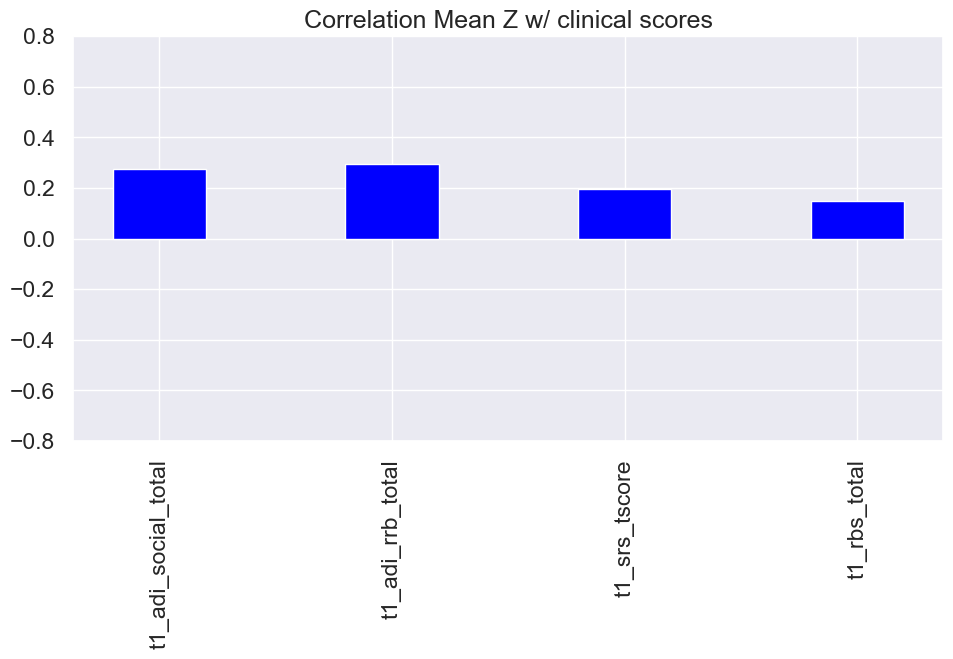

____________________________________________ Iteration :  4 

N =  100


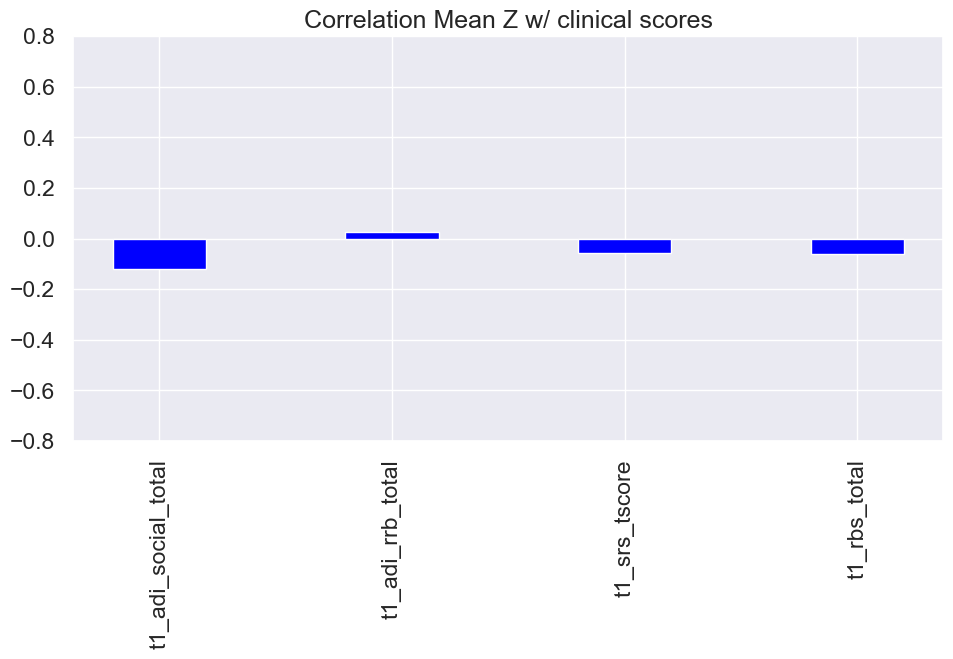

N =  89


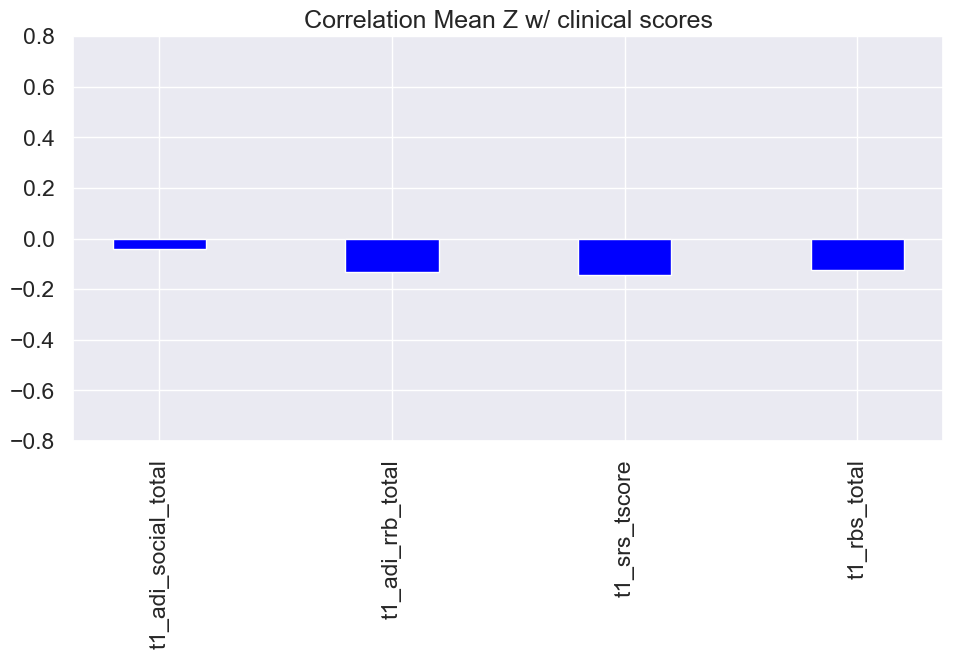

N =  47


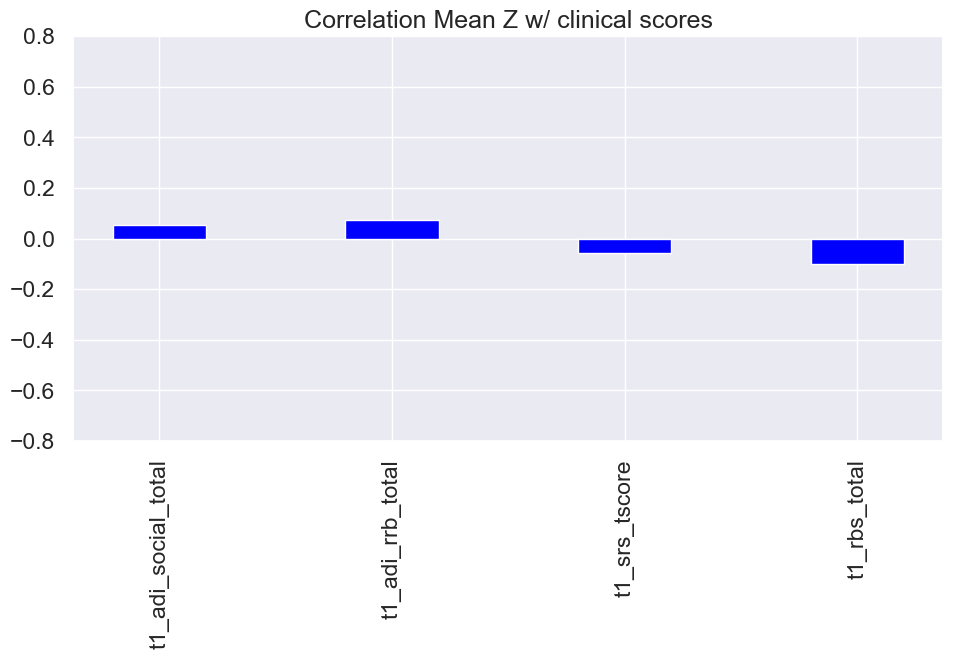

N =  39


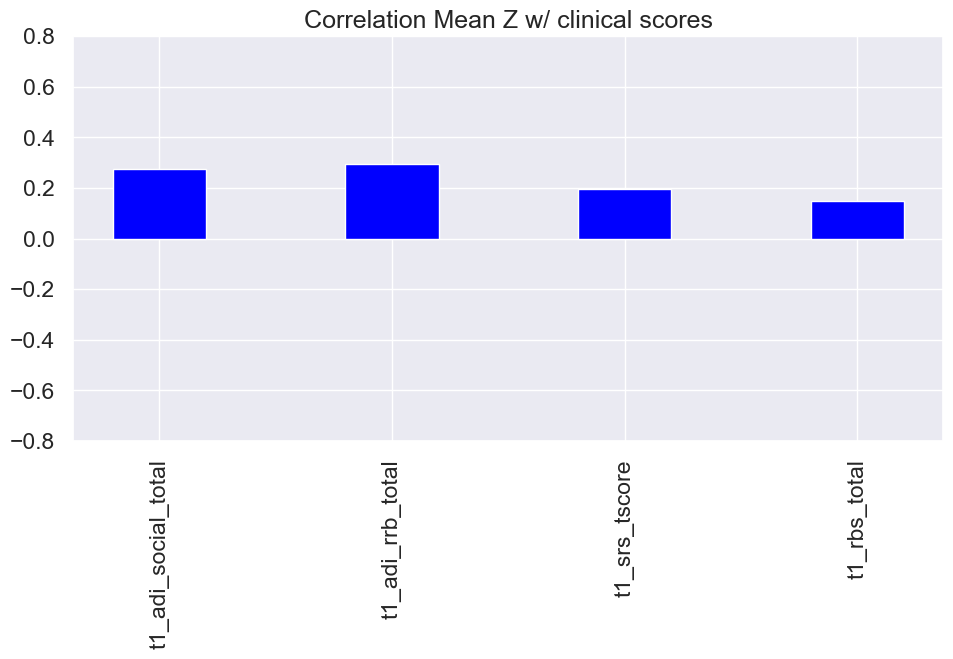

In [461]:
# Define autism scores 

clinic_Z_df = Z_df_pred.copy()
# Scores =  ['t1_adi_social_total','t1_adi_communication_total', 't1_adi_rrb_total',
#            't1_css_total_all', 't1_sa_css_all', 't1_rrb_css_all',
#           't1_srs_tscore', 't1_srs_tscore_self',
         
#           't1_rbs_total',
#           't1_ssp_total',
#          't1_adhd_inattentiv_parent', 't1_adhd_hyperimpul_parent']
Scores = ['t1_adi_social_total', 't1_adi_rrb_total', 't1_srs_tscore',
   't1_rbs_total']

mode = 'clinic'
# Remove all subjects having at least 1 NA 
clinic_Z_df[Scores] = Z_df_pred[Scores].replace({999 : np.nan, 777 : np.nan})
clinic_Z_df = clinic_Z_df.dropna(subset = Scores)

# Find optimal number of clusters
find_K(clinic_Z_df)
n_clusters = int(input('How many clusters ? : '))
boot_clus = int(input('How many bootstrap iterations for clustering ?  : '))

# Perform clustering with bootstrapping
all_clus, GMM_df, super_clus = boot_clustering(boot_clus+1, clinic_Z_df)

# Display clustering summary
#n_min = int(input("Set the minimum N per cluster  : "))
#print('All models contaning less than ', n_min, 'individuals will be removed from analyses')
#summary, dfs = filter_clusters(n_min, super_clus)
#summary

for i in range(len(all_clus) -1):
    print('____________________________________________ Iteration : ', i, '\n')
    spearman_df, pval_df, double_df = compute_spearman(all_clus[i])

### // Boostrapping clusters for correlation with PGS 

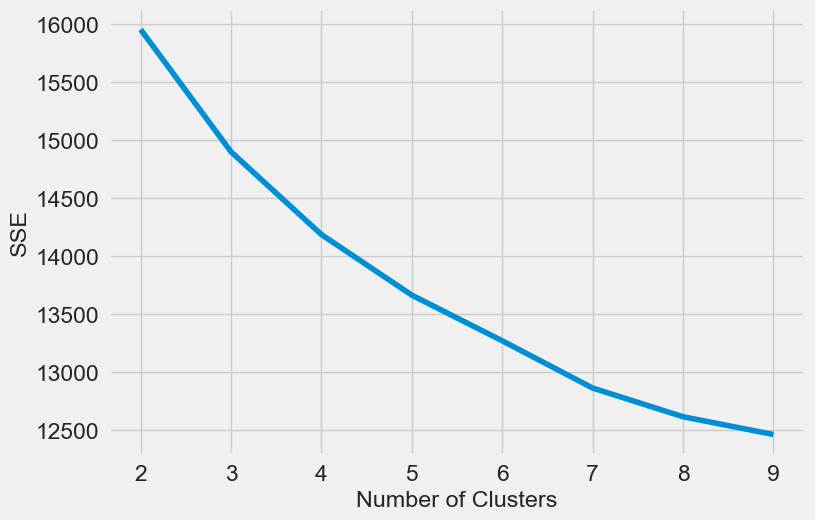

How many clusters ? : 4
How many bootstrap iterations for clustering ?  : 2


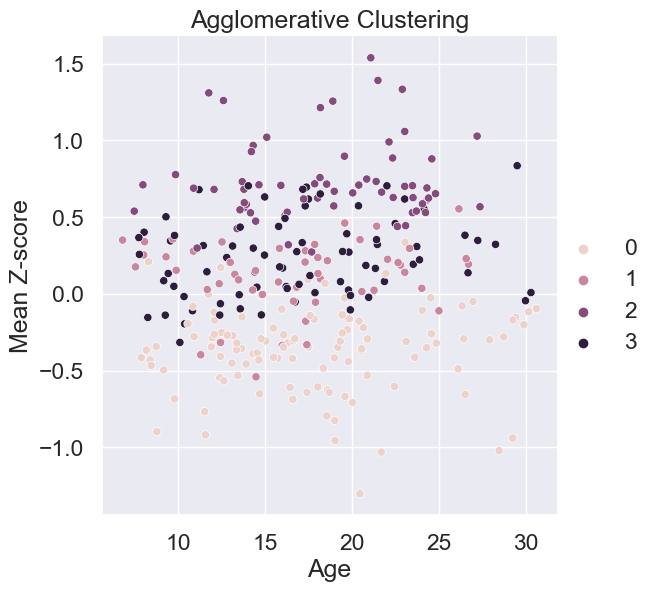

Show plot for each region ? [yes/no]
no
____________________________________________ Iteration :  0 

N =  110


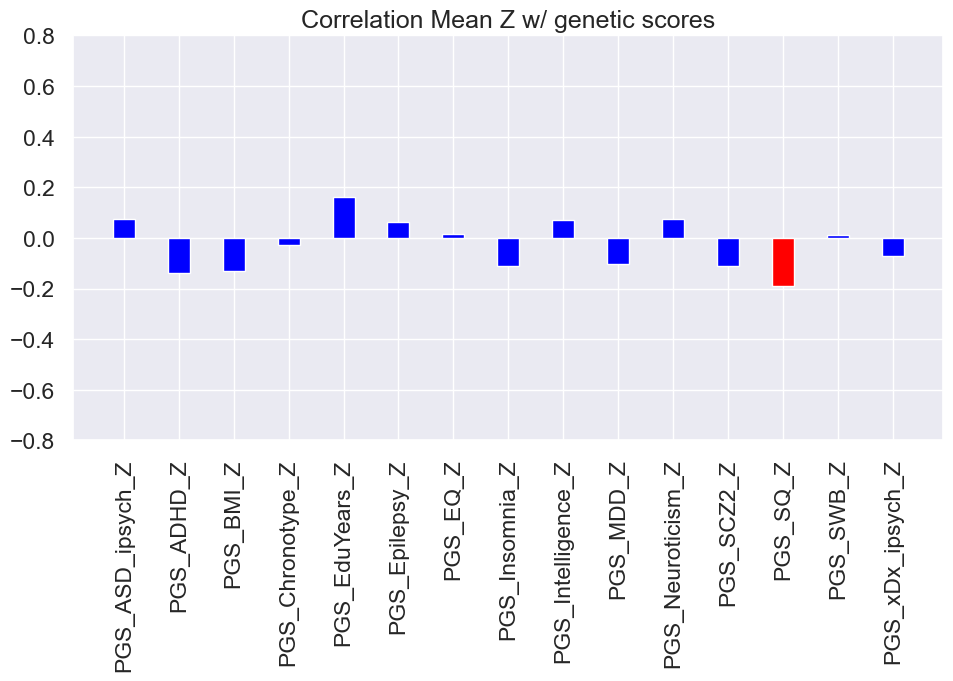

N =  52


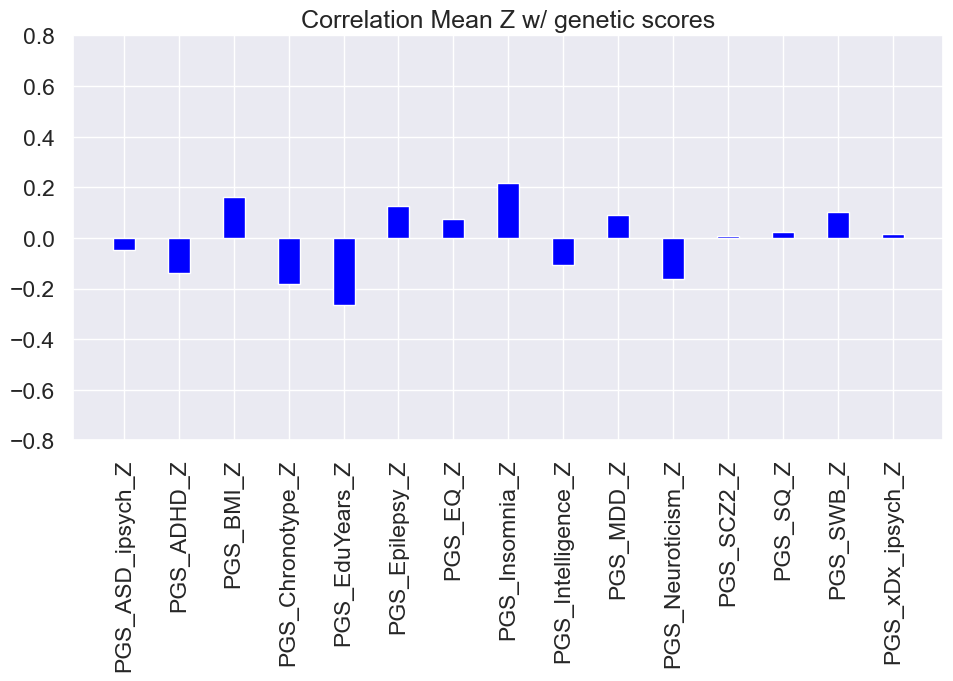

N =  64


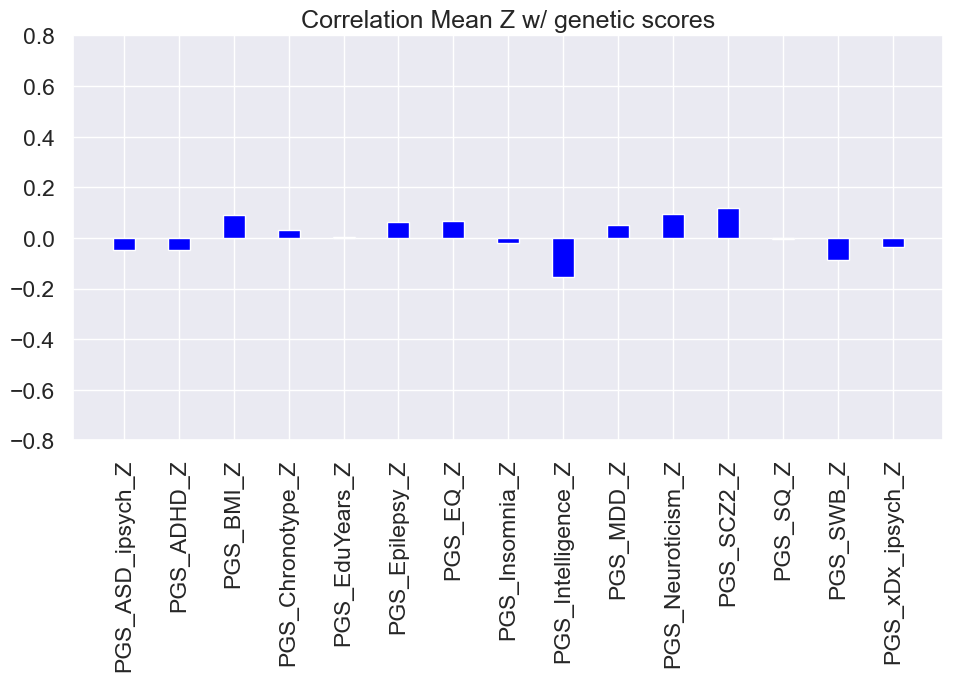

N =  76


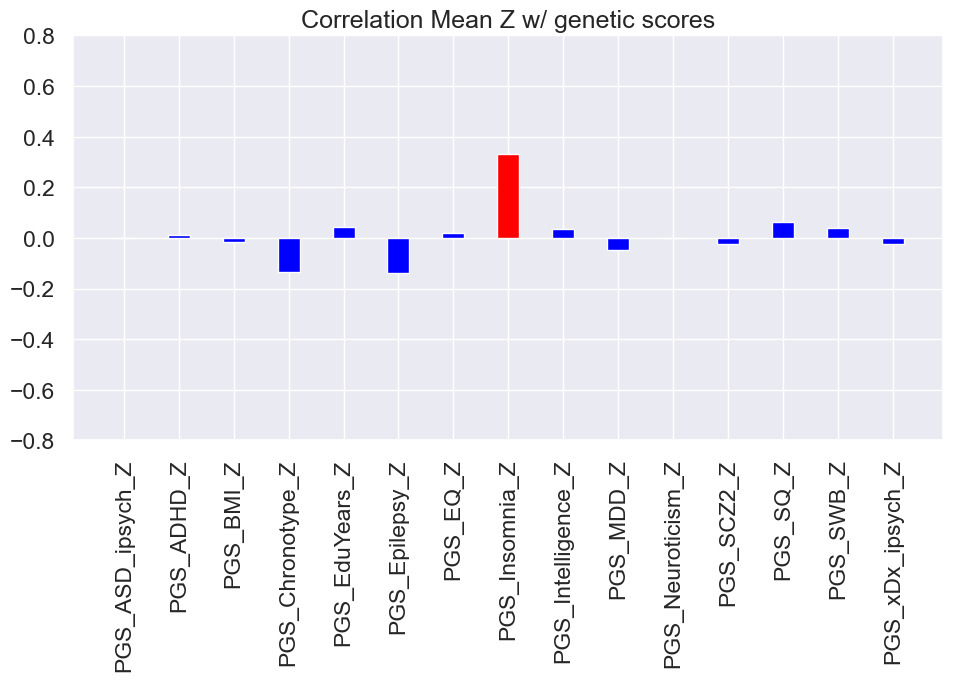

____________________________________________ Iteration :  1 

N =  110


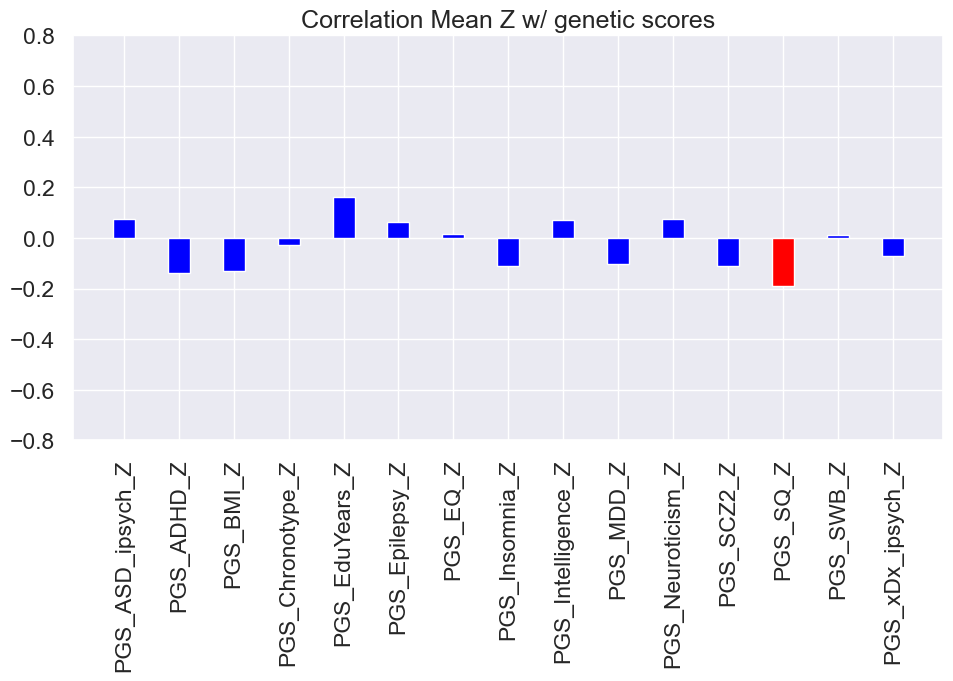

N =  52


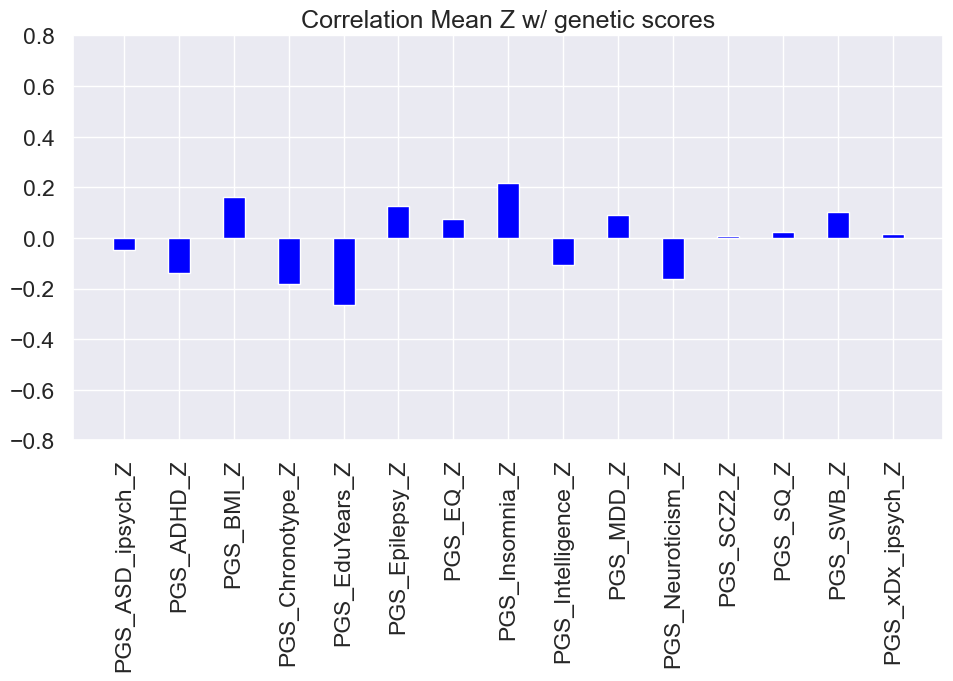

N =  64


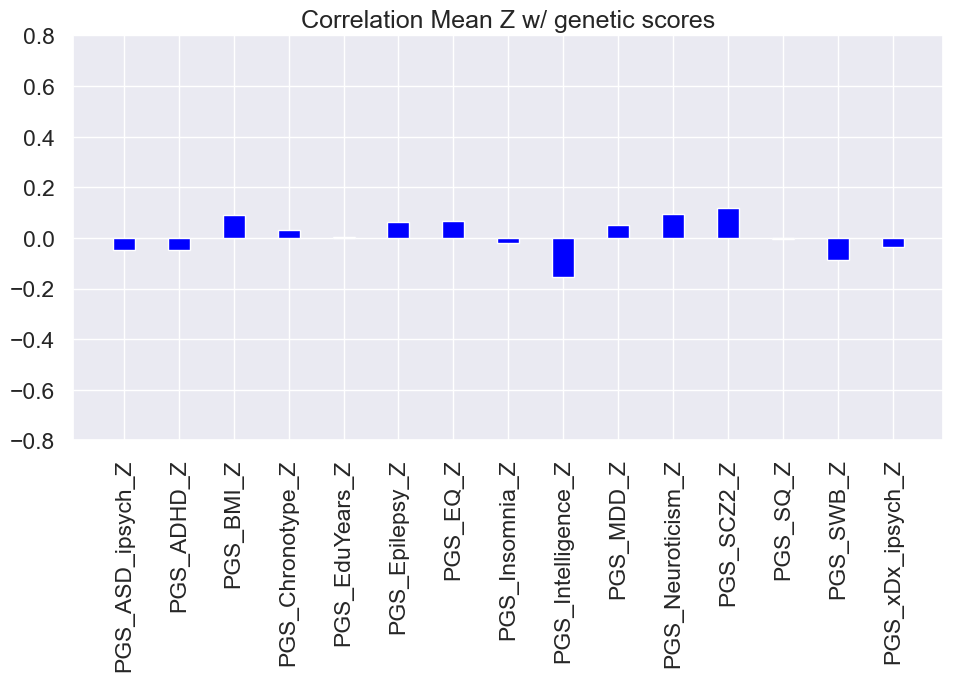

N =  76


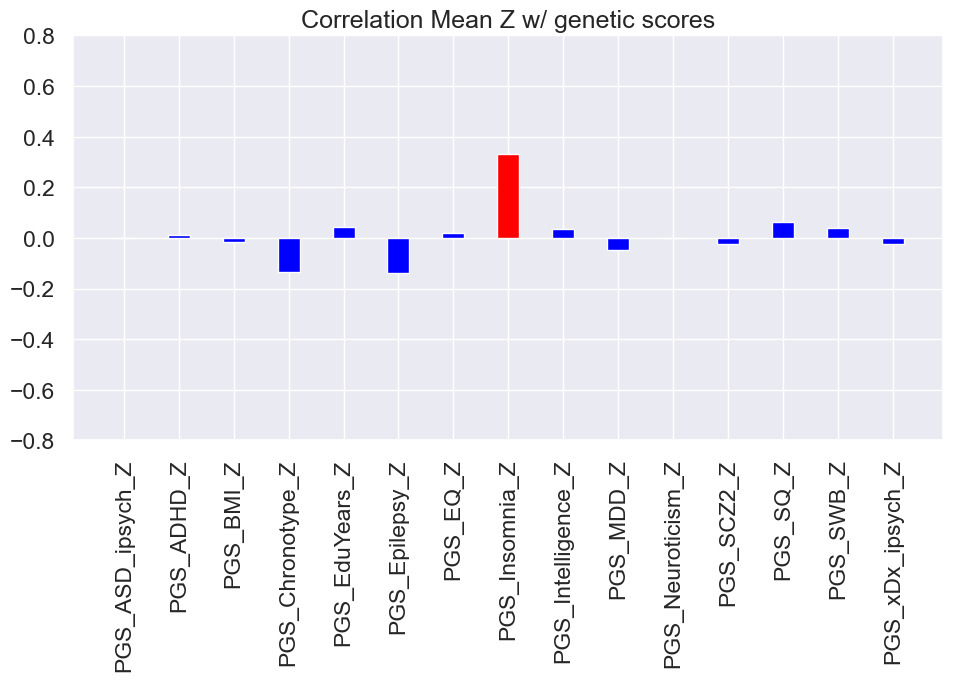

In [462]:
# Define PGS

Scores = ['PGS_ASD_ipsych_Z',
             'PGS_ADHD_Z',
             'PGS_BMI_Z',
             'PGS_Chronotype_Z',
             'PGS_EduYears_Z',
             'PGS_Epilepsy_Z',
             'PGS_EQ_Z',
             'PGS_Insomnia_Z',
             'PGS_Intelligence_Z',
             'PGS_MDD_Z',
             'PGS_Neuroticism_Z',
             'PGS_SCZ2_Z',
             'PGS_SQ_Z',
             'PGS_SWB_Z',
             'PGS_xDx_ipsych_Z']

# Merge Z-scores with PGS, drop NA
pgs_Z_df = Z_df_pred.merge(pgs_file.dropna(subset = Scores), on  = 'participant_id', how = 'inner')
mode = 'genetic'

# Find number of clusters 
find_K(pgs_Z_df)
n_clusters = int(input('How many clusters ? : '))
boot_clus = int(input('How many bootstrap iterations for clustering ?  : '))

# Perform clustering with bootstrapping
all_clus, GMM_df, super_clus = boot_clustering(boot_clus+1, pgs_Z_df)

# Display clustering summary
#n_min = int(input("Set the minimum N per cluster  : "))
#print('All models contaning less than ', n_min, 'individuals will be removed from analyses')
#summary, dfs = filter_clusters(n_min, super_clus)
#summary

for i in range(len(all_clus) -1):
    print('____________________________________________ Iteration : ', i, '\n')
    spearman_df, pval_df, double_df = compute_spearman(all_clus[i])

### Visualisation of absolute Z-Scores for each cluster (optional)

In [463]:
# Absolute Z-scores of each region mapped onto brain for each cluster
for i in range(n_clusters):
    CT_d_fsa5 = parcel_to_surface(abs(GMM_df.loc[GMM_df['Cluster'] == i][cols_df]).mean(), 'aparc_fsa5')
    plot_cortical(array_name=CT_d_fsa5, surface_name="fsa5", size=(800, 400),
                  cmap='Reds', color_bar=True, color_range=(0,3))

# BOXPLOTS

In [464]:
mode = input('clinic/genetic\n' )

clinic/genetic
clinic


In [465]:
GMM_df['Cluster'].value_counts()

0    110
3     76
2     64
1     52
Name: Cluster, dtype: int64

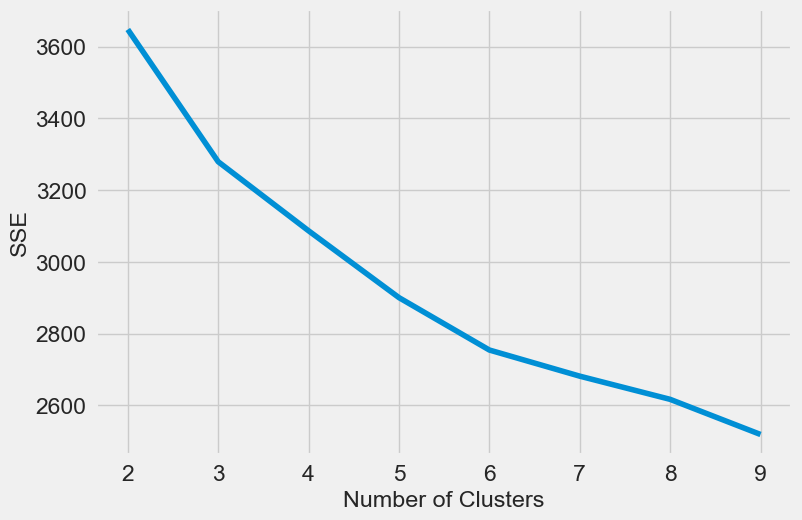

How many clusters ? : 4


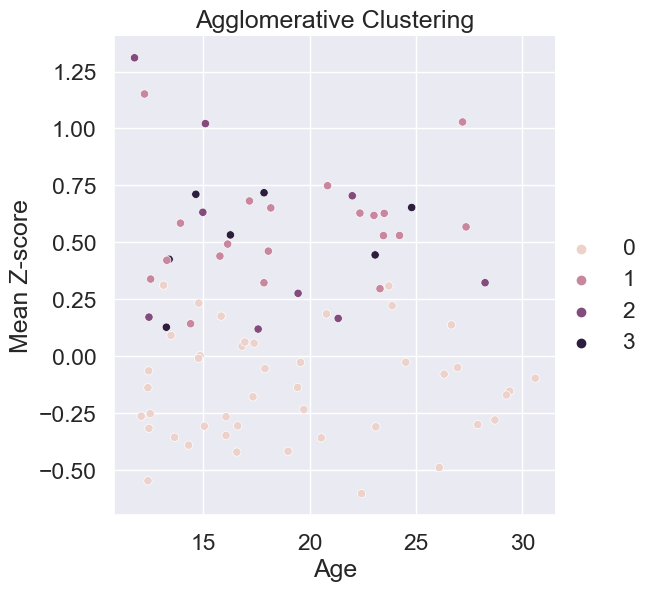

Show plot for each region ? [yes/no]
no
1    20
0    44
2     9
3     7
Name: Cluster, dtype: int64


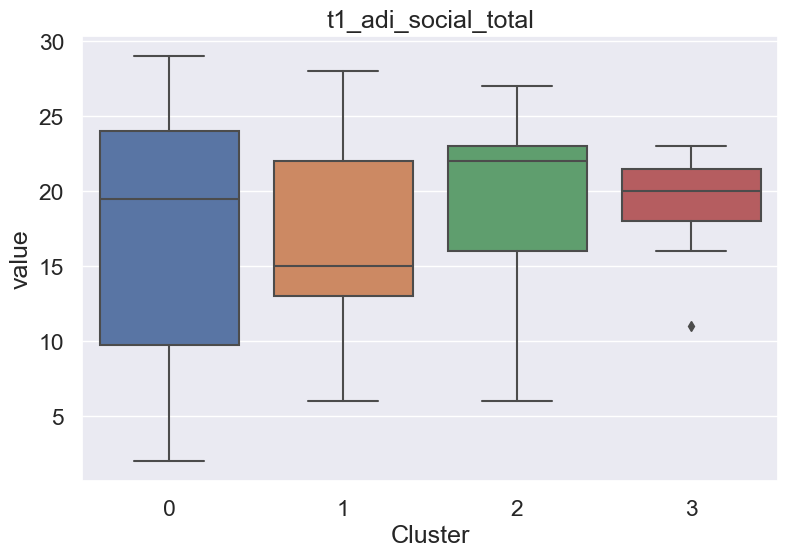

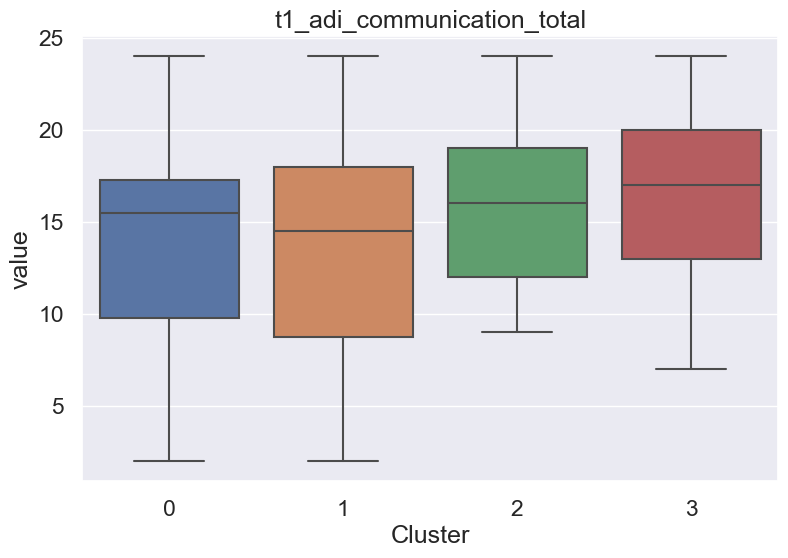

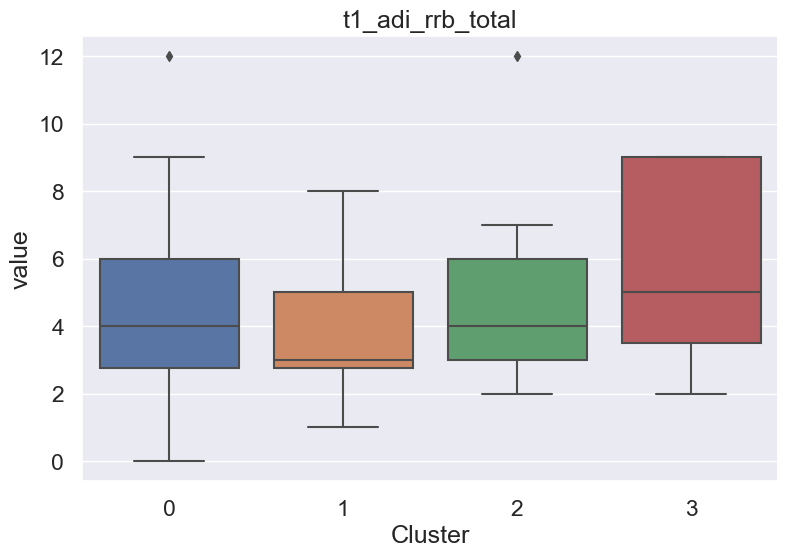

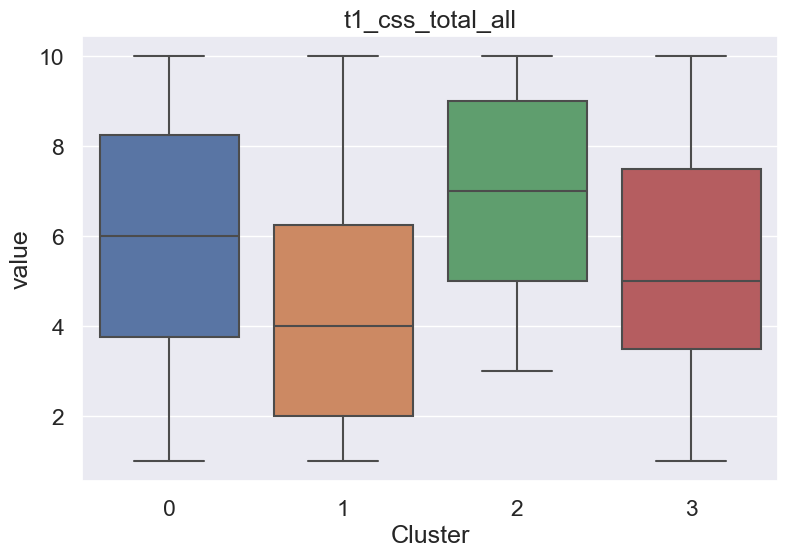

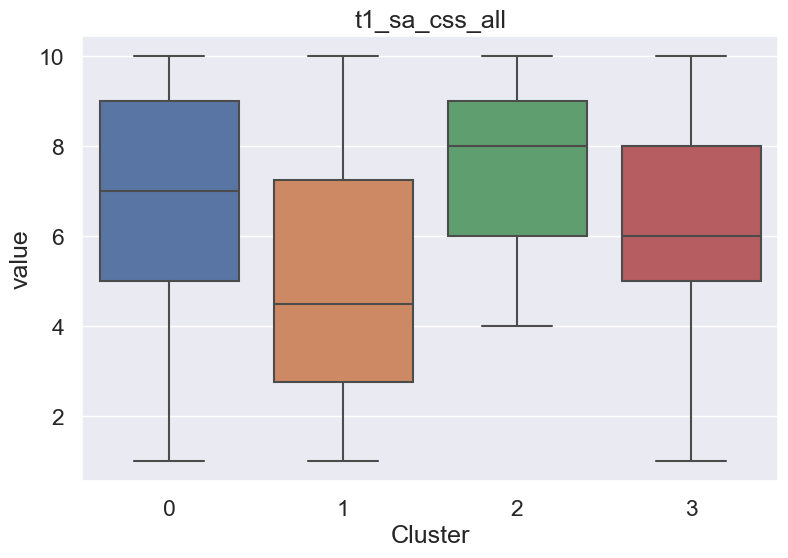

...

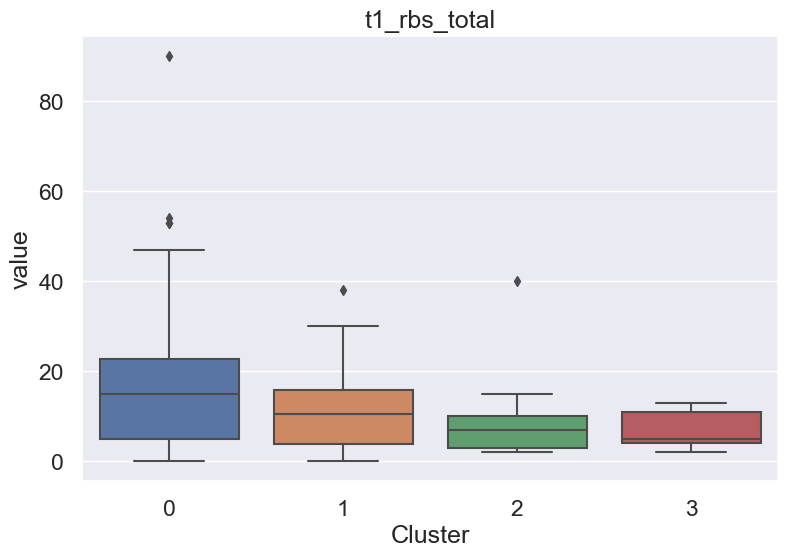

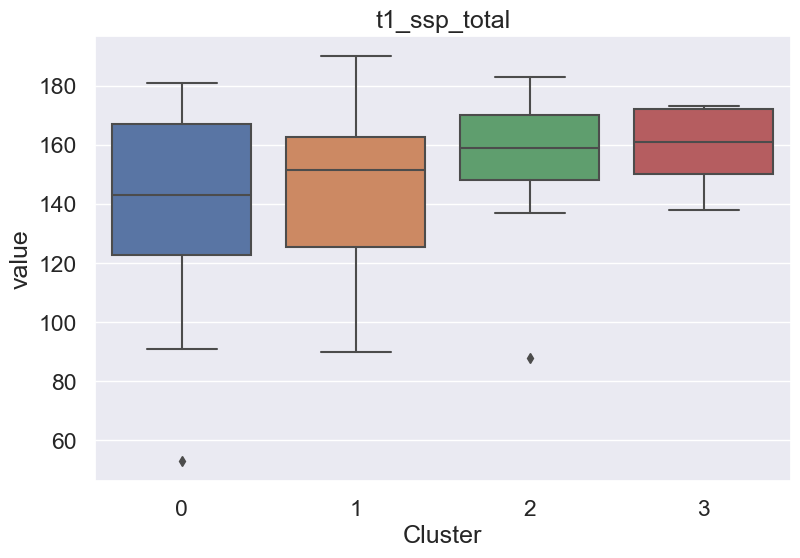

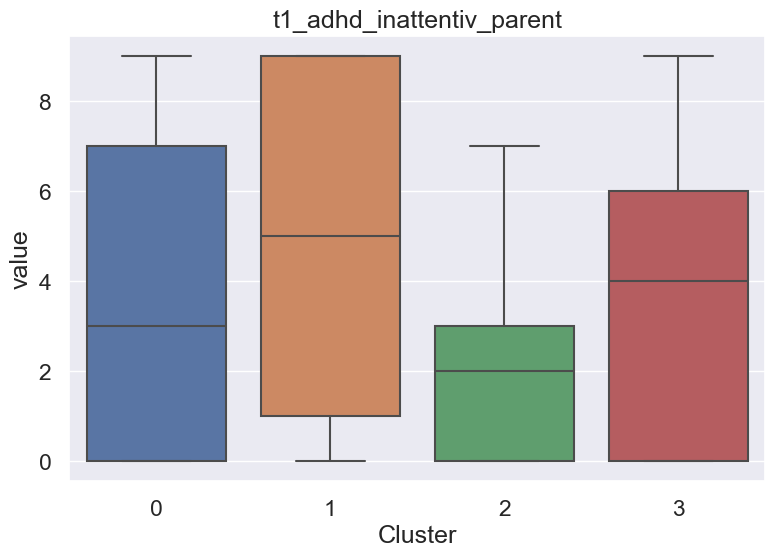

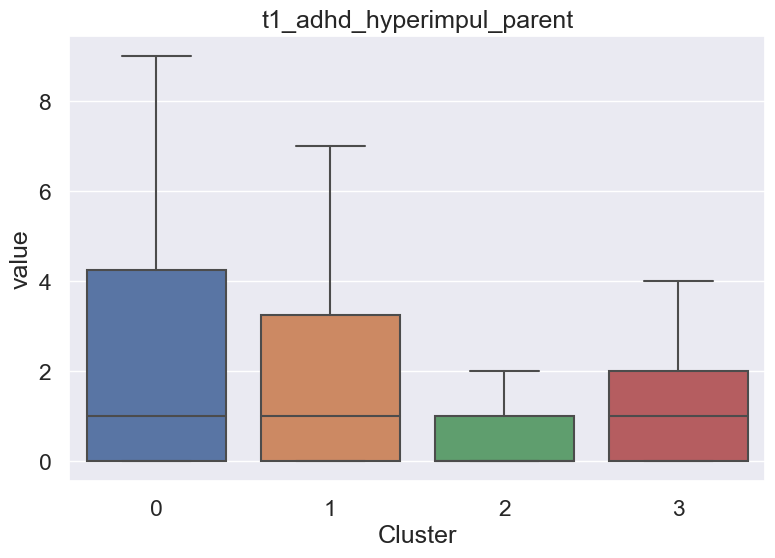

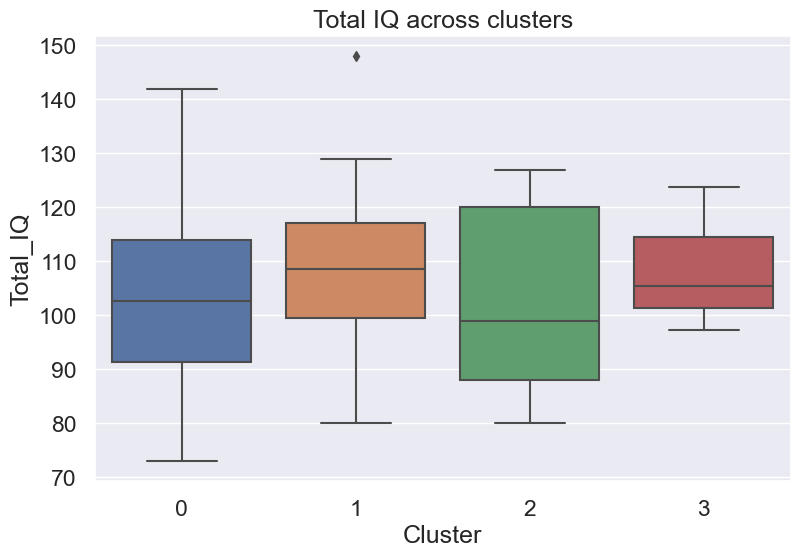

In [466]:

if (mode == 'clinic'):
    clinic_Z_df = Z_df_pred.copy()
    Scores =  ['t1_adi_social_total','t1_adi_communication_total', 't1_adi_rrb_total',
               't1_css_total_all', 't1_sa_css_all', 't1_rrb_css_all',
              't1_srs_tscore', 't1_srs_tscore_self',

              't1_rbs_total',
              't1_ssp_total',
             't1_adhd_inattentiv_parent', 't1_adhd_hyperimpul_parent']
    mode = 'clinic'
    # Remove all subjects having at least 1 NA 
    clinic_Z_df[Scores] = Z_df_pred[Scores].replace({999 : np.nan, 777 : np.nan})
    clinic_Z_df = clinic_Z_df.dropna(subset = Scores)

    # Find optimal number of clusters
    find_K(clinic_Z_df)
    n_clusters = int(input('How many clusters ? : '))
    #boot_clus = int(input('How many bootstrap iterations for clustering ?  : '))

    # Perform clustering with bootstrapping
    all_clus, GMM_df, super_clus = boot_clustering(1, clinic_Z_df)

elif (mode == 'genetic'):
    Scores = ['PGS_ASD_ipsych_Z',
             'PGS_ADHD_Z',
             'PGS_BMI_Z',
             'PGS_Chronotype_Z',
             'PGS_EduYears_Z',
             'PGS_Epilepsy_Z',
             'PGS_EQ_Z',
             'PGS_Insomnia_Z',
             'PGS_Intelligence_Z',
             'PGS_MDD_Z',
             'PGS_Neuroticism_Z',
             'PGS_SCZ2_Z',
             'PGS_SQ_Z',
             'PGS_SWB_Z',
             'PGS_xDx_ipsych_Z']

    # Merge Z-scores with PGS, drop NA
    pgs_Z_df = Z_df_pred.merge(pgs_file.dropna(subset = Scores), on  = 'participant_id', how = 'inner')

    # Find number of clusters 
    find_K(pgs_Z_df)
    n_clusters = int(input('How many clusters ? : '))

    # Perform clustering with bootstrapping
    all_clus, GMM_df, super_clus = boot_clustering(1, pgs_Z_df)

df_melt = pd.melt(GMM_df, value_vars = Scores, id_vars = 'Cluster')
df_melt['ASD'] = 'ASD'

print(GMM_df['Cluster'].value_counts(sort = False))
for s in Scores:
    
    
    ax = sns.boxplot(x = 
                     df_melt.loc[df_melt['variable'] == s]['Cluster'], 
                     y = df_melt.loc[df_melt['variable'] == s]['value']).set_title(s)

    plt.show()
# Distribution of total IQ across clusters
ax = sns.boxplot(x = 
                     GMM_df['Cluster'], 
                     y = GMM_df['Total_IQ']).set_title('Total IQ across clusters')

plt.show()

A faire :
Indice : Calculer 10% top absolute valeur pour chaque individu, puis trimmed mean 10% sur tous les ASD

Hierarchical clustering


# MAPPING VISUALISATION 

## Import  packages and functions, load Z-Scores

In [79]:
from enigmatoolbox.utils.parcellation import parcel_to_surface
from enigmatoolbox.plotting import plot_cortical

In [64]:
def compute_abs_prevalence(Z_df_est):
    prev_est= {}
    for i in Z_df_est.columns:
        prev_est.update({i : [Z_df_est.query(f'{i} > 2 or {i} < -2').count()[1]/Z_df_est.shape[0]]})
    prev_est = pd.DataFrame.from_dict(prev_est)
    
    return prev_est

In [65]:
def compute_positive_prevalence(Z_df_est):
    prev_est= {}
    for i in Z_df_est.columns:
        prev_est.update({i : [Z_df_est.query(f'{i} > 2').count()[1]/Z_df_est.shape[0]]})
    prev_est = pd.DataFrame.from_dict(prev_est)
    
    return prev_est

In [66]:
def compute_negative_prevalence(Z_df_est):
    prev_est= {}
    for i in Z_df_est.columns:
        prev_est.update({i : [Z_df_est.query(f'{i} < -2').count()[1]/Z_df_est.shape[0]]})
    prev_est = pd.DataFrame.from_dict(prev_est)
    
    return prev_est

In [67]:
# Load Z-Scores files
Z_pred = {}

for idp_num, idp in enumerate(idp_ids): 
    idp_dir = os.path.join(out_dir, idp)
    os.chdir(idp_dir)
    f = open("Z_predict.txt", "r")
    Z_pred.update({f'{idp}_Z_predict' : f.readlines()})
    
Z_df_pred = pd.DataFrame(Z_pred).astype(float)
Z_df_pred

,lh_bankssts_thickness_Z_predict,lh_caudalanteriorcingulate_thickness_Z_predict,lh_caudalmiddlefrontal_thickness_Z_predict,lh_cuneus_thickness_Z_predict,lh_entorhinal_thickness_Z_predict,lh_fusiform_thickness_Z_predict,lh_inferiorparietal_thickness_Z_predict,lh_inferiortemporal_thickness_Z_predict,lh_isthmuscingulate_thickness_Z_predict,lh_lateraloccipital_thickness_Z_predict,...,rh_rostralanteriorcingulate_thickness_Z_predict,rh_rostralmiddlefrontal_thickness_Z_predict,rh_superiorfrontal_thickness_Z_predict,rh_superiorparietal_thickness_Z_predict,rh_superiortemporal_thickness_Z_predict,rh_supramarginal_thickness_Z_predict,rh_frontalpole_thickness_Z_predict,rh_temporalpole_thickness_Z_predict,rh_transversetemporal_thickness_Z_predict,rh_insula_thickness_Z_predict
0,1.507266,0.236732,2.621357,1.512171,-1.136739,1.513725,1.153623,1.594443,0.425976,2.441638,...,1.509244,2.986704,5.337528,1.878804,0.651769,0.347170,3.431805,-1.011597,1.936229,1.859141
1,-0.120842,-0.836287,0.338266,-0.182841,-0.121476,1.197081,-0.472605,0.693770,-0.237579,1.113092,...,-0.965408,-0.959422,-1.240825,0.618328,0.348414,0.794335,-1.143462,0.788767,1.171050,-0.307516
2,1.127602,1.737892,-1.772021,1.037212,-0.443215,-0.186077,0.764058,0.612407,1.229155,-0.648260,...,0.776549,0.297451,0.367218,1.541168,0.576820,-1.409703,1.190953,0.805265,0.475520,0.840349
3,0.340455,0.934964,-0.411925,0.261126,-0.047256,1.127053,0.177239,1.256318,0.882114,0.376171,...,2.375757,0.645227,1.164636,-0.190405,0.367794,-0.570016,3.061940,0.576443,1.128817,1.356728
4,0.713813,0.739870,-1.207970,-0.417295,0.073169,0.910795,1.133162,1.361305,0.221311,-0.229158,...,2.251592,0.468762,-0.476940,-0.140255,-0.055086,-1.010670,0.010818,0.494459,-0.129577,0.176651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,0.158670,0.376251,1.010209,1.889009,1.345235,-0.519864,0.491312,0.247470,1.001658,-0.075152,...,-0.595842,0.419319,1.125582,1.960164,0.376632,0.465541,0.414006,0.055858,-1.051096,-1.262016
805,-0.467083,0.207700,-0.168614,-0.375461,-0.674729,0.094527,-1.027575,0.301000,1.011085,-0.860051,...,0.764708,-1.298094,-0.519043,-1.087406,-0.208035,-1.652095,2.598192,-1.287109,-0.515323,-0.918337
806,0.893370,-0.114196,0.166616,0.867427,0.106180,0.648294,1.307220,-0.555407,-0.488620,1.088675,...,-0.547079,0.975327,0.538375,1.166565,-0.212798,0.586887,-1.093834,-0.108453,-0.477395,0.078852
807,0.844360,-0.857314,-0.889243,-1.053318,-0.530609,-0.299297,0.215319,0.409202,0.022243,-0.184963,...,0.944124,0.381811,-1.070535,0.316065,-0.025370,0.768481,-1.524592,-0.426112,0.825053,-0.531495


# COMPARE WITH ENIGMA

In [347]:
from enigmatoolbox.datasets import load_summary_stats



In [348]:
def brain_maps(X):
    CT_d_fsa5 = parcel_to_surface(X, 'aparc_fsa5')
    plot_cortical(array_name=CT_d_fsa5, surface_name="fsa5", size=(800, 400),
                  cmap='RdBu_r', color_bar=True, color_range=(-abs(X).max(), abs(X).max()))

In [349]:
# Load summary statistics for ENIGMA-Autism
sum_stats = load_summary_stats('asd')

# Get case-control cortical thickness table
CT = sum_stats['CortThick_case_vs_controls_meta_analysis']

# Extract Cohen's d values
CT_d = CT['d_icv']

In [350]:
brain_maps(CT_d)

In [377]:
Z_df_pred = fetch_raw_Z()
Z_df_pred = Z_df_pred.drop(Z_df_pred.loc[Z_df_pred[cols_df].mean(axis = 1) > 3].index)

# Merge Z-scores with participants infos
Z_df_pred = Z_df_pred.join(df_te2.reset_index())

In [388]:
x = Z_df_pred.loc[Z_df_pred.ASD == 'Yes'][cols_df].mean()
y = Z_df_pred.loc[Z_df_pred.ASD == 'No'][cols_df].mean()
sd_xy = Z_df_pred[cols_df].std(axis = 0)

In [389]:
d_Cohen = (x - y)/sd_xy

In [391]:
brain_maps(d_Cohen)

## Compute prevalence

In [68]:
idx_asd = list(df_te2.loc[df_te2['ASD'] == 'Yes'].index)
idx_td = list(df_te2.loc[df_te2['ASD'] == 'No'].index)
Z_df_est = Z_df_pred.loc[idx_td]
Z_df_pred = Z_df_pred.loc[idx_asd]

In [69]:
print('TD count : ', Z_df_est.shape[0])
print('ASD count : ', Z_df_pred.shape[0])

TD count :  209
ASD count :  600


In [70]:
# Compute prevalence of Z > 2 
pos_prev_TD = compute_positive_prevalence(Z_df_est)
pos_prev_ASD = compute_positive_prevalence(Z_df_pred)

In [71]:
# Compute prevalence of |Z| > 2
abs_TD = compute_abs_prevalence(Z_df_est)
abs_ASD = compute_abs_prevalence(Z_df_pred)

In [72]:
# Compute prevalence of Z < -2
neg_prev_TD = compute_negative_prevalence(Z_df_est)
neg_prev_ASD = compute_negative_prevalence(Z_df_pred)

## Mapping prevalence on brain atlas

In [93]:
pr_bool = input('To map Z > 2 : "pos"\nTo map Z < -2 : "neg"\nTo map |Z| > 2 : "abs"\n')

To map Z > 2 : "pos"
To map Z < -2 : "neg"
To map |Z|>2 : "abs"
abs


In [75]:
# Compute pr(|Z|asd > 2) - pr(|Z|td > 2)
if (pr_bool == 'abs'):    
    diff = abs_ASD.values - abs_TD.values
elif (pr_bool == 'pos'):
    diff = pos_prev_ASD.values - pos_prev_TD.values
elif (pr_bool == 'neg'):
    diff = neg_prev_ASD.values - neg_prev_TD.values

In [89]:
CT_d_fsa5 = parcel_to_surface(diff, 'aparc_fsa5')
plot_cortical(array_name=CT_d_fsa5, surface_name="fsa5", size=(800, 400),
              cmap='RdBu_r', color_bar=True, color_range=(-round(diff.max(), 2), round(diff.max(),2)))

## Map of explained variance 

In [110]:
print(blr_metrics['EV'].max())
print(blr_metrics['EV'].min())

0.6642217918854881
-0.036931442970250083


In [111]:
CT_d_fsa5 = parcel_to_surface(blr_metrics['EV'], 'aparc_fsa5')
plot_cortical(array_name=CT_d_fsa5, surface_name="fsa5", size=(800, 400),
              cmap='RdBu_r', color_bar=True, color_range=(-0.7, 0.7))